In [88]:
import os
os.getcwd()

'/home/peyman/Documents/PhD_UiS/optimum-techinvest/powell_seqdec/stochastic-optimization/AssetSelling'

In [89]:
import pandas as pd
import numpy as np
from collections import namedtuple
import matplotlib.pyplot as plt
from copy import copy
import math

In [90]:
from AssetSellingModel import AssetSellingModel
from AssetSellingPolicy import AssetSellingPolicy

In [91]:
sheet1= pd.read_excel("asset_selling_policy_parameters.xlsx", sheet_name="Sheet1")

In [52]:
sheet1

,Unnamed: 0,param1,param2
0,sell_low,2,NaN
1,high_low,4,10.0
2,track,0,4.0


In [53]:
params = zip(sheet1["param1"], sheet1["param2"])
param_list = list(params)
param_list

[(2, nan), (4, 10.0), (0, 4.0)]

In [54]:
sheet2 = pd.read_excel("asset_selling_policy_parameters.xlsx", sheet_name="Sheet2")
sheet2

,low_min,low_max,high_min,high_max,increment_size
0,0,0,0.01,5,0.005


In [55]:
sheet3 = pd.read_excel("asset_selling_policy_parameters.xlsx", sheet_name="Sheet3")
sheet3

,Policy,TimeHorizon,DiscountFactor,InitialPrice,InitialBias,UpStep,DownStep,Variance,Iterations,PrintStep
0,track,40,0.99,16,Up,1,-1,2,10000,40


In [56]:
biasdf = pd.read_excel("asset_selling_policy_parameters_edit.xlsx", sheet_name="Sheet4")
biasdf_edit=biasdf.set_index('additional')
biasdf_edit

,Up,Neutral,Down
additional,,,
Up,0.9,0.1,0.0
Neutral,0.2,0.6,0.2
Down,0.0,0.1,0.9


In [57]:
policy_selected = sheet3['Policy'][0]
print("The selected policy is: {}".format(policy_selected))
print("\n")

T = sheet3['TimeHorizon'][0]
print("The T value is: {}".format(T))
print("\n")

initPrice = sheet3['InitialPrice'][0]
print("The initial price is: {}".format(initPrice))
print("\n")

initBias = sheet3['InitialBias'][0]
print("The initial Bias is: {}".format(initBias))    
print("\n")

exog_params = {'UpStep':sheet3['UpStep'][0],'DownStep':sheet3['DownStep'][0],'Variance':sheet3['Variance'][0],'biasdf'
               :biasdf_edit}
print("The exog_params is: {}".format(exog_params))    
print("\n")   
    
nIterations = sheet3['Iterations'][0]
print("The nIteration is: {}".format(nIterations))    
print("\n")   

printStep = sheet3['PrintStep'][0]
print("The printStep is: {}".format(printStep))    
print("\n")

printIterations = [0]
print("The printIterations is: {}".format(printIterations))    
print("\n")

printIterations.extend(list(reversed(range(nIterations-1,0,-printStep))))

The selected policy is: track


The T value is: 40


The initial price is: 16


The initial Bias is: Up


The exog_params is: {'UpStep': 1, 'DownStep': -1, 'Variance': 2, 'biasdf':              Up  Neutral  Down
additional                    
Up          0.9      0.1   0.0
Neutral     0.2      0.6   0.2
Down        0.0      0.1   0.9}


The nIteration is: 10000


The printStep is: 40


The printIterations is: [0]




In [58]:
policy_names = ['sell_low', 'high_low', 'track']
print("policy_names are: {}".format(policy_names))    
print("\n")

state_names = ['price', 'resource','bias']
print("state_names are: {}".format(state_names))    
print("\n")

init_state = {'price': initPrice, 'resource': 1,'bias':initBias}
print("init_state are: {}".format(init_state))    
print("\n")


decision_names = ['sell', 'hold']
print("decision_names are: {}".format(decision_names))    
print("\n")

policy_names are: ['sell_low', 'high_low', 'track']


state_names are: ['price', 'resource', 'bias']


init_state are: {'price': 16, 'resource': 1, 'bias': 'Up'}


decision_names are: ['sell', 'hold']




In [59]:
biasdf = exog_params["biasdf"]
print("the biasdf_edit is \n .{}".format(biasdf))
print(type(biasdf))
biasdf= biasdf.cumsum(axis =1)

the biasdf_edit is 
 .             Up  Neutral  Down
additional                    
Up          0.9      0.1   0.0
Neutral     0.2      0.6   0.2
Down        0.0      0.1   0.9
<class 'pandas.core.frame.DataFrame'>


In [92]:
M = AssetSellingModel(state_names, decision_names, init_state,exog_params,T)

In [93]:
P = AssetSellingPolicy(M, policy_names)

In [74]:
t = 0
prev_price = init_state['price']

In [75]:
policy_info = {'sell_low': param_list[0],
                   'high_low': param_list[1],
                   'track': param_list[2] + (prev_price,)}

In [17]:
policy_info

{'sell_low': (2, nan), 'high_low': (4, 10.0), 'track': (0, 4.0, 16)}

Selected policy track, time horizon 40, initial price 16 and number of iterations 10000
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4139840589481404  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.818962962840924, x=Decision(sell=0, hold=1)
coin  0.8487800961190239  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.844213500127637, x=Decision(sell=1, hold=0)
coin  0.45203620488154816  curr_bias  Up  new_bias  Up
obj=15.844213500127637, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2720800519673423  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.325169358615813, x=Decision(sell=0, hold=1)
coin  0.905534061916374  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.41361453720127, x=Decision(sell=1, hold=0)
coin  0.3755268704762992  curr_bias  Neutral  new_bias  Neutral
obj=17.41361453720127, state.resource=0
time=0, o

coin  0.9271839972039936  curr_bias  Up  new_bias  Neutral
obj=15.401284707063024, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.15478123011988687  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.307552066805336, x=Decision(sell=0, hold=1)
coin  0.974945570660559  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.856217882148293, x=Decision(sell=1, hold=0)
coin  0.5698984593718842  curr_bias  Neutral  new_bias  Neutral
obj=14.856217882148293, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07527831520902994  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.540059631141066, x=Decision(sell=1, hold=0)
coin  0.8145363043106949  curr_bias  Up  new_bias  Up
obj=14.540059631141066, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5207088734398683  curr_bias  Up  new_bias  Up
time=1, ob

coin  0.7692542969978958  curr_bias  Up  new_bias  Up
obj=17.69791568813509, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4666057788782768  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.213921670510192, x=Decision(sell=1, hold=0)
coin  0.6450605780378182  curr_bias  Up  new_bias  Up
obj=15.213921670510192, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.574767314252736  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.178492567783778, x=Decision(sell=0, hold=1)
coin  0.5667465436711546  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.85097319324976, x=Decision(sell=1, hold=0)
coin  0.9020955192605001  curr_bias  Up  new_bias  Neutral
obj=18.85097319324976, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8222738011433415  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1,

coin  0.611420510010489  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.833750349952613, x=Decision(sell=0, hold=1)
coin  0.3914464395359889  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.304986790088947, x=Decision(sell=0, hold=1)
coin  0.4271199132018396  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=27.051438673667562, x=Decision(sell=0, hold=1)
coin  0.5187182306069512  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=26.734594184975222, x=Decision(sell=1, hold=0)
coin  0.23602133098599065  curr_bias  Up  new_bias  Up
obj=26.734594184975222, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4069046212686722  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.012055357186906, x=Decision(sell=0, hold=1)
coin  0.5731915218656486  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.617867382275366, x=Decision(sell=1, hol

coin  0.629046515459841  curr_bias  Up  new_bias  Up
obj=16.201260267322223, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.49269640229141753  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.74793676870072, x=Decision(sell=0, hold=1)
coin  0.43550486032572866  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.103381167298146, x=Decision(sell=0, hold=1)
coin  0.742627110402717  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.202078908697317, x=Decision(sell=0, hold=1)
coin  0.9879349658707317  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=16.435552939943708, x=Decision(sell=1, hold=0)
coin  0.0026925237780884848  curr_bias  Neutral  new_bias  Up
obj=16.435552939943708, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.15442812139869788  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.9

coin  0.2129749249908628  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.872865397277195, x=Decision(sell=0, hold=1)
coin  0.5359249969050529  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=24.282294394930126, x=Decision(sell=0, hold=1)
coin  0.05413099687136402  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.135448832266768, x=Decision(sell=1, hold=0)
coin  0.2126073018618193  curr_bias  Up  new_bias  Up
obj=23.135448832266768, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5695776722517057  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.002780574838546, x=Decision(sell=0, hold=1)
coin  0.07198980137539501  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.076232412894495, x=Decision(sell=0, hold=1)
coin  0.8684122283653285  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.302858276273657, x=Decision(sell=0, h

coin  7.818739978904254e-05  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.614923118501906, x=Decision(sell=0, hold=1)
coin  0.8307075644497041  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.242966106648748, x=Decision(sell=0, hold=1)
coin  0.9355385340800391  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=22.399484675996057, x=Decision(sell=0, hold=1)
coin  0.22780843152598773  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=17.867341190042545, x=Decision(sell=1, hold=0)
coin  0.3951169208046722  curr_bias  Neutral  new_bias  Neutral
obj=17.867341190042545, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4440861409336161  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.502813102385673, x=Decision(sell=1, hold=0)
coin  0.5769737789850088  curr_bias  Up  new_bias  Up
obj=14.502813102385673, state.resource=0
time=0, obj

coin  0.24217682591840584  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.404532366366936, x=Decision(sell=0, hold=1)
coin  0.20562062545613125  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.92281650747551, x=Decision(sell=1, hold=0)
coin  0.7713566608147978  curr_bias  Up  new_bias  Up
obj=14.92281650747551, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7039168283123028  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.71370097844936, x=Decision(sell=0, hold=1)
coin  0.7838174034561181  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.16714115986414, x=Decision(sell=0, hold=1)
coin  0.13727057433816303  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.425408501095024, x=Decision(sell=0, hold=1)
coin  0.31985321866617966  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.56499619291372, x=Decision(sell=0, hold

coin  0.8652198413898227  curr_bias  Up  new_bias  Up
obj=20.44177156530631, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8527142624809432  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.033200008625192, x=Decision(sell=1, hold=0)
coin  0.15457860954252012  curr_bias  Up  new_bias  Up
obj=15.033200008625192, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.691231723950031  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.636866906519973, x=Decision(sell=0, hold=1)
coin  0.16849548971574435  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.245111500118703, x=Decision(sell=0, hold=1)
coin  0.6965522600782769  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.61333020053462, x=Decision(sell=1, hold=0)
coin  0.3110837995046156  curr_bias  Up  new_bias  Up
obj=19.61333020053462, state.resource=0
time=0, obj=0.0, 

coin  0.7744067388831335  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.690335876411172, x=Decision(sell=0, hold=1)
coin  0.7976901678414797  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=17.890452332682106, x=Decision(sell=1, hold=0)
coin  0.8183507556461257  curr_bias  Up  new_bias  Up
obj=17.890452332682106, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.803028975083282  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.93468704374748, x=Decision(sell=0, hold=1)
coin  0.6895358377296583  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.045931244633678, x=Decision(sell=0, hold=1)
coin  0.57243279680524  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=14.905725118463577, x=Decision(sell=1, hold=0)
coin  0.791601764025445  curr_bias  Up  new_bias  Up
obj=14.905725118463577, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=

coin  0.7698929638394238  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.90371803480319, x=Decision(sell=0, hold=1)
coin  0.11893348353564714  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=20.256309784001385, x=Decision(sell=1, hold=0)
coin  0.39270169677179556  curr_bias  Up  new_bias  Up
obj=20.256309784001385, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.690453152609428  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.98578541012976, x=Decision(sell=0, hold=1)
coin  0.302277141016542  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.179526931355174, x=Decision(sell=0, hold=1)
coin  0.33830637114311946  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.78598110520374, x=Decision(sell=1, hold=0)
coin  0.9598711715611608  curr_bias  Up  new_bias  Neutral
obj=17.78598110520374, state.resource=0
time=0, obj=0.0, s.resource=1, s.price

coin  0.9892454168886665  curr_bias  Up  new_bias  Neutral
obj=22.434944049394993, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6543440639817674  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.798198307841922, x=Decision(sell=0, hold=1)
coin  0.23836442051646878  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.79111509444921, x=Decision(sell=0, hold=1)
coin  0.5809243001059877  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.475050246146974, x=Decision(sell=0, hold=1)
coin  0.0714555853957125  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.468540068232247, x=Decision(sell=1, hold=0)
coin  0.4177207300749406  curr_bias  Up  new_bias  Up
obj=18.468540068232247, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.09333301546468475  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.55354616

coin  0.6357862635139889  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=25.23794020931729, x=Decision(sell=0, hold=1)
coin  0.7000607297173252  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=24.26457931597672, x=Decision(sell=1, hold=0)
coin  0.2069546736470521  curr_bias  Up  new_bias  Up
obj=24.26457931597672, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8723889927151144  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.82044556944866, x=Decision(sell=1, hold=0)
coin  0.7712919582280388  curr_bias  Up  new_bias  Up
obj=15.82044556944866, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4592475025511794  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.404797695457294, x=Decision(sell=0, hold=1)
coin  0.6387219604751715  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.736266005768332, x=

coin  0.7334296435881  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.793473714118534, x=Decision(sell=1, hold=0)
coin  0.48476959562159117  curr_bias  Up  new_bias  Up
obj=20.793473714118534, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.20955627427748813  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.653406586778374, x=Decision(sell=0, hold=1)
coin  0.4515349341507885  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=25.739200629048, x=Decision(sell=0, hold=1)
coin  0.7098420066244491  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=27.586756522015584, x=Decision(sell=0, hold=1)
coin  0.3687857102256771  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=27.714727891987202, x=Decision(sell=0, hold=1)
coin  0.05891099828078428  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26.013153835624063, x=Decision(sell=1, hold=0

coin  0.7384823579691162  curr_bias  Up  new_bias  Up
obj=17.115319058032227, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.522704031070061  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.115222587133307, x=Decision(sell=0, hold=1)
coin  0.3025995775235756  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.05267007514138, x=Decision(sell=1, hold=0)
coin  0.7545835408789968  curr_bias  Up  new_bias  Up
obj=16.05267007514138, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.28056986965451414  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.050901372542016, x=Decision(sell=1, hold=0)
coin  0.07775192698135014  curr_bias  Up  new_bias  Up
obj=14.050901372542016, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.02189387899733286  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, 

coin  0.8260677400942738  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=26.833186315222946, x=Decision(sell=1, hold=0)
coin  0.9164270256064763  curr_bias  Up  new_bias  Neutral
obj=26.833186315222946, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8316248936590385  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.57029563160937, x=Decision(sell=0, hold=1)
coin  0.8554556750395167  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.067120097525205, x=Decision(sell=0, hold=1)
coin  0.9782041939249944  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=19.118966697600925, x=Decision(sell=1, hold=0)
coin  0.8318226222441861  curr_bias  Neutral  new_bias  Neutral
obj=19.118966697600925, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8155894078486714  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.pric

coin  0.9746623029619649  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.743629236553637, x=Decision(sell=0, hold=1)
coin  0.774035221503661  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=18.70821679514638, x=Decision(sell=0, hold=1)
coin  0.7363351585693644  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=13.383061558161675, x=Decision(sell=1, hold=0)
coin  0.546788049921802  curr_bias  Neutral  new_bias  Neutral
obj=13.383061558161675, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7959265759810996  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.02410100939902, x=Decision(sell=0, hold=1)
coin  0.17978268934217145  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.41483872333889, x=Decision(sell=0, hold=1)
coin  0.014346224862496482  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.685595

coin  0.4502227832718978  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.32286054412038, x=Decision(sell=0, hold=1)
coin  0.05759400349876442  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.927358084427592, x=Decision(sell=1, hold=0)
coin  0.5547855738985231  curr_bias  Up  new_bias  Up
obj=16.927358084427592, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.004938466067184399  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.604189049238588, x=Decision(sell=0, hold=1)
coin  0.2935515780471818  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.38560490229188, x=Decision(sell=1, hold=0)
coin  0.8833329282792871  curr_bias  Up  new_bias  Up
obj=17.38560490229188, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3593692434670539  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.82858193011959

coin  0.45623716922516644  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.870917644961484, x=Decision(sell=0, hold=1)
coin  0.04142678300764191  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.578952325001762, x=Decision(sell=1, hold=0)
coin  0.07833363683019934  curr_bias  Up  new_bias  Up
obj=15.578952325001762, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.44285408610026433  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.794420605953547, x=Decision(sell=0, hold=1)
coin  0.3583097637115298  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.95043040060157, x=Decision(sell=0, hold=1)
coin  0.2753738424511486  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.6202266761845, x=Decision(sell=0, hold=1)
coin  0.356065452371796  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.953563284566393, x=Decision(sell=0, hol

coin  0.1932636560193255  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.746856268325436, x=Decision(sell=1, hold=0)
coin  0.6945113690594464  curr_bias  Up  new_bias  Up
obj=13.746856268325436, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8166711145587868  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.3695726300706, x=Decision(sell=0, hold=1)
coin  0.11047276643804427  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.903017586113519, x=Decision(sell=1, hold=0)
coin  0.134658009495361  curr_bias  Up  new_bias  Up
obj=15.903017586113519, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7776444380211818  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.1779327710573, x=Decision(sell=0, hold=1)
coin  0.5369316497305244  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.32146407767626, x=

coin  0.010570302344435012  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=25.182782946339337, x=Decision(sell=0, hold=1)
coin  0.8911489745583203  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=25.511961845264175, x=Decision(sell=0, hold=1)
coin  0.8324566980814911  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.064230600454962, x=Decision(sell=1, hold=0)
coin  0.9642454789493897  curr_bias  Up  new_bias  Neutral
obj=25.064230600454962, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.18466978807502155  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.519354704050222, x=Decision(sell=1, hold=0)
coin  0.3843705695993881  curr_bias  Up  new_bias  Up
obj=15.519354704050222, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9967020428266199  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=12.9

coin  0.9858836791237336  curr_bias  Up  new_bias  Neutral
time=20, obj=0.0, s.resource=1, s.price=39.23253842844396, x=Decision(sell=0, hold=1)
coin  0.21939702732106114  curr_bias  Neutral  new_bias  Neutral
time=21, obj=0.0, s.resource=1, s.price=39.56241220768482, x=Decision(sell=0, hold=1)
coin  0.6624481632841777  curr_bias  Neutral  new_bias  Neutral
time=22, obj=0.0, s.resource=1, s.price=39.45543118031287, x=Decision(sell=1, hold=0)
coin  0.5951966733452  curr_bias  Neutral  new_bias  Neutral
obj=39.45543118031287, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.03322476865048751  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.485590316929486, x=Decision(sell=0, hold=1)
coin  0.37662236358546686  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.4744344258468, x=Decision(sell=0, hold=1)
coin  0.08025353735639251  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.602859

coin  0.3203766276947395  curr_bias  Up  new_bias  Up
obj=16.153377432800458, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5787804682988038  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.00901971774769, x=Decision(sell=0, hold=1)
coin  0.5566398300170247  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.971448364202402, x=Decision(sell=0, hold=1)
coin  0.20643693400282193  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.486091004722372, x=Decision(sell=0, hold=1)
coin  0.6928447790757337  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.95369160863856, x=Decision(sell=1, hold=0)
coin  0.40364911780854495  curr_bias  Up  new_bias  Up
obj=22.95369160863856, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.19550315574733268  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.56650625100733

coin  0.3457362599449926  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.227945839469065, x=Decision(sell=1, hold=0)
coin  0.06974885851539403  curr_bias  Up  new_bias  Up
obj=12.227945839469065, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3964476880449599  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.846715936104566, x=Decision(sell=0, hold=1)
coin  0.13460243876157396  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.494907748579758, x=Decision(sell=1, hold=0)
coin  0.6770627482241147  curr_bias  Up  new_bias  Up
obj=15.494907748579758, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.17079399089115965  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.835415382961617, x=Decision(sell=0, hold=1)
coin  0.9350892951122657  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.621514

coin  0.7381169414170788  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.37403170132984, x=Decision(sell=0, hold=1)
coin  0.12390762117970189  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.790278394298525, x=Decision(sell=0, hold=1)
coin  0.8293021204614315  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.44424319503128, x=Decision(sell=1, hold=0)
coin  0.9007212864964568  curr_bias  Up  new_bias  Neutral
obj=20.44424319503128, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7208563158205082  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.447826369094475, x=Decision(sell=0, hold=1)
coin  0.44141171319280714  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.915797791570363, x=Decision(sell=1, hold=0)
coin  0.6886547979296795  curr_bias  Up  new_bias  Up
obj=16.915797791570363, state.resource=0
time=0, obj=0.0, s.resource=1, s.pri

coin  0.3925755024062365  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.493280815425216, x=Decision(sell=0, hold=1)
coin  0.463034266153065  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.346253831762752, x=Decision(sell=0, hold=1)
coin  0.8516958607104073  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.598930004095273, x=Decision(sell=0, hold=1)
coin  0.9884190647348864  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=18.261039935087602, x=Decision(sell=1, hold=0)
coin  0.717818047373692  curr_bias  Neutral  new_bias  Neutral
obj=18.261039935087602, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5129309575009947  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.120407403450674, x=Decision(sell=0, hold=1)
coin  0.06372784757008221  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.655622333560956, x=Decisi

coin  0.49926144754968094  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=24.724601808025586, x=Decision(sell=0, hold=1)
coin  0.6737089285144215  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=23.230861104128373, x=Decision(sell=1, hold=0)
coin  0.7460294770984477  curr_bias  Neutral  new_bias  Neutral
obj=23.230861104128373, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3588499839079031  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.631677141181385, x=Decision(sell=0, hold=1)
coin  0.5650277844770635  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.004848050298854, x=Decision(sell=1, hold=0)
coin  0.5005116028087165  curr_bias  Up  new_bias  Up
obj=16.004848050298854, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.514434876591571  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resourc

coin  0.43510000482243893  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=29.113497740801023, x=Decision(sell=0, hold=1)
coin  0.7031317391945004  curr_bias  Up  new_bias  Up
time=11, obj=0.0, s.resource=1, s.price=27.274779060121773, x=Decision(sell=1, hold=0)
coin  0.40271791676679436  curr_bias  Up  new_bias  Up
obj=27.274779060121773, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9011778950685906  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.242038345149947, x=Decision(sell=0, hold=1)
coin  0.487558976759364  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.345757671358335, x=Decision(sell=0, hold=1)
coin  0.7619751543639861  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=17.88491720282418, x=Decision(sell=1, hold=0)
coin  0.7292779147310992  curr_bias  Neutral  new_bias  Neutral
obj=17.88491720282418, state.resource=0
time

coin  0.7583833888783502  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.590304863687784, x=Decision(sell=0, hold=1)
coin  0.4493708219235615  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.740700823082243, x=Decision(sell=1, hold=0)
coin  0.7625519642749704  curr_bias  Up  new_bias  Up
obj=20.740700823082243, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5168995679436761  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.503582403510812, x=Decision(sell=1, hold=0)
coin  0.5134537717817744  curr_bias  Up  new_bias  Up
obj=15.503582403510812, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.31938424554095357  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.914503435821345, x=Decision(sell=0, hold=1)
coin  0.703450584881645  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.534353192472, 

coin  0.10122521961679576  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=41.04360499058303, x=Decision(sell=0, hold=1)
coin  0.7951347709185626  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=44.33287694006382, x=Decision(sell=0, hold=1)
coin  0.782624260515215  curr_bias  Up  new_bias  Up
time=11, obj=0.0, s.resource=1, s.price=42.76790454233156, x=Decision(sell=1, hold=0)
coin  0.12448729476921994  curr_bias  Up  new_bias  Up
obj=42.76790454233156, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7274126987742086  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.20452234642443, x=Decision(sell=1, hold=0)
coin  0.9649034526475202  curr_bias  Up  new_bias  Neutral
obj=14.20452234642443, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8622791626114304  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.619399372186

coin  0.7595691575583293  curr_bias  Up  new_bias  Up
obj=18.68423187713293, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7129729780100046  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.25923548398035, x=Decision(sell=0, hold=1)
coin  0.7745392957674311  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.89266698008616, x=Decision(sell=0, hold=1)
coin  0.563218610247287  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.476782254809677, x=Decision(sell=1, hold=0)
coin  0.07992008904491732  curr_bias  Up  new_bias  Up
obj=17.476782254809677, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1605098774036946  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.21756818225607, x=Decision(sell=0, hold=1)
coin  0.7118766315120408  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.265925977085594, x

coin  0.7024575063619993  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.118809331978404, x=Decision(sell=1, hold=0)
coin  0.1912451010222671  curr_bias  Up  new_bias  Up
obj=19.118809331978404, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.581401294595884  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.38052814823799, x=Decision(sell=0, hold=1)
coin  0.30899005900781884  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.303194936550753, x=Decision(sell=0, hold=1)
coin  0.049540631221356546  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.38471807276972, x=Decision(sell=0, hold=1)
coin  0.5916066686268163  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.154338038521168, x=Decision(sell=1, hold=0)
coin  0.5565835019816929  curr_bias  Up  new_bias  Up
obj=17.154338038521168, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=1

coin  0.7237448025434102  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.262069235330397, x=Decision(sell=1, hold=0)
coin  0.35903889299078673  curr_bias  Up  new_bias  Up
obj=17.262069235330397, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.46217594967108033  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.82784251288363, x=Decision(sell=0, hold=1)
coin  0.7906801533771849  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.61453981412602, x=Decision(sell=0, hold=1)
coin  0.43834673338386765  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.942296589780454, x=Decision(sell=1, hold=0)
coin  0.7620280931096364  curr_bias  Up  new_bias  Up
obj=19.942296589780454, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3000613690068046  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.2914173810634

coin  0.5344581758846538  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.673433272290243, x=Decision(sell=1, hold=0)
coin  0.9771651948746558  curr_bias  Up  new_bias  Neutral
obj=14.673433272290243, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.26697400963962936  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.941893055655827, x=Decision(sell=1, hold=0)
coin  0.8118155641722498  curr_bias  Up  new_bias  Up
obj=13.941893055655827, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.54949991431248  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.544321564108156, x=Decision(sell=0, hold=1)
coin  0.9762581800758873  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.793201094318063, x=Decision(sell=1, hold=0)
coin  0.5393284763260523  curr_bias  Neutral  new_bias  Neutral
obj=14.793201094318063, state.resourc

coin  0.6814371424989745  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.57888468727983, x=Decision(sell=0, hold=1)
coin  0.7472289906771709  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.072540320367246, x=Decision(sell=0, hold=1)
coin  0.7000014832408213  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.70767658319285, x=Decision(sell=1, hold=0)
coin  0.7600952016219621  curr_bias  Up  new_bias  Up
obj=19.70767658319285, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.41831424679782436  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.81745888905497, x=Decision(sell=0, hold=1)
coin  0.7185285651526719  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.291859415889242, x=Decision(sell=0, hold=1)
coin  0.06575939698719047  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.853163483154972, x=Decision(sell=1, hold=

coin  0.05897958749963517  curr_bias  Up  new_bias  Up
obj=14.50024638272405, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9749691468035135  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.049601490606147, x=Decision(sell=0, hold=1)
coin  0.7548214305731307  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.028223627042237, x=Decision(sell=0, hold=1)
coin  0.2619765319910925  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.202823336682453, x=Decision(sell=1, hold=0)
coin  0.7595470259558613  curr_bias  Neutral  new_bias  Neutral
obj=15.202823336682453, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5852537792187413  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.40781302269021, x=Decision(sell=0, hold=1)
coin  0.8674243652197363  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.res

coin  0.9062825482844633  curr_bias  Up  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=29.510119327855495, x=Decision(sell=0, hold=1)
coin  0.07306571161158515  curr_bias  Neutral  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=31.481400445469635, x=Decision(sell=0, hold=1)
coin  0.2259683284879851  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=31.770799246512905, x=Decision(sell=0, hold=1)
coin  0.5554912265775657  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=33.91351533761297, x=Decision(sell=0, hold=1)
coin  0.5385321647146074  curr_bias  Up  new_bias  Up
time=11, obj=0.0, s.resource=1, s.price=35.81128098571598, x=Decision(sell=0, hold=1)
coin  0.9533912128215762  curr_bias  Up  new_bias  Neutral
time=12, obj=0.0, s.resource=1, s.price=32.10375551466254, x=Decision(sell=1, hold=0)
coin  0.6120661590320621  curr_bias  Neutral  new_bias  Neutral
obj=32.10375551466254, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=1

coin  0.4155285903588479  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.073083404468644, x=Decision(sell=0, hold=1)
coin  0.7099400371710707  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=22.037986388287678, x=Decision(sell=1, hold=0)
coin  0.13751944085066292  curr_bias  Up  new_bias  Up
obj=22.037986388287678, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3927927436157933  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.89663933266382, x=Decision(sell=1, hold=0)
coin  0.398972524563743  curr_bias  Up  new_bias  Up
obj=12.89663933266382, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.12048106591093921  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.558327200530664, x=Decision(sell=1, hold=0)
coin  0.5971126729825219  curr_bias  Up  new_bias  Up
obj=15.558327200530664, state.resource=0
time=0, obj=0.0,

coin  0.33471786256080405  curr_bias  Neutral  new_bias  Neutral
obj=15.351681655785834, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.730968009285315  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.95372475501502, x=Decision(sell=0, hold=1)
coin  0.16049197634270007  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.35162673083596, x=Decision(sell=0, hold=1)
coin  0.968206239482943  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=22.322398571596775, x=Decision(sell=0, hold=1)
coin  0.8266290054989456  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=22.424875282791874, x=Decision(sell=0, hold=1)
coin  0.914922957944591  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=22.564790105034756, x=Decision(sell=0, hold=1)
coin  0.39067021401279634  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price

coin  0.4301514426023859  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=26.80660869930557, x=Decision(sell=0, hold=1)
coin  0.9255965509981601  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=28.234354127934644, x=Decision(sell=0, hold=1)
coin  0.5982846752167691  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=23.896535024791188, x=Decision(sell=1, hold=0)
coin  0.2585794693865152  curr_bias  Neutral  new_bias  Neutral
obj=23.896535024791188, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8524526055416564  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.455931268744074, x=Decision(sell=0, hold=1)
coin  0.5566240194521044  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.917828888305923, x=Decision(sell=0, hold=1)
coin  0.8523129288464019  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.09323264575924,

coin  0.6748811159137074  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.377172587610836, x=Decision(sell=1, hold=0)
coin  0.34974370516018227  curr_bias  Up  new_bias  Up
obj=17.377172587610836, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7807186138571943  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.353238407526302, x=Decision(sell=1, hold=0)
coin  0.6290500644933337  curr_bias  Up  new_bias  Up
obj=13.353238407526302, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3303999525269603  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.697185512499885, x=Decision(sell=0, hold=1)
coin  0.25874087506699484  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.226974883929028, x=Decision(sell=1, hold=0)
coin  0.6078345292108371  curr_bias  Up  new_bias  Up
obj=17.226974883929028, state.resource=0
time=0, obj=0

coin  0.9208284364436442  curr_bias  Up  new_bias  Neutral
obj=18.690088814908506, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.982699060731002  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=19.04440177584923, x=Decision(sell=0, hold=1)
coin  0.983282749331433  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=20.072004387631743, x=Decision(sell=0, hold=1)
coin  0.7263046350533222  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=20.224287521516874, x=Decision(sell=0, hold=1)
coin  0.2619414359241746  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=21.003794381912765, x=Decision(sell=0, hold=1)
coin  0.5416461147271061  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=19.95469336406875, x=Decision(sell=1, hold=0)
coin  0.017905538596479365  curr_bias  Neutral  new_bias  Up
obj=19.95469336406875, state

coin  0.9680108678944026  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=20.799498362293658, x=Decision(sell=0, hold=1)
coin  0.25532238224350146  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=19.284994907315895, x=Decision(sell=1, hold=0)
coin  0.7678032761098683  curr_bias  Neutral  new_bias  Neutral
obj=19.284994907315895, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.878430689232758  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.889146092558228, x=Decision(sell=0, hold=1)
coin  0.6997191818128823  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.90056191795621, x=Decision(sell=0, hold=1)
coin  0.9847745880783648  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=17.633550343304876, x=Decision(sell=1, hold=0)
coin  0.49304039609065864  curr_bias  Neutral  new_bias  Neutral
obj=17.633550343304876, state.resource=0


coin  0.8995648819281247  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.591022565733763, x=Decision(sell=0, hold=1)
coin  0.7424241745623421  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.00951044622567, x=Decision(sell=1, hold=0)
coin  0.3502382974990801  curr_bias  Up  new_bias  Up
obj=17.00951044622567, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8423271882743011  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=22.365398529818712, x=Decision(sell=0, hold=1)
coin  0.2815323749728217  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.91675256291293, x=Decision(sell=0, hold=1)
coin  0.03506041392270509  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=26.517693268512076, x=Decision(sell=0, hold=1)
coin  0.3723196305814469  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=29.183036911723715, x=Decision(sell=0, hold=

coin  0.28042384741665605  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.76619323910425, x=Decision(sell=0, hold=1)
coin  0.41309721194896964  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.79534130410218, x=Decision(sell=0, hold=1)
coin  0.36160577386918247  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.803570833136785, x=Decision(sell=1, hold=0)
coin  0.7555199049693614  curr_bias  Up  new_bias  Up
obj=18.803570833136785, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3529395671416058  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.895983961057647, x=Decision(sell=1, hold=0)
coin  0.04042197851841045  curr_bias  Up  new_bias  Up
obj=14.895983961057647, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2086963724937918  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.288015260484

coin  0.0345513003140312  curr_bias  Neutral  new_bias  Up
obj=20.89787945618397, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9142386657257434  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.142879469279887, x=Decision(sell=0, hold=1)
coin  0.5249470259536146  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.553822784929075, x=Decision(sell=0, hold=1)
coin  0.32217945549349714  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.96962860285266, x=Decision(sell=1, hold=0)
coin  0.5239325868782553  curr_bias  Neutral  new_bias  Neutral
obj=15.96962860285266, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3412232070166574  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.484454397755503, x=Decision(sell=0, hold=1)
coin  0.9443785944938513  curr_bias  Up  new_bias  Neutral
time=2, obj=0

coin  0.5116056276395913  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.91749811996015, x=Decision(sell=1, hold=0)
coin  0.15491771644731778  curr_bias  Up  new_bias  Up
obj=19.91749811996015, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.203191528648495  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.556003766633612, x=Decision(sell=0, hold=1)
coin  0.7143063947257013  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.630305644783785, x=Decision(sell=0, hold=1)
coin  0.06627643382441895  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.838385261436397, x=Decision(sell=1, hold=0)
coin  0.5581257279955728  curr_bias  Up  new_bias  Up
obj=16.838385261436397, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.565827461532831  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.912384197561522,

coin  0.7514920832705864  curr_bias  Up  new_bias  Up
obj=21.76121699471321, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5080789540223767  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.518368495991076, x=Decision(sell=0, hold=1)
coin  0.029018974892680127  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.131339362363974, x=Decision(sell=1, hold=0)
coin  0.7577007377423652  curr_bias  Up  new_bias  Up
obj=15.131339362363974, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7908972065691354  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.862110335021212, x=Decision(sell=1, hold=0)
coin  0.9049382353366506  curr_bias  Up  new_bias  Neutral
obj=15.862110335021212, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3183291741673162  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resour

coin  0.12648033484242782  curr_bias  Neutral  new_bias  Up
obj=15.654483718571875, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.0696558024030729  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.888346461426083, x=Decision(sell=1, hold=0)
coin  0.47383630018198564  curr_bias  Up  new_bias  Up
obj=15.888346461426083, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.27407736060125165  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.410150179926598, x=Decision(sell=1, hold=0)
coin  0.5394987481357889  curr_bias  Up  new_bias  Up
obj=15.410150179926598, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8353353689471377  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.093273892399141, x=Decision(sell=1, hold=0)
coin  0.12299611364766916  curr_bias  Up  new_bias  Up
obj=14.093273892399141

coin  0.5547167477398208  curr_bias  Up  new_bias  Up
obj=15.902897204694588, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5318816116007457  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.70572021107317, x=Decision(sell=0, hold=1)
coin  0.32149193887047434  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.16762631680419, x=Decision(sell=1, hold=0)
coin  0.27954473360412757  curr_bias  Up  new_bias  Up
obj=20.16762631680419, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7298033898298595  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.118683685332666, x=Decision(sell=0, hold=1)
coin  0.7406461158977974  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.0471474799073, x=Decision(sell=0, hold=1)
coin  0.5693616074225177  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.22123101155599, x

coin  0.8038125692273211  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.173812489537926, x=Decision(sell=0, hold=1)
coin  0.933110676709474  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.252802519266229, x=Decision(sell=1, hold=0)
coin  0.010111751885641507  curr_bias  Neutral  new_bias  Up
obj=13.252802519266229, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6928341752462175  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.698394112423344, x=Decision(sell=1, hold=0)
coin  0.5519010352215467  curr_bias  Up  new_bias  Up
obj=13.698394112423344, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.31910015570909767  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.777460222621006, x=Decision(sell=0, hold=1)
coin  0.9988073039720511  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=

coin  0.9621639335427845  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.173335509767746, x=Decision(sell=0, hold=1)
coin  0.7887291370372285  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.255369939070473, x=Decision(sell=0, hold=1)
coin  0.9140480239016805  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=14.696574525266591, x=Decision(sell=1, hold=0)
coin  0.13013547597440134  curr_bias  Neutral  new_bias  Up
obj=14.696574525266591, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7101904920042577  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.314925541905216, x=Decision(sell=1, hold=0)
coin  0.6560205113781072  curr_bias  Up  new_bias  Up
obj=14.314925541905216, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6680258982930612  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resour

coin  0.9127760735498386  curr_bias  Neutral  new_bias  Neutral
obj=21.63675548804961, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.855919107555559  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.540807045632516, x=Decision(sell=0, hold=1)
coin  0.6202384415982531  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.07033841317591, x=Decision(sell=1, hold=0)
coin  0.43109900217936437  curr_bias  Up  new_bias  Up
obj=15.07033841317591, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.34346457851307033  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.11940578932527, x=Decision(sell=0, hold=1)
coin  0.7981350521704317  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.502696819131057, x=Decision(sell=0, hold=1)
coin  0.7519287116897935  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.1115287

coin  0.2643054789820928  curr_bias  Up  new_bias  Up
obj=17.76051238379213, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9885407810102982  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.66534231366462, x=Decision(sell=1, hold=0)
coin  0.7975937834309993  curr_bias  Neutral  new_bias  Neutral
obj=13.66534231366462, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5175142073229004  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.83303090523699, x=Decision(sell=0, hold=1)
coin  0.7490397745705697  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.99459047738525, x=Decision(sell=0, hold=1)
coin  0.3123521179636086  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=27.404746999143736, x=Decision(sell=0, hold=1)
coin  0.7190123905414657  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.0890

coin  0.04146603689688766  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.95328686869591, x=Decision(sell=0, hold=1)
coin  0.8102924255257551  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.350628335206054, x=Decision(sell=0, hold=1)
coin  0.8251700399860497  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.849514741505626, x=Decision(sell=0, hold=1)
coin  0.40726909785103693  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.404079360223424, x=Decision(sell=1, hold=0)
coin  0.75615013411483  curr_bias  Up  new_bias  Up
obj=25.404079360223424, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8593621833072042  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.241737128994554, x=Decision(sell=1, hold=0)
coin  0.5907672331379907  curr_bias  Up  new_bias  Up
obj=13.241737128994554, state.resource=0
time=0, obj=0.0, s.resource=1, s.pri

coin  0.24382757312595227  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.948773365016915, x=Decision(sell=1, hold=0)
coin  0.36570370522079054  curr_bias  Up  new_bias  Up
obj=13.948773365016915, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9085593458671425  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.005703028056494, x=Decision(sell=0, hold=1)
coin  0.45688240519893686  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=18.7783454195795, x=Decision(sell=0, hold=1)
coin  0.5996079519249492  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=17.085240931254674, x=Decision(sell=1, hold=0)
coin  0.9847287061202271  curr_bias  Neutral  new_bias  Neutral
obj=17.085240931254674, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7374386820738351  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.r

coin  0.9651288882246832  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=35.00282093822678, x=Decision(sell=0, hold=1)
coin  0.7516689132060216  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=35.42648652971673, x=Decision(sell=0, hold=1)
coin  0.8783989968112298  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=37.015759087719225, x=Decision(sell=0, hold=1)
coin  0.6168743402299313  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=40.758676179274325, x=Decision(sell=0, hold=1)
coin  0.8886143302027207  curr_bias  Neutral  new_bias  Neutral
time=9, obj=0.0, s.resource=1, s.price=43.111318204289, x=Decision(sell=0, hold=1)
coin  0.31602534164712315  curr_bias  Neutral  new_bias  Neutral
time=10, obj=0.0, s.resource=1, s.price=44.78930802375694, x=Decision(sell=0, hold=1)
coin  0.478585103359524  curr_bias  Neutral  new_bias  Neutral
time=11, obj=0.0, s.resource=1, s.price=43.622

coin  0.13545722859176967  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=23.16308403547506, x=Decision(sell=0, hold=1)
coin  0.9136077686791944  curr_bias  Up  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=21.169052072145277, x=Decision(sell=1, hold=0)
coin  0.5098579240750741  curr_bias  Neutral  new_bias  Neutral
obj=21.169052072145277, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5007461149798194  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.40042234352784, x=Decision(sell=1, hold=0)
coin  0.49331766738379  curr_bias  Up  new_bias  Up
obj=15.40042234352784, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6667177595634296  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.009522865036704, x=Decision(sell=0, hold=1)
coin  0.8885989289236894  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.461

coin  0.4958774508683995  curr_bias  Up  new_bias  Up
obj=17.0228193785494, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.505063715780274  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.867247713529324, x=Decision(sell=0, hold=1)
coin  0.1996429398626176  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.59912962215016, x=Decision(sell=1, hold=0)
coin  0.516976163807419  curr_bias  Up  new_bias  Up
obj=20.59912962215016, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.358867071642442  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.593946025571483, x=Decision(sell=0, hold=1)
coin  0.40983750804830477  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.530066058447105, x=Decision(sell=0, hold=1)
coin  0.7941629620512947  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.24060229386996, x=De

time=1, obj=0.0, s.resource=1, s.price=17.982010159163806, x=Decision(sell=0, hold=1)
coin  0.3256645327613369  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.02065253723156, x=Decision(sell=0, hold=1)
coin  0.8354426190337855  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.639680141771848, x=Decision(sell=0, hold=1)
coin  0.365697804382459  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.719446611348992, x=Decision(sell=0, hold=1)
coin  0.16366712496275715  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.907643934242405, x=Decision(sell=0, hold=1)
coin  0.5501605672252926  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=27.67653290121399, x=Decision(sell=0, hold=1)
coin  0.9451823700152002  curr_bias  Up  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=27.752966310360115, x=Decision(sell=0, hold=1)
coin  0.7360225059420682  curr_bias  Neutral  new_bias  Neutral
time=8,

coin  0.724709740165629  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.566375740393086, x=Decision(sell=1, hold=0)
coin  0.4319652325504072  curr_bias  Up  new_bias  Up
obj=15.566375740393086, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2499909162960381  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.91624869541344, x=Decision(sell=1, hold=0)
coin  0.7401064586425955  curr_bias  Up  new_bias  Up
obj=15.91624869541344, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9923396185484293  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.29550342462332, x=Decision(sell=1, hold=0)
coin  0.6988588856804007  curr_bias  Neutral  new_bias  Neutral
obj=15.29550342462332, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.10364586278465326  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.r

coin  0.8102553131279533  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.209394118668996, x=Decision(sell=1, hold=0)
coin  0.050004546631228886  curr_bias  Up  new_bias  Up
obj=13.209394118668996, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.43981262241019947  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.13542749720677, x=Decision(sell=0, hold=1)
coin  0.2416102903275863  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.70448796805574, x=Decision(sell=0, hold=1)
coin  0.9203271903439458  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.536262512873408, x=Decision(sell=1, hold=0)
coin  0.3612460221032099  curr_bias  Neutral  new_bias  Neutral
obj=15.536262512873408, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9132048452595463  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.pr

coin  0.9427675381241775  curr_bias  Up  new_bias  Neutral
obj=19.33493934899942, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8233765749047096  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.881753545614018, x=Decision(sell=0, hold=1)
coin  0.5596616351880177  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.12502916033457, x=Decision(sell=1, hold=0)
coin  0.7197872164775179  curr_bias  Up  new_bias  Up
obj=18.12502916033457, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7195019042870793  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.135184256027408, x=Decision(sell=0, hold=1)
coin  0.7647850272140797  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.66824464281698, x=Decision(sell=1, hold=0)
coin  0.009458409526774125  curr_bias  Up  new_bias  Up
obj=15.66824464281698, state.resource=0
time=0, obj=0

coin  0.8236239058678726  curr_bias  Up  new_bias  Up
obj=21.063785122446728, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7940260167043178  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.76391407705457, x=Decision(sell=0, hold=1)
coin  0.5389559603371634  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.94545162509845, x=Decision(sell=0, hold=1)
coin  0.6146251449015776  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.358975080223011, x=Decision(sell=1, hold=0)
coin  0.0766000117177803  curr_bias  Up  new_bias  Up
obj=15.358975080223011, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6274111043774823  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.408301857989791, x=Decision(sell=1, hold=0)
coin  0.5989452319667214  curr_bias  Up  new_bias  Up
obj=15.408301857989791, state.resource=0
time=0, obj=0.0, 

coin  0.3281910875743247  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=19.94102350364542, x=Decision(sell=1, hold=0)
coin  0.04782047405083578  curr_bias  Neutral  new_bias  Up
obj=19.94102350364542, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.23638562170045785  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.47708519265886, x=Decision(sell=0, hold=1)
coin  0.11338934984382343  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.7185197940748, x=Decision(sell=0, hold=1)
coin  0.504092801025606  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.43545516080341, x=Decision(sell=1, hold=0)
coin  0.4115017803405526  curr_bias  Up  new_bias  Up
obj=19.43545516080341, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5905567720418341  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.6240

coin  0.6830298712511698  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.084893158100915, x=Decision(sell=0, hold=1)
coin  0.21688152147714856  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.13822340140317, x=Decision(sell=1, hold=0)
coin  0.3220428462779833  curr_bias  Up  new_bias  Up
obj=20.13822340140317, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.36259705280235854  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.22336006421592, x=Decision(sell=0, hold=1)
coin  0.772260924432852  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.122196814074407, x=Decision(sell=0, hold=1)
coin  0.5892325442801731  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.94800815379273, x=Decision(sell=1, hold=0)
coin  0.02585702202978868  curr_bias  Up  new_bias  Up
obj=19.94800815379273, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, 

coin  0.9130465578415803  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.585250069607001, x=Decision(sell=1, hold=0)
coin  0.6416349660254469  curr_bias  Neutral  new_bias  Neutral
obj=15.585250069607001, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.49331240204413496  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.542728102608844, x=Decision(sell=0, hold=1)
coin  0.05191170170848047  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.752551567578553, x=Decision(sell=0, hold=1)
coin  0.6370949667644037  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=14.805641658660551, x=Decision(sell=1, hold=0)
coin  0.6680391108048837  curr_bias  Up  new_bias  Up
obj=14.805641658660551, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9032717256432249  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.p

coin  0.3963468905455819  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.16200681881323, x=Decision(sell=0, hold=1)
coin  0.7599099342814573  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.348209215531675, x=Decision(sell=0, hold=1)
coin  0.9965257265027705  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=20.74072236961689, x=Decision(sell=0, hold=1)
coin  0.4467743184346702  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=23.58130791470794, x=Decision(sell=0, hold=1)
coin  0.761565255733611  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=24.022962011777228, x=Decision(sell=0, hold=1)
coin  0.7347061552958354  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=25.198921414050528, x=Decision(sell=0, hold=1)
coin  0.41276441347595494  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=23.748065238836773, x=Dec

coin  0.2973245179616897  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.52247441080628, x=Decision(sell=0, hold=1)
coin  0.1550991465054522  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.950760189020343, x=Decision(sell=0, hold=1)
coin  0.15187771628211166  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=14.656634255701844, x=Decision(sell=1, hold=0)
coin  0.27049645191337846  curr_bias  Up  new_bias  Up
obj=14.656634255701844, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.27547793727615055  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.32756280292516, x=Decision(sell=0, hold=1)
coin  0.07458440288200108  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.891524325614956, x=Decision(sell=1, hold=0)
coin  0.23807849241332357  curr_bias  Up  new_bias  Up
obj=14.891524325614956, state.resource=0
time=0, obj=0.0, s.resource=1, s.pric

coin  0.42452749520528477  curr_bias  Up  new_bias  Up
obj=27.6028608527319, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.26751104839424167  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.949974729910412, x=Decision(sell=0, hold=1)
coin  0.15713245071928317  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.710595256560485, x=Decision(sell=1, hold=0)
coin  0.3249837203516348  curr_bias  Up  new_bias  Up
obj=15.710595256560485, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8864182757342874  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.773472865115162, x=Decision(sell=1, hold=0)
coin  0.8049634072315898  curr_bias  Up  new_bias  Up
obj=15.773472865115162, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7930113826903618  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1,

time=3, obj=0.0, s.resource=1, s.price=21.60221727404041, x=Decision(sell=0, hold=1)
coin  0.43518423227940306  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.733644023250008, x=Decision(sell=0, hold=1)
coin  0.32774832906982065  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=22.843518576928503, x=Decision(sell=1, hold=0)
coin  0.28803348995201583  curr_bias  Up  new_bias  Up
obj=22.843518576928503, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.06896670173608677  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.26274544990208, x=Decision(sell=0, hold=1)
coin  0.1505128482710013  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.400267530787055, x=Decision(sell=0, hold=1)
coin  0.2301980896849063  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.66912496750345, x=Decision(sell=0, hold=1)
coin  0.07181101152178793  curr_bias  Up  new_bi

time=2, obj=0.0, s.resource=1, s.price=19.77720092696157, x=Decision(sell=0, hold=1)
coin  0.9105071296222671  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=19.721449367809736, x=Decision(sell=1, hold=0)
coin  0.9037785736157019  curr_bias  Neutral  new_bias  Neutral
obj=19.721449367809736, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07647105635918972  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.112108319785328, x=Decision(sell=1, hold=0)
coin  0.5059858555535723  curr_bias  Up  new_bias  Up
obj=15.112108319785328, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.13552495529005026  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.23225082538106, x=Decision(sell=0, hold=1)
coin  0.5494300903150192  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.60696141900168, x=Decision(sell=0, hold=1)
coin  0.09

coin  0.1809593841544762  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.790146362587073, x=Decision(sell=0, hold=1)
coin  0.6909840770040155  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=23.08307460955065, x=Decision(sell=0, hold=1)
coin  0.840020603624296  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=24.22061094969882, x=Decision(sell=0, hold=1)
coin  0.05551760197202449  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=24.713611718937337, x=Decision(sell=0, hold=1)
coin  0.8845392315095154  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=24.091038295688723, x=Decision(sell=1, hold=0)
coin  0.7239819170635047  curr_bias  Up  new_bias  Up
obj=24.091038295688723, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7309558638677821  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.141913633856074, x=Decision(sell=0, hold=

coin  0.7918322817434781  curr_bias  Neutral  new_bias  Neutral
obj=28.251514274201732, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8831655388783627  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.737040380900513, x=Decision(sell=1, hold=0)
coin  0.8902588578064702  curr_bias  Up  new_bias  Up
obj=15.737040380900513, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3710780135943087  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.051266838076401, x=Decision(sell=1, hold=0)
coin  0.7530844858622181  curr_bias  Up  new_bias  Up
obj=15.051266838076401, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9976120647809668  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=18.27961696587492, x=Decision(sell=0, hold=1)
coin  0.5527837168660857  curr_bias  Neutral  new_bias  Neutral
time=2,

coin  0.38913602627879795  curr_bias  Up  new_bias  Up
obj=27.993153076125513, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07932133830104016  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.984899542074183, x=Decision(sell=1, hold=0)
coin  0.6679395772599908  curr_bias  Up  new_bias  Up
obj=14.984899542074183, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.34032135721143575  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.46990549564015, x=Decision(sell=0, hold=1)
coin  0.9634555830321495  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.985221207162272, x=Decision(sell=1, hold=0)
coin  0.0061780884304701855  curr_bias  Neutral  new_bias  Up
obj=14.985221207162272, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5674882387449401  curr_bias  Up  new_bias  Up
time=1, obj=0.0,

coin  0.766305435478127  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.61478379222614, x=Decision(sell=1, hold=0)
coin  0.758476332669477  curr_bias  Up  new_bias  Up
obj=14.61478379222614, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.54659568693459  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.17315502882401, x=Decision(sell=0, hold=1)
coin  0.5292478424717898  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.63839049998173, x=Decision(sell=0, hold=1)
coin  0.2965487826434928  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.905867962594165, x=Decision(sell=1, hold=0)
coin  0.11881155680879818  curr_bias  Up  new_bias  Up
obj=17.905867962594165, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7235781705037752  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.664976292161366, x=De

coin  0.3367675337779784  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.330601979756366, x=Decision(sell=0, hold=1)
coin  0.6349369770250556  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.01511467618726, x=Decision(sell=0, hold=1)
coin  0.9292483855236124  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=22.97006584079456, x=Decision(sell=0, hold=1)
coin  0.8112345657144229  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=23.52937264726995, x=Decision(sell=0, hold=1)
coin  0.5795582408454663  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=24.55401724285034, x=Decision(sell=0, hold=1)
coin  0.35729363020503424  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=28.29072831634087, x=Decision(sell=0, hold=1)
coin  0.5372517626950608  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=29.218784936453318, x=Deci

coin  0.16106793851686751  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.68109012697999, x=Decision(sell=0, hold=1)
coin  0.9331150226978873  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=15.072515843863604, x=Decision(sell=1, hold=0)
coin  0.4521060506972656  curr_bias  Neutral  new_bias  Neutral
obj=15.072515843863604, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.24647080275227862  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.682237006246588, x=Decision(sell=0, hold=1)
coin  0.1908491274200539  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.19077518556816, x=Decision(sell=0, hold=1)
coin  0.01492712543910013  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.030308415395062, x=Decision(sell=1, hold=0)
coin  0.045394528828937464  curr_bias  Up  new_bias  Up
obj=17.030308415395062, state.resource=0
time=0, obj=0.0, s.res

coin  0.6884337881915585  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.014653283205917, x=Decision(sell=1, hold=0)
coin  0.7549995644458146  curr_bias  Up  new_bias  Up
obj=19.014653283205917, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9982131440705146  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.275619052110954, x=Decision(sell=0, hold=1)
coin  0.03315736831499305  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.269232326175256, x=Decision(sell=0, hold=1)
coin  0.819410116615281  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.971566364903914, x=Decision(sell=0, hold=1)
coin  0.20668743990257943  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.277555842524308, x=Decision(sell=0, hold=1)
coin  0.0464498182927785  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.898306320222993, x=Decision(

coin  0.5328944981133183  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.822927844780201, x=Decision(sell=1, hold=0)
coin  0.5593461700458958  curr_bias  Up  new_bias  Up
obj=15.822927844780201, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.11703220292259398  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.030822791610852, x=Decision(sell=0, hold=1)
coin  0.16239379259890985  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.064636389989612, x=Decision(sell=0, hold=1)
coin  0.658257605496792  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.443034306087448, x=Decision(sell=1, hold=0)
coin  0.4685382898692567  curr_bias  Up  new_bias  Up
obj=16.443034306087448, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1230448061758197  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.4222642774717

coin  0.7566244128626223  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.337699673112919, x=Decision(sell=1, hold=0)
coin  0.3164041164347281  curr_bias  Up  new_bias  Up
obj=14.337699673112919, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8631488587293601  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.096256800606803, x=Decision(sell=0, hold=1)
coin  0.34554600341177144  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.574853858839983, x=Decision(sell=0, hold=1)
coin  0.5652202442343811  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=25.816313949778156, x=Decision(sell=0, hold=1)
coin  0.8154825284994315  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=30.46092795733968, x=Decision(sell=0, hold=1)
coin  0.44208409430548634  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=30.238092364832372, x=Decision(sell=1, ho

coin  0.9737926109125888  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=22.653997298822514, x=Decision(sell=0, hold=1)
coin  0.01991633835316786  curr_bias  Neutral  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=22.794526512126247, x=Decision(sell=0, hold=1)
coin  0.9445982248252037  curr_bias  Up  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=26.41073766890569, x=Decision(sell=0, hold=1)
coin  0.9898101640632204  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=24.24698934800786, x=Decision(sell=1, hold=0)
coin  0.56456068393772  curr_bias  Neutral  new_bias  Neutral
obj=24.24698934800786, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4564378403686299  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.33525437960116, x=Decision(sell=0, hold=1)
coin  0.09676445550141755  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.52652100

coin  0.7431291041736366  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.438119540307854, x=Decision(sell=1, hold=0)
coin  0.8707900285910334  curr_bias  Up  new_bias  Up
obj=15.438119540307854, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7447090188390653  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.926210924428332, x=Decision(sell=0, hold=1)
coin  0.7951355173142891  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.298279286996944, x=Decision(sell=0, hold=1)
coin  0.3148052463033503  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.984839980033595, x=Decision(sell=0, hold=1)
coin  0.029839685515597014  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.88211368310376, x=Decision(sell=1, hold=0)
coin  0.9041802645036052  curr_bias  Up  new_bias  Neutral
obj=20.88211368310376, state.resource=0
time=0, obj=0.0, s.resource=1, s.pr

time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7186195601135991  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.29780547667866, x=Decision(sell=0, hold=1)
coin  0.11278086230888507  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.416674717636177, x=Decision(sell=0, hold=1)
coin  0.23971841698810314  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.767600658557065, x=Decision(sell=0, hold=1)
coin  0.3669224892447063  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.42065863547432, x=Decision(sell=0, hold=1)
coin  0.9743191734867438  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=17.503268450174048, x=Decision(sell=1, hold=0)
coin  0.14382824587135712  curr_bias  Neutral  new_bias  Up
obj=17.503268450174048, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.30345176411687314  curr_bias  Up  new_bias  Up

coin  0.6423175195996321  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.01691616071424, x=Decision(sell=1, hold=0)
coin  0.08268099216391556  curr_bias  Up  new_bias  Up
obj=21.01691616071424, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6708402888846066  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.48147421942181, x=Decision(sell=1, hold=0)
coin  0.4616772567194469  curr_bias  Up  new_bias  Up
obj=15.48147421942181, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1410747596385935  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.660711603621714, x=Decision(sell=0, hold=1)
coin  0.881059639754309  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.13039677482534, x=Decision(sell=0, hold=1)
coin  0.23174533452445178  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.428268941931055, x

coin  0.39092204700416433  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.480823187191863, x=Decision(sell=0, hold=1)
coin  0.27803032913794057  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.84111864050157, x=Decision(sell=1, hold=0)
coin  0.8697093270958112  curr_bias  Up  new_bias  Up
obj=17.84111864050157, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4950695102926149  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.698582727361046, x=Decision(sell=0, hold=1)
coin  0.9563138831053629  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.314498420874997, x=Decision(sell=0, hold=1)
coin  0.515627340380609  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=19.538739234190313, x=Decision(sell=0, hold=1)
coin  0.5240913765930137  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=16.666520151260134

time=4, obj=0.0, s.resource=1, s.price=23.317853001147213, x=Decision(sell=0, hold=1)
coin  0.3191441047028264  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.173563915336217, x=Decision(sell=0, hold=1)
coin  0.2320698083017838  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=25.088656479349485, x=Decision(sell=1, hold=0)
coin  0.9187981969540241  curr_bias  Up  new_bias  Neutral
obj=25.088656479349485, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8466536759317919  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.368409604672475, x=Decision(sell=0, hold=1)
coin  0.22888532738281842  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.447052149138248, x=Decision(sell=0, hold=1)
coin  0.8027453750480654  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.176378182841592, x=Decision(sell=1, hold=0)
coin  0.022673939132486276  curr_bias  Up  

time=1, obj=0.0, s.resource=1, s.price=19.33893686028121, x=Decision(sell=0, hold=1)
coin  0.7025197344879278  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.479857668540845, x=Decision(sell=0, hold=1)
coin  0.34018489053210244  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.463875779219208, x=Decision(sell=0, hold=1)
coin  0.4141681175888773  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.300597144436374, x=Decision(sell=1, hold=0)
coin  0.4596097314306843  curr_bias  Up  new_bias  Up
obj=20.300597144436374, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9157770748108409  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.767702298986068, x=Decision(sell=1, hold=0)
coin  0.1762804240751129  curr_bias  Neutral  new_bias  Up
obj=14.767702298986068, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.312824

obj=20.380093266287005, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8424668169833608  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.581349591481796, x=Decision(sell=0, hold=1)
coin  0.5401065971519518  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.73604747352377, x=Decision(sell=1, hold=0)
coin  0.7983130882272507  curr_bias  Up  new_bias  Up
obj=17.73604747352377, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6623859278190984  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.25469989766806, x=Decision(sell=0, hold=1)
coin  0.19259227252849398  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.896737760723422, x=Decision(sell=0, hold=1)
coin  0.22989162191751766  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.32747377978738, x=Decision(sell=0, hold=1)
coin  0.9742659443644243  

time=3, obj=0.0, s.resource=1, s.price=21.744858434467314, x=Decision(sell=1, hold=0)
coin  0.06876050591959904  curr_bias  Up  new_bias  Up
obj=21.744858434467314, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7475069904045756  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.653058126331903, x=Decision(sell=0, hold=1)
coin  0.900424380121307  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=15.02606194124027, x=Decision(sell=1, hold=0)
coin  0.3152537522021628  curr_bias  Neutral  new_bias  Neutral
obj=15.02606194124027, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5636014228750247  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.72662368811378, x=Decision(sell=0, hold=1)
coin  0.8135514709178454  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.220854283399802, x=Decision(sell=1, hold=0)
coin  0.9159

coin  0.6110842393726751  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=28.657495482863418, x=Decision(sell=0, hold=1)
coin  0.6568928298039796  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=31.52664475841528, x=Decision(sell=0, hold=1)
coin  0.9535730635002538  curr_bias  Up  new_bias  Neutral
time=10, obj=0.0, s.resource=1, s.price=29.46950885928569, x=Decision(sell=1, hold=0)
coin  0.9539930037700997  curr_bias  Neutral  new_bias  Neutral
obj=29.46950885928569, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2140844857696913  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.0978122775814, x=Decision(sell=1, hold=0)
coin  0.5180752959641844  curr_bias  Up  new_bias  Up
obj=15.0978122775814, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8380360058954117  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.28705

coin  0.045632274537199646  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.51702344994382, x=Decision(sell=0, hold=1)
coin  0.2278678505391104  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.83660605697078, x=Decision(sell=0, hold=1)
coin  0.5485406568833303  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.893165622158307, x=Decision(sell=0, hold=1)
coin  0.5762476220587709  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.274572930161774, x=Decision(sell=0, hold=1)
coin  0.654154556379277  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=23.866036045138273, x=Decision(sell=0, hold=1)
coin  0.50838847584742  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=24.724078785030123, x=Decision(sell=0, hold=1)
coin  0.8897607334402927  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=24.380275884065252, x=Decision(sell=1, hold=0)
coin  0.369463587631376

coin  0.8403734262139224  curr_bias  Up  new_bias  Up
obj=29.463478458961063, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8203600424409676  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.0923073406682, x=Decision(sell=0, hold=1)
coin  0.7173763635124671  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.679551141916653, x=Decision(sell=1, hold=0)
coin  0.5287250441809745  curr_bias  Up  new_bias  Up
obj=13.679551141916653, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7990766995612563  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.511843428125488, x=Decision(sell=0, hold=1)
coin  0.9073480791306432  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.311148001911313, x=Decision(sell=1, hold=0)
coin  0.5960176302026492  curr_bias  Neutral  new_bias  Neutral
obj=16.311148001911313, state.resource=0
ti

coin  0.5228489582128447  curr_bias  Up  new_bias  Up
obj=14.039586100814926, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7636093245277041  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.28261660956276, x=Decision(sell=0, hold=1)
coin  0.4937705563066984  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.10686928238072, x=Decision(sell=0, hold=1)
coin  0.1637141177635406  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.70359853413187, x=Decision(sell=0, hold=1)
coin  0.7453208955184326  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.975237174576296, x=Decision(sell=0, hold=1)
coin  0.8493292026672764  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.696149815573232, x=Decision(sell=0, hold=1)
coin  0.3948057030937021  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=27.971866161010805, x=Decision(sell=0, hold=1

coin  0.16077787145545486  curr_bias  Up  new_bias  Up
obj=15.750109416836592, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.24881175810556788  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.853137020296437, x=Decision(sell=0, hold=1)
coin  0.5353002297077127  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.129699946221294, x=Decision(sell=0, hold=1)
coin  0.3723075860067886  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.32299563022632, x=Decision(sell=0, hold=1)
coin  0.9510038446214332  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=24.168349913981277, x=Decision(sell=0, hold=1)
coin  0.15949521646784326  curr_bias  Neutral  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.163662618568974, x=Decision(sell=0, hold=1)
coin  0.2262027148247664  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=25.891829309301244, x=Decision

coin  0.7383256325219667  curr_bias  Up  new_bias  Up
obj=14.513207895185223, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8035867833642859  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.641743645841395, x=Decision(sell=0, hold=1)
coin  0.19662286142997465  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.2384295069104, x=Decision(sell=0, hold=1)
coin  0.21532587705947304  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.13137975635193, x=Decision(sell=1, hold=0)
coin  0.14699589592547269  curr_bias  Up  new_bias  Up
obj=18.13137975635193, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2436931665343267  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.417585647632556, x=Decision(sell=0, hold=1)
coin  0.19614950368526307  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.59924547856013

coin  0.7022681338493699  curr_bias  Neutral  new_bias  Neutral
obj=19.86667665111461, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.09293047722630854  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.84647450711037, x=Decision(sell=0, hold=1)
coin  0.21393639705198053  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.55465458143853, x=Decision(sell=0, hold=1)
coin  0.7527143218248933  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.453995414618102, x=Decision(sell=0, hold=1)
coin  0.7367980049785556  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.453564869765874, x=Decision(sell=0, hold=1)
coin  0.9500013685612391  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=26.089936295544792, x=Decision(sell=0, hold=1)
coin  0.9736338338420735  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=24.647735839538644

coin  0.4943623534295922  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.217796279245828, x=Decision(sell=0, hold=1)
coin  0.786553992039504  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.690248033153686, x=Decision(sell=0, hold=1)
coin  0.635038429125244  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.982661882255414, x=Decision(sell=1, hold=0)
coin  0.19846528925987128  curr_bias  Up  new_bias  Up
obj=19.982661882255414, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5319283443093936  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.893329907657126, x=Decision(sell=0, hold=1)
coin  0.5237464255611812  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.68960850852491, x=Decision(sell=1, hold=0)
coin  0.7658070943163252  curr_bias  Up  new_bias  Up
obj=18.68960850852491, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, 

coin  0.17993336887356925  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.14560717740558, x=Decision(sell=0, hold=1)
coin  0.0897696707004888  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.325907902234263, x=Decision(sell=1, hold=0)
coin  0.49474821804698543  curr_bias  Up  new_bias  Up
obj=15.325907902234263, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7387498982599635  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.64752164439513, x=Decision(sell=0, hold=1)
coin  0.4247882679866559  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.147198497785276, x=Decision(sell=0, hold=1)
coin  0.4017854900791267  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.685074211986617, x=Decision(sell=0, hold=1)
coin  0.865598686016734  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.760517299052154, x=Decision(sell=0, hold

coin  0.0746388983796844  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.4731822424672, x=Decision(sell=0, hold=1)
coin  0.5321294260037239  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.702062390908274, x=Decision(sell=1, hold=0)
coin  0.25938380609044676  curr_bias  Up  new_bias  Up
obj=18.702062390908274, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7009277847154338  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.04137799251631, x=Decision(sell=0, hold=1)
coin  0.19789666723338384  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.452169026628283, x=Decision(sell=0, hold=1)
coin  0.9274841105964299  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=18.966698494763914, x=Decision(sell=1, hold=0)
coin  0.8284300047734287  curr_bias  Neutral  new_bias  Neutral
obj=18.966698494763914, state.resource=0
time=0, obj=0.0, s.resourc

coin  0.401367376708602  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=25.684577158505267, x=Decision(sell=1, hold=0)
coin  0.702272927861643  curr_bias  Up  new_bias  Up
obj=25.684577158505267, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7363874248941118  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.94261763827087, x=Decision(sell=0, hold=1)
coin  0.0684473020808466  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.209428689111544, x=Decision(sell=0, hold=1)
coin  0.9188382094811129  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=22.082122359963922, x=Decision(sell=0, hold=1)
coin  0.5244059890831253  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=23.752924907920477, x=Decision(sell=0, hold=1)
coin  0.5061273662711999  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=25.159072087859833, 

coin  0.39256526865357244  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.678525953351631, x=Decision(sell=1, hold=0)
coin  0.2861314989289918  curr_bias  Up  new_bias  Up
obj=14.678525953351631, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7600862818699117  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.39639179193219, x=Decision(sell=0, hold=1)
coin  0.43114913898183327  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.046004630530135, x=Decision(sell=0, hold=1)
coin  0.7871114931393345  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.123440193595115, x=Decision(sell=0, hold=1)
coin  0.006069276166409288  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.708209129729724, x=Decision(sell=0, hold=1)
coin  0.1988849482151367  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26.133638330810104, x=Decision(sell=0, 

coin  0.650880522495986  curr_bias  Up  new_bias  Up
obj=24.397293915674616, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.16427013152876802  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.45290147914211, x=Decision(sell=0, hold=1)
coin  0.7943510494326816  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.22818037824577, x=Decision(sell=1, hold=0)
coin  0.9530035662742614  curr_bias  Up  new_bias  Neutral
obj=13.22818037824577, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9712853360432833  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.87037469143547, x=Decision(sell=0, hold=1)
coin  0.3332022249737743  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.900538177991127, x=Decision(sell=0, hold=1)
coin  0.14544239917852786  curr_bias  Neutral  new_bias  Up
time=3, obj=0.0, s.resource=1, s.p

coin  0.32263908227021565  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.217385113109458, x=Decision(sell=0, hold=1)
coin  0.055471374567427456  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26.39470404700423, x=Decision(sell=0, hold=1)
coin  0.6134238380778044  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=23.333297385489384, x=Decision(sell=1, hold=0)
coin  0.016371539387615264  curr_bias  Up  new_bias  Up
obj=23.333297385489384, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9877667464192831  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.200571690412527, x=Decision(sell=0, hold=1)
coin  0.4854690845177566  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.840390866451084, x=Decision(sell=1, hold=0)
coin  0.1912572864392601  curr_bias  Neutral  new_bias  Up
obj=14.840390866451084, state.resource=0
time=0, obj=0.0,

coin  0.16413030404180262  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.82543414721334, x=Decision(sell=0, hold=1)
coin  0.34491258342591535  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=14.886179431239043, x=Decision(sell=1, hold=0)
coin  0.9877701768604725  curr_bias  Up  new_bias  Neutral
obj=14.886179431239043, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4516367543248331  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.015327036264697, x=Decision(sell=0, hold=1)
coin  0.044938469367837186  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.72453283338227, x=Decision(sell=0, hold=1)
coin  0.25192103510706565  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.808393065589033, x=Decision(sell=0, hold=1)
coin  0.698416425208965  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.862641628430506, x=Decision(sell

coin  0.47043921933685584  curr_bias  Up  new_bias  Up
obj=30.491963582004793, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.16675685180696387  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.292723273202544, x=Decision(sell=0, hold=1)
coin  0.04491630919452083  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.847558274398715, x=Decision(sell=1, hold=0)
coin  0.4091179397273106  curr_bias  Up  new_bias  Up
obj=17.847558274398715, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.04163846968412588  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.659008197614881, x=Decision(sell=1, hold=0)
coin  0.6661309600952444  curr_bias  Up  new_bias  Up
obj=15.659008197614881, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3966921872290281  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.9493166919155328  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=21.312617170432063, x=Decision(sell=1, hold=0)
coin  0.30058871872224013  curr_bias  Neutral  new_bias  Neutral
obj=21.312617170432063, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.83578814944843  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.127164289905213, x=Decision(sell=0, hold=1)
coin  0.9802813963227174  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.297071759811953, x=Decision(sell=0, hold=1)
coin  0.6501373161230207  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=21.356764906138853, x=Decision(sell=0, hold=1)
coin  0.013981569910891167  curr_bias  Neutral  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=27.43511078933738, x=Decision(sell=0, hold=1)
coin  0.3756015109485906  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26

coin  0.47323403826698784  curr_bias  Neutral  new_bias  Neutral
obj=16.269354822949527, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9161115468246561  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.79427212401726, x=Decision(sell=1, hold=0)
coin  0.5841030507290446  curr_bias  Neutral  new_bias  Neutral
obj=14.79427212401726, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8996191993903033  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.798653532941117, x=Decision(sell=0, hold=1)
coin  0.3784504569432735  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.52262076013913, x=Decision(sell=0, hold=1)
coin  0.09571177185220003  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.85967385306474, x=Decision(sell=0, hold=1)
coin  0.18249969081348305  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s

coin  0.17240669476325687  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.62234528020238, x=Decision(sell=0, hold=1)
coin  0.6787210804672256  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.844063577467875, x=Decision(sell=0, hold=1)
coin  0.45539885766497834  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.453281626233824, x=Decision(sell=0, hold=1)
coin  0.47880057350763927  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.28838469894139, x=Decision(sell=1, hold=0)
coin  0.7064031130887313  curr_bias  Up  new_bias  Up
obj=21.28838469894139, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.776933540486904  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.36405389163213, x=Decision(sell=0, hold=1)
coin  0.8961250802123624  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.730351613556458, x=Decision(sell=1, hold=

coin  0.18802246493209152  curr_bias  Up  new_bias  Up
obj=17.932576706017226, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.48466951098089184  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.212263765814207, x=Decision(sell=0, hold=1)
coin  0.9991412092879189  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=20.286413138693224, x=Decision(sell=0, hold=1)
coin  0.6561540866583299  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=19.058159654693874, x=Decision(sell=1, hold=0)
coin  0.7233225137165463  curr_bias  Neutral  new_bias  Neutral
obj=19.058159654693874, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7906984380678334  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.737383682171977, x=Decision(sell=0, hold=1)
coin  0.08676875925408989  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=

coin  0.8536068065950895  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=22.830072289557027, x=Decision(sell=1, hold=0)
coin  0.803190525458199  curr_bias  Neutral  new_bias  Neutral
obj=22.830072289557027, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8862204245726244  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.336199911417005, x=Decision(sell=0, hold=1)
coin  0.8677867109087966  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.161390852351396, x=Decision(sell=0, hold=1)
coin  0.9577511659538225  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=22.33930599068388, x=Decision(sell=1, hold=0)
coin  0.716301216683028  curr_bias  Neutral  new_bias  Neutral
obj=22.33930599068388, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9483366000064125  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.r

coin  0.7342927916604332  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.834363071297677, x=Decision(sell=0, hold=1)
coin  0.239122744546704  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=23.258701093817812, x=Decision(sell=1, hold=0)
coin  0.48034350980681695  curr_bias  Up  new_bias  Up
obj=23.258701093817812, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5567356867428249  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.895895776389944, x=Decision(sell=1, hold=0)
coin  0.23014496030630216  curr_bias  Up  new_bias  Up
obj=15.895895776389944, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4529213025137925  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.090187125471658, x=Decision(sell=1, hold=0)
coin  0.1882223713765252  curr_bias  Up  new_bias  Up
obj=14.090187125471658, state.resource=0
time=0, obj=0.

coin  0.25279146266271024  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=25.23530925418647, x=Decision(sell=1, hold=0)
coin  0.5291584195345975  curr_bias  Up  new_bias  Up
obj=25.23530925418647, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.81996212438458  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.33422448612653, x=Decision(sell=0, hold=1)
coin  0.0978182143211821  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.769388789401393, x=Decision(sell=1, hold=0)
coin  0.3584376370748944  curr_bias  Up  new_bias  Up
obj=16.769388789401393, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.18376490283107372  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.429904965330827, x=Decision(sell=0, hold=1)
coin  0.2169639927178426  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.806371696259475, 

coin  0.9038893350421987  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.349481314290482, x=Decision(sell=1, hold=0)
coin  0.8594815397647947  curr_bias  Neutral  new_bias  Neutral
obj=14.349481314290482, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9106045790944169  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.837441582862958, x=Decision(sell=1, hold=0)
coin  0.8766646538478948  curr_bias  Neutral  new_bias  Neutral
obj=13.837441582862958, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.557054627692816  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.93793484029857, x=Decision(sell=0, hold=1)
coin  0.5596371478054715  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.788206730053243, x=Decision(sell=1, hold=0)
coin  0.7572674405014953  curr_bias  Up  new_bias  Up
obj=18.788206730053243, stat

coin  0.7929948428702523  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.06404404946875, x=Decision(sell=0, hold=1)
coin  0.36468341175573704  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.272624352370016, x=Decision(sell=0, hold=1)
coin  0.849738133440828  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.521838313043787, x=Decision(sell=0, hold=1)
coin  0.9839145145830799  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=25.910902357673013, x=Decision(sell=0, hold=1)
coin  0.9219455783381489  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=27.0804384150589, x=Decision(sell=0, hold=1)
coin  0.22711845242322826  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=26.781960984696124, x=Decision(sell=1, hold=0)
coin  0.019803091086372238  curr_bias  Neutral  new_bias  Up
obj=26.781960984696124, state.resource=0
time=0, obj=0.0, s.resource=1, s.pr

coin  0.32166708554435053  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.98915145903957, x=Decision(sell=1, hold=0)
coin  0.9534843833903155  curr_bias  Up  new_bias  Neutral
obj=19.98915145903957, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1448687253121288  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.43035078880364, x=Decision(sell=0, hold=1)
coin  0.06413960592748957  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.596451040556467, x=Decision(sell=0, hold=1)
coin  0.5890915243373237  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.23028513519864, x=Decision(sell=0, hold=1)
coin  0.09854877311837973  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.33554386624484, x=Decision(sell=1, hold=0)
coin  0.19394813666914723  curr_bias  Up  new_bias  Up
obj=18.33554386624484, state.resource=0
time=0, obj=0.0, s.resource=1, s.pric

time=3, obj=0.0, s.resource=1, s.price=25.6500211829036, x=Decision(sell=0, hold=1)
coin  0.7174945271085025  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=27.21478064814277, x=Decision(sell=0, hold=1)
coin  0.7242643976782492  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=29.382873895227718, x=Decision(sell=0, hold=1)
coin  0.7159588764177747  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=30.682350258998262, x=Decision(sell=0, hold=1)
coin  0.1485821403112345  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=32.96937070291008, x=Decision(sell=0, hold=1)
coin  0.06452327196003027  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=30.984657030262564, x=Decision(sell=1, hold=0)
coin  0.3058038428464811  curr_bias  Up  new_bias  Up
obj=30.984657030262564, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.562849548851941  curr_bias  Up  new_bias  Up

time=4, obj=0.0, s.resource=1, s.price=26.633111075953703, x=Decision(sell=0, hold=1)
coin  0.8172862029310946  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.65639489300289, x=Decision(sell=1, hold=0)
coin  0.9113573474297404  curr_bias  Up  new_bias  Neutral
obj=24.65639489300289, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.40048054461401794  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.864914871123922, x=Decision(sell=0, hold=1)
coin  0.3651931891961433  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.32449179029092, x=Decision(sell=0, hold=1)
coin  0.6845934138442413  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.08532534919124, x=Decision(sell=0, hold=1)
coin  0.1664075947956577  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=26.432406128758416, x=Decision(sell=0, hold=1)
coin  0.99731722986947  curr_bias  Up  new_bias

time=5, obj=0.0, s.resource=1, s.price=28.788514789397283, x=Decision(sell=0, hold=1)
coin  0.8954981300883084  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=32.228281642058604, x=Decision(sell=0, hold=1)
coin  0.8702645702317595  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=34.15920702238857, x=Decision(sell=0, hold=1)
coin  0.6811556112894699  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=37.59847064944645, x=Decision(sell=0, hold=1)
coin  0.6197675879503467  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=33.8526090884628, x=Decision(sell=1, hold=0)
coin  0.16148835643744885  curr_bias  Up  new_bias  Up
obj=33.8526090884628, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8803261225960383  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.558411933712527, x=Decision(sell=0, hold=1)
coin  0.5054811717004898  curr_bias  Up  new_bias  Up


coin  0.8526330006956178  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26.41198264161514, x=Decision(sell=1, hold=0)
coin  0.6890200313954181  curr_bias  Up  new_bias  Up
obj=26.41198264161514, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.764979178777842  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.320125596902606, x=Decision(sell=0, hold=1)
coin  0.31678742802069815  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.245269550321787, x=Decision(sell=1, hold=0)
coin  0.47210120388983345  curr_bias  Up  new_bias  Up
obj=18.245269550321787, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.10239840486729768  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.985511847431347, x=Decision(sell=0, hold=1)
coin  0.1598837413110903  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.16358511453882

coin  0.6397748588682622  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.474143083367856, x=Decision(sell=1, hold=0)
coin  0.2456813502339794  curr_bias  Up  new_bias  Up
obj=19.474143083367856, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.31320814213679427  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.692330364297202, x=Decision(sell=1, hold=0)
coin  0.06420532494294562  curr_bias  Up  new_bias  Up
obj=14.692330364297202, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7403055998233161  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.67995394090314, x=Decision(sell=0, hold=1)
coin  0.027494495746574033  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.82561026365258, x=Decision(sell=0, hold=1)
coin  0.06790785470020233  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.50113511266

coin  0.3444486619965067  curr_bias  Neutral  new_bias  Neutral
obj=24.080470747580407, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5869432700791356  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.567946049148265, x=Decision(sell=1, hold=0)
coin  0.758048277681651  curr_bias  Up  new_bias  Up
obj=15.567946049148265, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6458259339551169  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.916290379516612, x=Decision(sell=1, hold=0)
coin  0.029114271620948484  curr_bias  Up  new_bias  Up
obj=13.916290379516612, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5779517754619762  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.785263945921397, x=Decision(sell=0, hold=1)
coin  0.8314246239858595  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.r

obj=19.2775479076642, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2545099921074876  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.088457265930167, x=Decision(sell=0, hold=1)
coin  0.5357003806575473  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.33161157507856, x=Decision(sell=1, hold=0)
coin  0.07963689182431  curr_bias  Up  new_bias  Up
obj=14.33161157507856, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9414968952879669  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.547217892997253, x=Decision(sell=0, hold=1)
coin  0.47075684477603286  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.81283393262483, x=Decision(sell=1, hold=0)
coin  0.03100769283297089  curr_bias  Neutral  new_bias  Up
obj=16.81283393262483, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(s

coin  0.43372957365603293  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.729350585022345, x=Decision(sell=0, hold=1)
coin  0.6194383665844636  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.195087943135142, x=Decision(sell=0, hold=1)
coin  0.17090676399362115  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.798135848904927, x=Decision(sell=1, hold=0)
coin  0.8552760671626867  curr_bias  Up  new_bias  Up
obj=20.798135848904927, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8792517447103867  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.282362253041654, x=Decision(sell=0, hold=1)
coin  0.019386368520889596  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.361173204441165, x=Decision(sell=0, hold=1)
coin  0.005640619018995374  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.52286850415477, x=Decision(sell=0

coin  0.7587673141270642  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=23.998110060214728, x=Decision(sell=1, hold=0)
coin  0.39953119995530084  curr_bias  Up  new_bias  Up
obj=23.998110060214728, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.33004164220431187  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.08985100975961, x=Decision(sell=0, hold=1)
coin  0.5366140161420738  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.778094504364315, x=Decision(sell=0, hold=1)
coin  0.16101102595816352  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.64168644345109, x=Decision(sell=0, hold=1)
coin  0.10089229612436312  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=24.5346969699908, x=Decision(sell=0, hold=1)
coin  0.16348201275633223  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.755886798874112, x=Decision(sell=0, ho

coin  0.5137525214472035  curr_bias  Up  new_bias  Up
obj=15.48862460510893, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9482289531465196  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.453383922667392, x=Decision(sell=1, hold=0)
coin  0.12983402335549565  curr_bias  Neutral  new_bias  Up
obj=14.453383922667392, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8777421997448998  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.58451525394685, x=Decision(sell=0, hold=1)
coin  0.19396945214551908  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.01986258165714, x=Decision(sell=0, hold=1)
coin  0.6824531990133006  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.672409422455523, x=Decision(sell=1, hold=0)
coin  0.8503020916115208  curr_bias  Up  new_bias  Up
obj=15.672409422455523, state.resource=0
time=0

coin  0.5581219183882126  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.793595401650904, x=Decision(sell=0, hold=1)
coin  0.9221407001074335  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=20.88646390257947, x=Decision(sell=0, hold=1)
coin  0.26262548785179884  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=18.58608191675407, x=Decision(sell=1, hold=0)
coin  0.24789669235232636  curr_bias  Neutral  new_bias  Neutral
obj=18.58608191675407, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8672123226181508  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.860604355926903, x=Decision(sell=0, hold=1)
coin  0.864683035969356  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.533639801391725, x=Decision(sell=0, hold=1)
coin  0.14353773782526524  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.45875940241078,

coin  0.38490201836117033  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.201934999009573, x=Decision(sell=0, hold=1)
coin  0.515739031790397  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.49519718525426, x=Decision(sell=0, hold=1)
coin  0.9722302602143558  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=20.950451296662123, x=Decision(sell=0, hold=1)
coin  0.21105071206186055  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=17.720846188994205, x=Decision(sell=1, hold=0)
coin  0.5265478725755982  curr_bias  Neutral  new_bias  Neutral
obj=17.720846188994205, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7082089812324436  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.21356789068402, x=Decision(sell=0, hold=1)
coin  0.16677133407554223  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.74099875866529

coin  0.2565385005980172  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=32.09761250047725, x=Decision(sell=1, hold=0)
coin  0.553472295355602  curr_bias  Up  new_bias  Up
obj=32.09761250047725, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.52676328382634  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.277771961372856, x=Decision(sell=0, hold=1)
coin  0.3705226308241921  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.963628023046937, x=Decision(sell=1, hold=0)
coin  0.6830059408801702  curr_bias  Up  new_bias  Up
obj=15.963628023046937, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5860001745201118  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.025298942012913, x=Decision(sell=1, hold=0)
coin  0.697157659186123  curr_bias  Up  new_bias  Up
obj=15.025298942012913, state.resource=0
time=0, obj=0.0, s.re

coin  0.13734060462164044  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.279717853506398, x=Decision(sell=0, hold=1)
coin  0.04010378681415816  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.592791418019818, x=Decision(sell=0, hold=1)
coin  0.8258581319319784  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.393930785944935, x=Decision(sell=0, hold=1)
coin  0.6836482006962514  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.534257506309395, x=Decision(sell=0, hold=1)
coin  0.3261932281445217  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.692662170421663, x=Decision(sell=0, hold=1)
coin  0.391736312316604  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=24.254935279108356, x=Decision(sell=1, hold=0)
coin  0.3242522619641708  curr_bias  Up  new_bias  Up
obj=24.254935279108356, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, ho

coin  0.2107590315233383  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.0730914849193, x=Decision(sell=0, hold=1)
coin  0.8186798478585448  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.276363263910625, x=Decision(sell=0, hold=1)
coin  0.51881028552147  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.10643128555527, x=Decision(sell=0, hold=1)
coin  0.8328825136360646  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.76083371014574, x=Decision(sell=1, hold=0)
coin  0.473351798255901  curr_bias  Up  new_bias  Up
obj=19.76083371014574, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7984624910722353  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.112509522963787, x=Decision(sell=0, hold=1)
coin  0.8345032328113204  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.25294434462595, x=Decision(sell=0, hold=1)
coin

coin  0.13743668240062357  curr_bias  Neutral  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.00271363140474, x=Decision(sell=0, hold=1)
coin  0.5490487310927766  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.487845504778438, x=Decision(sell=0, hold=1)
coin  0.2569079643870289  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=22.05205666637815, x=Decision(sell=0, hold=1)
coin  0.22991317234348663  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=21.339304546014027, x=Decision(sell=1, hold=0)
coin  0.5808514468718505  curr_bias  Up  new_bias  Up
obj=21.339304546014027, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.36622296488054706  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.012304135694404, x=Decision(sell=0, hold=1)
coin  0.8352216600691532  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.62371151460697, x=Decision(sell=1

time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8703118340644908  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.63035360182809, x=Decision(sell=0, hold=1)
coin  0.6349843220274349  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.3385732950129, x=Decision(sell=0, hold=1)
coin  0.5582249681288771  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.17681842499754, x=Decision(sell=0, hold=1)
coin  0.9551030326809982  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=24.063622073599824, x=Decision(sell=0, hold=1)
coin  0.3515693377562723  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=25.000893800323777, x=Decision(sell=0, hold=1)
coin  0.3963263411670567  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=27.039767964921225, x=Decision(sell=0, hold=1)
coin  0.3272215434206043  curr_bias  Neutral  new_bias  Neutral
time=

coin  0.4468091364251112  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=27.80492997588094, x=Decision(sell=0, hold=1)
coin  0.2258411702567532  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=26.913661377179217, x=Decision(sell=1, hold=0)
coin  0.8042277012415112  curr_bias  Up  new_bias  Up
obj=26.913661377179217, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.029174036966181593  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.43590306197014, x=Decision(sell=0, hold=1)
coin  0.5636992433443122  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.694917620968596, x=Decision(sell=0, hold=1)
coin  0.6151810199653779  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.723226471458748, x=Decision(sell=0, hold=1)
coin  0.19545147371268146  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.81496313372242, x=Decision(sell=0, hol

coin  0.7604497915113978  curr_bias  Up  new_bias  Up
obj=14.242027819677531, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.36503348551680204  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.673557900643097, x=Decision(sell=0, hold=1)
coin  0.9169442824909079  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.502737460445516, x=Decision(sell=0, hold=1)
coin  0.606231658725713  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=22.823001505200363, x=Decision(sell=0, hold=1)
coin  0.5843320458076977  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=21.06920046016436, x=Decision(sell=1, hold=0)
coin  0.10536691667266007  curr_bias  Neutral  new_bias  Up
obj=21.06920046016436, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4898656056319586  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.3896738720502406  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.464145092995608, x=Decision(sell=0, hold=1)
coin  0.34032306947970903  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=28.1959626194154, x=Decision(sell=0, hold=1)
coin  0.09189685421506677  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=29.910893153325404, x=Decision(sell=0, hold=1)
coin  0.8488202685968298  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=31.922691699296713, x=Decision(sell=0, hold=1)
coin  0.268919345620243  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=32.313665337929145, x=Decision(sell=0, hold=1)
coin  0.2122831922441205  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=32.076839644460485, x=Decision(sell=1, hold=0)
coin  0.6200532283758552  curr_bias  Up  new_bias  Up
obj=32.076839644460485, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold

coin  0.738691470638169  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.963669295626103, x=Decision(sell=1, hold=0)
coin  0.12321015713556005  curr_bias  Up  new_bias  Up
obj=13.963669295626103, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.632336014530956  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.18634571076994, x=Decision(sell=0, hold=1)
coin  0.9064925494376995  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=18.304117762355023, x=Decision(sell=0, hold=1)
coin  0.7758017792142913  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=17.96491391233537, x=Decision(sell=1, hold=0)
coin  0.81922464138148  curr_bias  Neutral  new_bias  Neutral
obj=17.96491391233537, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2469502971313523  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.pric

coin  0.705184916601706  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.89905675257421, x=Decision(sell=1, hold=0)
coin  0.21746832066942823  curr_bias  Up  new_bias  Up
obj=17.89905675257421, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.43591321663637217  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.59903103403714, x=Decision(sell=0, hold=1)
coin  0.5480736486162867  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.840953890706427, x=Decision(sell=0, hold=1)
coin  0.4093175903975488  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.51652939011416, x=Decision(sell=0, hold=1)
coin  0.6362276890345689  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.42867250078823, x=Decision(sell=0, hold=1)
coin  0.34081765726379176  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.704102287389812, x=Decision(sell=0, hold=1

coin  0.8387238826482815  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.54893196866729, x=Decision(sell=1, hold=0)
coin  0.48015925404799376  curr_bias  Up  new_bias  Up
obj=19.54893196866729, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.05029698045129338  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.139627067820186, x=Decision(sell=0, hold=1)
coin  0.5757504877216822  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.288902806851908, x=Decision(sell=0, hold=1)
coin  0.6604362362024  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.808270543113455, x=Decision(sell=1, hold=0)
coin  0.002933782478311553  curr_bias  Up  new_bias  Up
obj=20.808270543113455, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6728987423801143  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.932306925104427

coin  0.025856921890753837  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.33019452877358, x=Decision(sell=1, hold=0)
coin  0.10288553253389698  curr_bias  Up  new_bias  Up
obj=15.33019452877358, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7923178897148756  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.784024365768369, x=Decision(sell=1, hold=0)
coin  0.6747570709848509  curr_bias  Up  new_bias  Up
obj=15.784024365768369, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.27324044389230795  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.161571160267414, x=Decision(sell=0, hold=1)
coin  0.7863994807429323  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.372777259974768, x=Decision(sell=0, hold=1)
coin  0.33203944706504385  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.09746856266

coin  0.48259175752386896  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.905500987106649, x=Decision(sell=1, hold=0)
coin  0.34818954190898843  curr_bias  Up  new_bias  Up
obj=13.905500987106649, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9140420741710019  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.01920571975997, x=Decision(sell=0, hold=1)
coin  0.6225152805630432  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.190798823158207, x=Decision(sell=1, hold=0)
coin  0.2730724790501483  curr_bias  Neutral  new_bias  Neutral
obj=16.190798823158207, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7817227102835184  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.778396647994512, x=Decision(sell=0, hold=1)
coin  0.3965608761789524  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1,

coin  0.20912908674714048  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=20.13570871345276, x=Decision(sell=1, hold=0)
coin  0.3869884489082188  curr_bias  Neutral  new_bias  Neutral
obj=20.13570871345276, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6361286151646871  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=21.7668388376886, x=Decision(sell=0, hold=1)
coin  0.8103261640603995  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=24.457270957323267, x=Decision(sell=0, hold=1)
coin  0.4107426841987868  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.383514361281453, x=Decision(sell=1, hold=0)
coin  0.4148864917525531  curr_bias  Up  new_bias  Up
obj=22.383514361281453, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7443643340315707  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=

coin  0.23656308445028185  curr_bias  Up  new_bias  Up
obj=16.830568364986767, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7731905760604904  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.367584002481173, x=Decision(sell=0, hold=1)
coin  0.7107811246327369  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.618371683803126, x=Decision(sell=0, hold=1)
coin  0.8381664187382976  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.665914490632428, x=Decision(sell=0, hold=1)
coin  0.8536737743963121  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.87049843894668, x=Decision(sell=0, hold=1)
coin  0.5977257183727328  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=22.55931474669866, x=Decision(sell=1, hold=0)
coin  0.43801766220161686  curr_bias  Up  new_bias  Up
obj=22.55931474669866, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16

coin  0.4832212315478571  curr_bias  Neutral  new_bias  Neutral
obj=21.621405627489903, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2907205618029314  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.38771574565612, x=Decision(sell=1, hold=0)
coin  0.5089998987992849  curr_bias  Up  new_bias  Up
obj=14.38771574565612, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.28233514972896323  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.984034879480673, x=Decision(sell=1, hold=0)
coin  0.3535138416214393  curr_bias  Up  new_bias  Up
obj=15.984034879480673, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07843882915367384  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.039885291846876, x=Decision(sell=1, hold=0)
coin  0.7099772668936809  curr_bias  Up  new_bias  Up
obj=14.03988529184687

coin  0.6027765086803479  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.82732982828514, x=Decision(sell=0, hold=1)
coin  0.08287713532064633  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.948938270776875, x=Decision(sell=0, hold=1)
coin  0.7707602286062805  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.30551918816989, x=Decision(sell=1, hold=0)
coin  0.9728139322466355  curr_bias  Up  new_bias  Neutral
obj=21.30551918816989, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4761548304419886  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.689136397413563, x=Decision(sell=0, hold=1)
coin  0.4781299062562935  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.53682765092003, x=Decision(sell=0, hold=1)
coin  0.1437814525370854  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.631471450009876, x=Decision(sell=0, h

coin  0.5944899915956566  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.39047751101207, x=Decision(sell=0, hold=1)
coin  0.13021523584080608  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.64451694564676, x=Decision(sell=0, hold=1)
coin  0.5201817333883352  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.831970343839053, x=Decision(sell=0, hold=1)
coin  0.8736670353499647  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=26.842935750883225, x=Decision(sell=0, hold=1)
coin  0.2589072402955275  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.72693717540871, x=Decision(sell=1, hold=0)
coin  0.09623731934350022  curr_bias  Up  new_bias  Up
obj=24.72693717540871, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2720183095575288  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.58586568430947, x=Decision(sell=1, hold=0

coin  0.29355325476849126  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.88391928265523, x=Decision(sell=0, hold=1)
coin  0.9044872970290789  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=22.331458846681603, x=Decision(sell=0, hold=1)
coin  0.07813030411915001  curr_bias  Neutral  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=22.966734033812518, x=Decision(sell=0, hold=1)
coin  0.17042105652352513  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=20.49074579013656, x=Decision(sell=1, hold=0)
coin  0.507373296853336  curr_bias  Up  new_bias  Up
obj=20.49074579013656, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.28854839995669046  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.166850749316716, x=Decision(sell=0, hold=1)
coin  0.09927209396235959  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.603559187332117, x=Decision(

coin  0.566528739607267  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.33330534490875, x=Decision(sell=1, hold=0)
coin  0.604895963942644  curr_bias  Up  new_bias  Up
obj=15.33330534490875, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7888221810748626  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.032222226571236, x=Decision(sell=0, hold=1)
coin  0.9942891718794323  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.046615099484285, x=Decision(sell=1, hold=0)
coin  0.6398866458983906  curr_bias  Neutral  new_bias  Neutral
obj=17.046615099484285, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.03477710100785625  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.948717853430935, x=Decision(sell=0, hold=1)
coin  0.3400584705588806  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.20

coin  0.09484315178689473  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.06349777413419, x=Decision(sell=0, hold=1)
coin  0.5723262738714047  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.949642591080302, x=Decision(sell=0, hold=1)
coin  0.008759298846959918  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=17.831202710246796, x=Decision(sell=1, hold=0)
coin  0.6528879965001143  curr_bias  Up  new_bias  Up
obj=17.831202710246796, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07876208549882069  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.672077364989612, x=Decision(sell=1, hold=0)
coin  0.683509684990309  curr_bias  Up  new_bias  Up
obj=15.672077364989612, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1555515181798104  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.616837635454

coin  0.7955464587966908  curr_bias  Up  new_bias  Up
obj=23.979004278564958, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4609734499181778  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.936392539753758, x=Decision(sell=0, hold=1)
coin  0.42284157598692973  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.681311413326895, x=Decision(sell=0, hold=1)
coin  0.054165629698031625  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.025994109524532, x=Decision(sell=0, hold=1)
coin  0.8320106485994949  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=24.902889261149912, x=Decision(sell=0, hold=1)
coin  0.6033316269265038  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=23.943237501323985, x=Decision(sell=1, hold=0)
coin  0.6248526210765035  curr_bias  Up  new_bias  Up
obj=23.943237501323985, state.resource=0
time=0, obj=0.0, s.resource=1, s.pric

coin  0.5376422454999342  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.173670508257505, x=Decision(sell=0, hold=1)
coin  0.8210000185827191  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.46318409581328, x=Decision(sell=1, hold=0)
coin  0.7529268295933564  curr_bias  Up  new_bias  Up
obj=16.46318409581328, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7318534250990026  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.117780722167847, x=Decision(sell=1, hold=0)
coin  0.5218716187305951  curr_bias  Up  new_bias  Up
obj=14.117780722167847, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.36630650359459505  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.07912581790457, x=Decision(sell=0, hold=1)
coin  0.3485676408437799  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.012521340550073,

coin  0.40309427203472914  curr_bias  Up  new_bias  Up
obj=15.451086305468417, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.41802176730468354  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.209561793949973, x=Decision(sell=0, hold=1)
coin  0.51582770053674  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.686812067893776, x=Decision(sell=0, hold=1)
coin  0.6155761771064668  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.993273626691234, x=Decision(sell=1, hold=0)
coin  0.06481981302535156  curr_bias  Up  new_bias  Up
obj=19.993273626691234, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5305844749519986  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.951234397814861, x=Decision(sell=1, hold=0)
coin  0.7299237225543099  curr_bias  Up  new_bias  Up
obj=13.951234397814861, state.resource=0
time=0, obj=0.

coin  0.6157007869413568  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.218746282973704, x=Decision(sell=1, hold=0)
coin  0.8035925678927921  curr_bias  Up  new_bias  Up
obj=25.218746282973704, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.18571210201675592  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.877143074599065, x=Decision(sell=1, hold=0)
coin  0.8654392934594051  curr_bias  Up  new_bias  Up
obj=15.877143074599065, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.785597070119316  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.3421756538758, x=Decision(sell=0, hold=1)
coin  0.6727076068107923  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.020295374021003, x=Decision(sell=0, hold=1)
coin  0.5750305429912888  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.750566699314987,

coin  0.1843878468436535  curr_bias  Neutral  new_bias  Up
obj=20.176511560423847, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8050900301071782  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.73613695691843, x=Decision(sell=0, hold=1)
coin  0.6230384114405623  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.398379074419967, x=Decision(sell=1, hold=0)
coin  0.44653664619731137  curr_bias  Up  new_bias  Up
obj=17.398379074419967, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9653149397258082  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.131014836539972, x=Decision(sell=0, hold=1)
coin  0.18457653072205915  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.287700895014446, x=Decision(sell=0, hold=1)
coin  0.11487551063254786  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=

coin  0.5179305245908217  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.206531169123028, x=Decision(sell=1, hold=0)
coin  0.9756582413216482  curr_bias  Up  new_bias  Neutral
obj=15.206531169123028, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.45438310519745206  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.893539348123788, x=Decision(sell=0, hold=1)
coin  0.8697226566567328  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.547872815716456, x=Decision(sell=0, hold=1)
coin  0.9736860371946784  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=26.67552449937272, x=Decision(sell=0, hold=1)
coin  0.6253380826534031  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=23.909794993358872, x=Decision(sell=1, hold=0)
coin  0.33446125173152885  curr_bias  Neutral  new_bias  Neutral
obj=23.909794993358872, state.resource=0
time=0, o

coin  0.18974656555469815  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.8792386819292, x=Decision(sell=0, hold=1)
coin  0.7046138514298228  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=19.4333758315124, x=Decision(sell=1, hold=0)
coin  0.04464435030763414  curr_bias  Up  new_bias  Up
obj=19.4333758315124, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8831083997961806  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=22.998877814349775, x=Decision(sell=0, hold=1)
coin  0.11963896694119291  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.63461198263891, x=Decision(sell=0, hold=1)
coin  0.06027446380620938  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=27.58320229447424, x=Decision(sell=0, hold=1)
coin  0.7908207846176728  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=29.999147502030915, x=Decision(sell=0, hold=1)

coin  0.4033919483216284  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.09142196335022, x=Decision(sell=1, hold=0)
coin  0.9227141324661766  curr_bias  Up  new_bias  Neutral
obj=19.09142196335022, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6282944982083144  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.446329388854394, x=Decision(sell=0, hold=1)
coin  0.5476062929036256  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.50044175961193, x=Decision(sell=0, hold=1)
coin  0.06380809547677235  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.881626788085928, x=Decision(sell=0, hold=1)
coin  0.78905666135493  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.292593052965763, x=Decision(sell=0, hold=1)
coin  0.7750484158097464  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.803197993829805, x=Decision(sell=0, ho

coin  0.5300308339860152  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=22.9711232212444, x=Decision(sell=1, hold=0)
coin  0.16185064695645168  curr_bias  Up  new_bias  Up
obj=22.9711232212444, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.35833243187576425  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.173234601421452, x=Decision(sell=0, hold=1)
coin  0.9702814432467217  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.82287705396483, x=Decision(sell=0, hold=1)
coin  0.7790401263741041  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.414046826722661, x=Decision(sell=1, hold=0)
coin  0.009226189254501471  curr_bias  Neutral  new_bias  Up
obj=15.414046826722661, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.739651521454818  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price

coin  0.014518418336236905  curr_bias  Up  new_bias  Up
obj=14.671292220633674, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7933980091237884  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.284982306013227, x=Decision(sell=0, hold=1)
coin  0.1846803441350835  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.572188180209075, x=Decision(sell=0, hold=1)
coin  0.7156655529864028  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.52009126424051, x=Decision(sell=0, hold=1)
coin  0.4122455356510617  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=26.658713931953596, x=Decision(sell=0, hold=1)
coin  0.9461040299310696  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=26.50326722307899, x=Decision(sell=1, hold=0)
coin  0.10588591662269342  curr_bias  Neutral  new_bias  Up
obj=26.50326722307899, state.resource=0
time=0, obj=0.0, s.resource=1,

coin  0.30602176923997293  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.745543717731067, x=Decision(sell=0, hold=1)
coin  0.30954553051693745  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.913478760918977, x=Decision(sell=0, hold=1)
coin  0.8656460922514778  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=14.272227709809908, x=Decision(sell=1, hold=0)
coin  0.4887247640696538  curr_bias  Up  new_bias  Up
obj=14.272227709809908, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.09882226205932254  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.933991404975238, x=Decision(sell=0, hold=1)
coin  0.19055241487281682  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.530219252072264, x=Decision(sell=0, hold=1)
coin  0.2759480273900946  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.968016978027524, x=Decision(sell=0,

coin  0.07675990713123593  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.387715111252497, x=Decision(sell=0, hold=1)
coin  0.9546919716468734  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=21.46125029301421, x=Decision(sell=0, hold=1)
coin  0.4091761753284797  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=22.65122499492289, x=Decision(sell=0, hold=1)
coin  0.41813295299173614  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=23.2976892400765, x=Decision(sell=0, hold=1)
coin  0.32071353566634087  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=18.1812998400291, x=Decision(sell=1, hold=0)
coin  0.04738573017326164  curr_bias  Neutral  new_bias  Up
obj=18.1812998400291, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4611816540117316  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.105

coin  0.14201797061397703  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.6918714861276, x=Decision(sell=0, hold=1)
coin  0.8982239969038353  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.736921099731564, x=Decision(sell=0, hold=1)
coin  0.40943907735263385  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.977190218544017, x=Decision(sell=0, hold=1)
coin  0.8221022833269264  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.050378473500878, x=Decision(sell=0, hold=1)
coin  0.13432954085323756  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=24.183285396020658, x=Decision(sell=0, hold=1)
coin  0.5602577054300496  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=24.389801644445875, x=Decision(sell=0, hold=1)
coin  0.08775217749580222  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=25.442384485280645, x=Decision(sell=0, hold=1)
coin  0.4442484190

coin  0.7347255824786939  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.81261664220744, x=Decision(sell=0, hold=1)
coin  0.2245165963470207  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.43117736138935, x=Decision(sell=0, hold=1)
coin  0.6611910217219026  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.688986246129176, x=Decision(sell=0, hold=1)
coin  0.7762753600094282  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.986362910766907, x=Decision(sell=0, hold=1)
coin  0.4411316787240773  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.56886914973576, x=Decision(sell=0, hold=1)
coin  0.46212927822354544  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=20.955041152929525, x=Decision(sell=1, hold=0)
coin  0.3661462729846243  curr_bias  Up  new_bias  Up
obj=20.955041152929525, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=

coin  0.9231387697251575  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.68566650903701, x=Decision(sell=0, hold=1)
coin  0.7977799984777438  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.162895328347481, x=Decision(sell=1, hold=0)
coin  0.1508443547678222  curr_bias  Neutral  new_bias  Up
obj=13.162895328347481, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.21459880681727939  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.09120081163145, x=Decision(sell=0, hold=1)
coin  0.9682447924342225  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.340392857493962, x=Decision(sell=1, hold=0)
coin  0.8564739502024328  curr_bias  Neutral  new_bias  Neutral
obj=14.340392857493962, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9285533702294295  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, 

coin  0.21144081615786048  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.315413877894272, x=Decision(sell=0, hold=1)
coin  0.23761124881937223  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.835062109412977, x=Decision(sell=0, hold=1)
coin  0.6104588210925078  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.84389562164332, x=Decision(sell=0, hold=1)
coin  0.24917493143673886  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=25.28213535691364, x=Decision(sell=0, hold=1)
coin  0.23905870378489813  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=23.789053672711074, x=Decision(sell=1, hold=0)
coin  0.6490796286110214  curr_bias  Up  new_bias  Up
obj=23.789053672711074, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4236515044648811  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.168170027892597, x=Decision(sell=0, h

coin  0.7871357747031598  curr_bias  Up  new_bias  Up
obj=12.748158575581664, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.20838205047477232  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.26848401014059, x=Decision(sell=0, hold=1)
coin  0.4364030192922974  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.778731435556455, x=Decision(sell=1, hold=0)
coin  0.6745306260255257  curr_bias  Up  new_bias  Up
obj=15.778731435556455, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6111912196510114  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.981974269171936, x=Decision(sell=0, hold=1)
coin  0.5368220603700563  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.12320471037923, x=Decision(sell=0, hold=1)
coin  0.40823675445749164  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=26.33421968180803

coin  0.1487326269074647  curr_bias  Up  new_bias  Up
obj=20.509299919301263, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5446999325766189  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.091435378763943, x=Decision(sell=1, hold=0)
coin  0.08592837989549496  curr_bias  Up  new_bias  Up
obj=15.091435378763943, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1433634062368302  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.100406157605192, x=Decision(sell=0, hold=1)
coin  0.09706192651115031  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.997178514108803, x=Decision(sell=0, hold=1)
coin  0.39136086039515294  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.31462645717145, x=Decision(sell=0, hold=1)
coin  0.36867433806469363  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.01502486882

coin  0.8077938377484202  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=22.513670849975473, x=Decision(sell=0, hold=1)
coin  0.9050370820587443  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=20.270322301153662, x=Decision(sell=1, hold=0)
coin  0.9901816307033909  curr_bias  Neutral  new_bias  Neutral
obj=20.270322301153662, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7216354146703591  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.377231433622615, x=Decision(sell=0, hold=1)
coin  0.3124333294589047  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.737291586425744, x=Decision(sell=0, hold=1)
coin  0.15100808314708525  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=25.40680238654368, x=Decision(sell=0, hold=1)
coin  0.1630753161167917  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=29.195133322119244, x=Decis

coin  0.5590806917012046  curr_bias  Up  new_bias  Up
obj=15.049360956727206, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.682367149580563  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.75502029663032, x=Decision(sell=0, hold=1)
coin  0.13579365419306522  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.643224121541497, x=Decision(sell=0, hold=1)
coin  0.22011247968363234  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.16620663967201, x=Decision(sell=0, hold=1)
coin  0.6213082610092088  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.47644743741712, x=Decision(sell=0, hold=1)
coin  0.0798802292397981  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=22.894164676055574, x=Decision(sell=0, hold=1)
coin  0.49464441462840003  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=22.018412447635985, x=Decision(sell=1, hold

coin  0.6022820947160508  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=20.04641588599859, x=Decision(sell=1, hold=0)
coin  0.8668992952623067  curr_bias  Neutral  new_bias  Neutral
obj=20.04641588599859, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7931955543356124  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.007605160987612, x=Decision(sell=0, hold=1)
coin  0.5347270898142259  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.916956476602863, x=Decision(sell=0, hold=1)
coin  0.9430402341234119  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=21.988807370864162, x=Decision(sell=0, hold=1)
coin  0.06218896821863085  curr_bias  Neutral  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.922520587146977, x=Decision(sell=1, hold=0)
coin  0.30328333084777814  curr_bias  Up  new_bias  Up
obj=17.922520587146977, state.resource=0
time=0, ob

coin  0.48342511837462987  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=21.0160671063058, x=Decision(sell=0, hold=1)
coin  0.6947612185933595  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.785354868969666, x=Decision(sell=1, hold=0)
coin  0.5718422718151451  curr_bias  Up  new_bias  Up
obj=19.785354868969666, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2796065135481324  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.5434735143106, x=Decision(sell=0, hold=1)
coin  0.6531303070743385  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.98527028488009, x=Decision(sell=0, hold=1)
coin  0.2511677009894646  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.743904835998734, x=Decision(sell=0, hold=1)
coin  0.4095503907991158  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.962830736576176, x=Decision(sell=0, hold=1)

coin  0.31481811484928623  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.91177855791974, x=Decision(sell=1, hold=0)
coin  0.3486479636676466  curr_bias  Up  new_bias  Up
obj=16.91177855791974, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2002167681215531  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.090338901997292, x=Decision(sell=0, hold=1)
coin  0.22094419592042702  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.22213595564787, x=Decision(sell=1, hold=0)
coin  0.9235631010990005  curr_bias  Up  new_bias  Neutral
obj=18.22213595564787, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4012708656791796  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.9369128644203, x=Decision(sell=0, hold=1)
coin  0.21207535879274164  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.381841585295

coin  0.7314936069637373  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=24.185611659984207, x=Decision(sell=0, hold=1)
coin  0.18849891304610444  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=28.339270341895055, x=Decision(sell=0, hold=1)
coin  0.31196009534394975  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=30.923072535435015, x=Decision(sell=0, hold=1)
coin  0.6801160623334885  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=33.692093351649255, x=Decision(sell=0, hold=1)
coin  0.7843766199042059  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=31.707410909048743, x=Decision(sell=1, hold=0)
coin  0.37318769433592325  curr_bias  Up  new_bias  Up
obj=31.707410909048743, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5574690262714154  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.213491764437308, x=Decision(sell=1, 

coin  0.4131325899216969  curr_bias  Up  new_bias  Up
obj=15.1372610445521, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2404309429704512  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.668569752902373, x=Decision(sell=1, hold=0)
coin  0.9251404408365229  curr_bias  Up  new_bias  Neutral
obj=15.668569752902373, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.20187540832463247  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.904077480003107, x=Decision(sell=1, hold=0)
coin  0.34936158168222176  curr_bias  Up  new_bias  Up
obj=14.904077480003107, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.29701547351936985  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.581049280316034, x=Decision(sell=0, hold=1)
coin  0.10328805556772325  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resou

coin  0.8547992184330472  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.018261656526537, x=Decision(sell=0, hold=1)
coin  0.4175012372181077  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.332171192763138, x=Decision(sell=1, hold=0)
coin  0.3407510745230409  curr_bias  Up  new_bias  Up
obj=20.332171192763138, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2650761185595376  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.928030695982113, x=Decision(sell=0, hold=1)
coin  0.7459904110484161  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.115407505483233, x=Decision(sell=0, hold=1)
coin  0.4149513965194199  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.196568183919346, x=Decision(sell=1, hold=0)
coin  0.572686128526116  curr_bias  Up  new_bias  Up
obj=20.196568183919346, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16

coin  0.2721159190693051  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.163155146905453, x=Decision(sell=0, hold=1)
coin  0.2591141453215755  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.52632885705537, x=Decision(sell=0, hold=1)
coin  0.49246539103857345  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.564575737484414, x=Decision(sell=0, hold=1)
coin  0.7637261422506777  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=26.844816280621856, x=Decision(sell=0, hold=1)
coin  0.08553862627929998  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=27.017146353069002, x=Decision(sell=0, hold=1)
coin  0.8133200351057206  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=25.529924217369402, x=Decision(sell=1, hold=0)
coin  0.49543063952096733  curr_bias  Up  new_bias  Up
obj=25.529924217369402, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, h

coin  0.4162588650565252  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.920809772399753, x=Decision(sell=0, hold=1)
coin  0.6543204331729453  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.59958866981526, x=Decision(sell=1, hold=0)
coin  0.577567399567729  curr_bias  Up  new_bias  Up
obj=16.59958866981526, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9959586854241559  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=20.28626643672088, x=Decision(sell=0, hold=1)
coin  0.7226402612225518  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=20.187875154321926, x=Decision(sell=1, hold=0)
coin  0.2915832593255676  curr_bias  Neutral  new_bias  Neutral
obj=20.187875154321926, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.42713134621272175  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.p

coin  0.574510576773352  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.835368790873904, x=Decision(sell=1, hold=0)
coin  0.814404208980869  curr_bias  Up  new_bias  Up
obj=16.835368790873904, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.17586532188310922  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.245866015474363, x=Decision(sell=0, hold=1)
coin  0.535930982918849  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=24.881401490157668, x=Decision(sell=0, hold=1)
coin  0.7185235438138557  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=28.84612718162135, x=Decision(sell=0, hold=1)
coin  0.8540627536721147  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=29.380051098312514, x=Decision(sell=0, hold=1)
coin  0.15092597291539978  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=32.2524547133057, x=Decision(sell=0, hold=1)

coin  0.14405822278547775  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.605349861848783, x=Decision(sell=0, hold=1)
coin  0.7344921743529821  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.061453511447258, x=Decision(sell=0, hold=1)
coin  0.2102859259073908  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.077262755911104, x=Decision(sell=1, hold=0)
coin  0.6500194897056011  curr_bias  Up  new_bias  Up
obj=17.077262755911104, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5268043939203529  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.03973641993387, x=Decision(sell=0, hold=1)
coin  0.9891653905212312  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=15.706518665257745, x=Decision(sell=1, hold=0)
coin  0.47112291860984035  curr_bias  Neutral  new_bias  Neutral
obj=15.706518665257745, state.resource=0
time=0, obj=0.0, s.resou

coin  0.18290668296097456  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.178993406151562, x=Decision(sell=1, hold=0)
coin  0.6703915615400095  curr_bias  Up  new_bias  Up
obj=18.178993406151562, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.17585906610795665  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.98195212192047, x=Decision(sell=0, hold=1)
coin  0.19610390901116415  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.24704212075899, x=Decision(sell=0, hold=1)
coin  0.5450642874267504  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.88398187766144, x=Decision(sell=1, hold=0)
coin  0.8469530985283129  curr_bias  Up  new_bias  Up
obj=21.88398187766144, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9183406008901128  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.8340560483

coin  0.995029741711092  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=16.684664830845907, x=Decision(sell=0, hold=1)
coin  0.21627834817100744  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.64401368631465, x=Decision(sell=1, hold=0)
coin  0.3667387715543031  curr_bias  Neutral  new_bias  Neutral
obj=14.64401368631465, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.21345461388828657  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.155239315563396, x=Decision(sell=0, hold=1)
coin  0.8382924285361013  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=23.188833931162712, x=Decision(sell=0, hold=1)
coin  0.929880483551513  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=24.405245094151002, x=Decision(sell=0, hold=1)
coin  0.7559996074403578  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=25.3

coin  0.8438171531084987  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.3428545916059, x=Decision(sell=0, hold=1)
coin  0.1720736687330302  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.693920641868125, x=Decision(sell=0, hold=1)
coin  0.43018054343403256  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=26.872846777461238, x=Decision(sell=0, hold=1)
coin  0.24724440263087621  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=30.554613909334616, x=Decision(sell=0, hold=1)
coin  0.1730077182594153  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=33.30302856288879, x=Decision(sell=0, hold=1)
coin  0.1987493808393933  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=34.158325062805666, x=Decision(sell=0, hold=1)
coin  0.5961566471059798  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=36.0551173404499, x=Decision(sell=0, hold=1)
coin  0.16626665401711

coin  0.7809356610272578  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.14013753259214, x=Decision(sell=0, hold=1)
coin  0.9445561465467136  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.554631302545447, x=Decision(sell=1, hold=0)
coin  0.8351290636715142  curr_bias  Neutral  new_bias  Neutral
obj=14.554631302545447, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6860647311420983  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.946030806025375, x=Decision(sell=1, hold=0)
coin  0.525742470788329  curr_bias  Up  new_bias  Up
obj=14.946030806025375, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.23955303230664748  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.920216924433156, x=Decision(sell=0, hold=1)
coin  0.12874652702316547  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18

coin  0.7659197042629067  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=24.493413827584313, x=Decision(sell=0, hold=1)
coin  0.13415264091691137  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.631594019531097, x=Decision(sell=1, hold=0)
coin  0.5242089690567892  curr_bias  Up  new_bias  Up
obj=23.631594019531097, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4254918805356419  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.081322731761247, x=Decision(sell=0, hold=1)
coin  0.6253788961284348  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.643067494187648, x=Decision(sell=0, hold=1)
coin  0.5803637207093567  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.81393444057062, x=Decision(sell=1, hold=0)
coin  0.5172787805352798  curr_bias  Up  new_bias  Up
obj=20.81393444057062, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16

coin  0.34127840853443014  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.338764083536976, x=Decision(sell=0, hold=1)
coin  0.7462798651775491  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.103040625608717, x=Decision(sell=0, hold=1)
coin  0.644974998696182  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.891358598354326, x=Decision(sell=1, hold=0)
coin  0.18145235361932166  curr_bias  Up  new_bias  Up
obj=16.891358598354326, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.10137627455908493  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.153592002930335, x=Decision(sell=0, hold=1)
coin  0.8872225334904041  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=12.490179504835066, x=Decision(sell=1, hold=0)
coin  0.13725837890088022  curr_bias  Up  new_bias  Up
obj=12.490179504835066, state.resource=0
time=0, obj=0.0, s.resource=1, s.pric

coin  0.03684206000454682  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.281570840972037, x=Decision(sell=0, hold=1)
coin  0.46973459166491716  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.21834764876165, x=Decision(sell=0, hold=1)
coin  0.019169289080485208  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.24466414460992, x=Decision(sell=0, hold=1)
coin  0.5447857662087461  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.701139316001502, x=Decision(sell=0, hold=1)
coin  0.30898189882985894  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=25.14121104661919, x=Decision(sell=0, hold=1)
coin  0.4635994856000468  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=25.65281900527109, x=Decision(sell=0, hold=1)
coin  0.7336117826079692  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=24.401289073445895, x=Decision(sell=1, hold=0)
coin  0.30274927228

coin  0.5251351243670879  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.210991669484578, x=Decision(sell=1, hold=0)
coin  0.8547857190000006  curr_bias  Up  new_bias  Up
obj=17.210991669484578, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2162397090124495  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.779337413789488, x=Decision(sell=0, hold=1)
coin  0.7513323923283786  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.014790458365987, x=Decision(sell=0, hold=1)
coin  0.10862803327164117  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.690225285195897, x=Decision(sell=0, hold=1)
coin  0.18024226117654518  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=23.480117656439322, x=Decision(sell=1, hold=0)
coin  0.3867360448620395  curr_bias  Up  new_bias  Up
obj=23.480117656439322, state.resource=0
time=0, obj=0.0, s.resource=1, s.price

coin  0.5943235284571171  curr_bias  Up  new_bias  Up
obj=13.898085091543004, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.07123660169330104  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.757460134262654, x=Decision(sell=0, hold=1)
coin  0.005283027503203419  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.168918070921837, x=Decision(sell=1, hold=0)
coin  0.86618336562093  curr_bias  Up  new_bias  Up
obj=17.168918070921837, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7012325213151352  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.725389255012056, x=Decision(sell=1, hold=0)
coin  0.9909236104806505  curr_bias  Up  new_bias  Neutral
obj=15.725389255012056, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.23028800271625005  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resou

coin  0.5029539219806796  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.786579786656205, x=Decision(sell=0, hold=1)
coin  0.2195018813652354  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.500986329272806, x=Decision(sell=0, hold=1)
coin  0.8874733593098104  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.246276495936797, x=Decision(sell=0, hold=1)
coin  0.8095330613920986  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.932080866629374, x=Decision(sell=1, hold=0)
coin  0.352394576218366  curr_bias  Up  new_bias  Up
obj=19.932080866629374, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.47455967602159077  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.988967189963699, x=Decision(sell=1, hold=0)
coin  0.9764683209874556  curr_bias  Up  new_bias  Neutral
obj=14.988967189963699, state.resource=0
time=0, obj=0.0, s.resource=1, s.pr

coin  0.15141043880473037  curr_bias  Up  new_bias  Up
obj=18.00424776375401, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9046141612264252  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.815724910369061, x=Decision(sell=1, hold=0)
coin  0.5710062903297203  curr_bias  Neutral  new_bias  Neutral
obj=15.815724910369061, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.12501073140775054  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.528552444420416, x=Decision(sell=0, hold=1)
coin  0.1988338938421952  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.448600381834787, x=Decision(sell=1, hold=0)
coin  0.23533590170168817  curr_bias  Up  new_bias  Up
obj=17.448600381834787, state.resource=0
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3964118306690807  curr_bias  Up  new_bias  Up
time=1, obj=0.

Cumulative average contribution per iteration: 
0       15.844214
1       16.628914
2       16.731103
3       16.397742
4       16.238426
          ...    
9995    18.474387
9996    18.473827
9997    18.474004
9998    18.474716
9999    18.474725
Length: 10000, dtype: float64


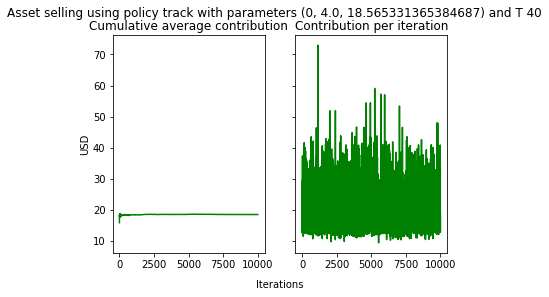

In [29]:
if (not policy_selected =='full_grid'):
        print("Selected policy {}, time horizon {}, initial price {} and number of iterations {}".format(policy_selected,T,initPrice,nIterations))
        contribution_iterations=[P.run_policy(param_list, policy_info, policy_selected, t) for ite in list(range(nIterations))]

        contribution_iterations = pd.Series(contribution_iterations)
        print("Contribution per iteration: ")
        print(contribution_iterations)
        cum_avg_contrib = contribution_iterations.expanding().mean()
        print("Cumulative average contribution per iteration: ")
        print(cum_avg_contrib)
        
        #plotting the results
       
        fig, axsubs = plt.subplots(1,2,sharex=True,sharey=True)
        fig.suptitle("Asset selling using policy {} with parameters {} and T {}".format(policy_selected,policy_info[policy_selected],T) )
        i = np.arange(0, nIterations, 1)
        
        axsubs[0].plot(i, cum_avg_contrib, 'g')
        axsubs[0].set_title('Cumulative average contribution')
          
        axsubs[1].plot(i, contribution_iterations, 'g')
        axsubs[1].set_title('Contribution per iteration')
        
    
        # Create a big subplot
        ax = fig.add_subplot(111, frameon=False)
        # hide tick and tick label of the big axes
        plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

        ax.set_ylabel('USD', labelpad=0) # Use argument `labelpad` to move label downwards.
        ax.set_xlabel('Iterations', labelpad=10)
        
        plt.show()
        
else:
        # obtain the theta values to carry out a full grid search
        grid_search_theta_values = P.grid_search_theta_values(sheet2['low_min'], sheet2['low_max'], sheet2['high_min'], sheet2['high_max'], sheet2['increment_size'])
        # use those theta values to calculate corresponding contribution values
        
        contribution_iterations = [P.vary_theta(param_list, policy_info, "high_low", t, grid_search_theta_values[0]) for ite in list(range(nIterations))]
        
        contribution_iterations_arr = np.array(contribution_iterations)
        cum_sum_contrib = contribution_iterations_arr.cumsum(axis=0)
        nElem = np.arange(1,cum_sum_contrib.shape[0]+1).reshape((cum_sum_contrib.shape[0],1))
        cum_avg_contrib=cum_sum_contrib/nElem
        print("cum_avg_contrib")
        print(cum_avg_contrib)
    
        # plot those contribution values on a heat map
        P.plot_heat_map_many(cum_avg_contrib, grid_search_theta_values[1], grid_search_theta_values[2], printIterations)

In [18]:
policy_info

{'sell_low': (2, nan), 'high_low': (4, 10.0), 'track': (0, 4.0, 16)}

In [43]:
sheet2['low_min'], sheet2['low_max'], sheet2['high_min'], sheet2['high_max'], sheet2['increment_size']

(0    0
 Name: low_min, dtype: int64,
 0    0
 Name: low_max, dtype: int64,
 0    0.01
 Name: high_min, dtype: float64,
 0    5
 Name: high_max, dtype: int64,
 0    0.005
 Name: increment_size, dtype: float64)

In [57]:
np.linspace(0.0,1.0,5)

array([0.  , 0.25, 0.5 , 0.75, 1.  ])

In [63]:
sheet2['low_min'][0]- sheet2['low_max'][0]

0

In [65]:
grid_search_theta_values = np.linspace(sheet2['low_min'][0], sheet2['low_max'][0], 10)
grid_search_theta_values

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [23]:
(sheet2['low_max'][0] - sheet2['low_min'][0]) / 0.05

0.0

In [31]:
num_step = int((sheet2['low_max'][0] - sheet2['low_min'][0]) / 0.005 + 1)
num_step

1

In [33]:
theta_low_values = np.linspace(sheet2['low_min'][0], sheet2['low_max'][0], num_step)
theta_low_values

array([0.])

In [69]:
theta_low_values = np.linspace(sheet2['low_min'][0], sheet2['low_max'][0], (sheet2['low_max'][0] - sheet2['low_min'][0]) / 0.005 + 1)

TypeError: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.

In [101]:
grid_search_theta_values = P.grid_search_theta_values(0.5, 1, 1, 10, 5)

TypeError: object of type <class 'float'> cannot be safely interpreted as an integer.

In [100]:
np.linspace(1, 10)

array([ 1.        ,  1.18367347,  1.36734694,  1.55102041,  1.73469388,
        1.91836735,  2.10204082,  2.28571429,  2.46938776,  2.65306122,
        2.83673469,  3.02040816,  3.20408163,  3.3877551 ,  3.57142857,
        3.75510204,  3.93877551,  4.12244898,  4.30612245,  4.48979592,
        4.67346939,  4.85714286,  5.04081633,  5.2244898 ,  5.40816327,
        5.59183673,  5.7755102 ,  5.95918367,  6.14285714,  6.32653061,
        6.51020408,  6.69387755,  6.87755102,  7.06122449,  7.24489796,
        7.42857143,  7.6122449 ,  7.79591837,  7.97959184,  8.16326531,
        8.34693878,  8.53061224,  8.71428571,  8.89795918,  9.08163265,
        9.26530612,  9.44897959,  9.63265306,  9.81632653, 10.        ])

In [46]:
theta_low_values = np.linspace(sheet2['low_min'], sheet2['low_max'], (sheet2['low_max'] - sheet2['low_min']) / 0.0005 + 1)

TypeError: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.

In [85]:
grid_search_theta_values = P.grid_search_theta_values(sheet2['low_min'][0], sheet2['low_max'][0], 
                                                      sheet2['high_min'][0], sheet2['high_max'][0], 0.05)

TypeError: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.

In [42]:
int((sheet2['high_max'][0] - sheet2['high_min'][0]) / sheet2['increment_size'][0] + 1)

999

In [157]:
def grid_search_theta_values(low_min, low_max, high_min, high_max, increment_size):
        """
        this function gives a list of theta values needed to run a full grid search

        :param low_min: the minimum value/lower bound of theta_low
        :param low_max: the maximum value/upper bound of theta_low
        :param high_min: the minimum value/lower bound of theta_high
        :param high_max: the maximum value/upper bound of theta_high
        :param increment_size: the increment size over the range of theta values
        :return: list - list of theta values
        """
        num_steps_low = int((low_max - low_min) / increment_size + 1)
        num_steps_high = int((high_max - high_min) / increment_size + 1)

        theta_low_values = np.linspace(low_min, low_max, num_steps_low, num_steps_low)
        theta_high_values = np.linspace(high_min, high_max,num_steps_high, num_steps_high)

        theta_values = []
        for x in theta_low_values:
            for y in theta_high_values:
                theta = (x, y)
                theta_values.append(theta)

        return theta_values, theta_low_values, theta_high_values

In [154]:
increment_size_l = sheet2['increment_size'][0]*100
increment_size_l

0.5

In [155]:
grid_search_theta_values= grid_search_theta_values(sheet2['low_min'][0], sheet2['low_max'][0], 
                                                      sheet2['high_min'][0], sheet2['high_max'][0], 
                                                      increment_size_l)

In [158]:
grid_search_theta_values_man = grid_search_theta_values(12, 16, 
                                                      16, 20, 
                                                      increment_size_l)

In [159]:
len(grid_search_theta_values_man[0])

81

In [161]:
grid_search_theta_values_man[0]

[(12.0, 16.0),
 (12.0, 16.5),
 (12.0, 17.0),
 (12.0, 17.5),
 (12.0, 18.0),
 (12.0, 18.5),
 (12.0, 19.0),
 (12.0, 19.5),
 (12.0, 20.0),
 (12.5, 16.0),
 (12.5, 16.5),
 (12.5, 17.0),
 (12.5, 17.5),
 (12.5, 18.0),
 (12.5, 18.5),
 (12.5, 19.0),
 (12.5, 19.5),
 (12.5, 20.0),
 (13.0, 16.0),
 (13.0, 16.5),
 (13.0, 17.0),
 (13.0, 17.5),
 (13.0, 18.0),
 (13.0, 18.5),
 (13.0, 19.0),
 (13.0, 19.5),
 (13.0, 20.0),
 (13.5, 16.0),
 (13.5, 16.5),
 (13.5, 17.0),
 (13.5, 17.5),
 (13.5, 18.0),
 (13.5, 18.5),
 (13.5, 19.0),
 (13.5, 19.5),
 (13.5, 20.0),
 (14.0, 16.0),
 (14.0, 16.5),
 (14.0, 17.0),
 (14.0, 17.5),
 (14.0, 18.0),
 (14.0, 18.5),
 (14.0, 19.0),
 (14.0, 19.5),
 (14.0, 20.0),
 (14.5, 16.0),
 (14.5, 16.5),
 (14.5, 17.0),
 (14.5, 17.5),
 (14.5, 18.0),
 (14.5, 18.5),
 (14.5, 19.0),
 (14.5, 19.5),
 (14.5, 20.0),
 (15.0, 16.0),
 (15.0, 16.5),
 (15.0, 17.0),
 (15.0, 17.5),
 (15.0, 18.0),
 (15.0, 18.5),
 (15.0, 19.0),
 (15.0, 19.5),
 (15.0, 20.0),
 (15.5, 16.0),
 (15.5, 16.5),
 (15.5, 17.0),
 (15.5, 17

In [143]:
nIterations=100
nIterations

100

In [162]:
contribution_iterations = [P.vary_theta(param_list, policy_info, "high_low", t, grid_search_theta_values_man[0]) for ite in list(range(nIterations))]


policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.30294536296960073  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.457013146174706, x=Decision(sell=1, hold=0)
coin  0.687252463120658  curr_bias  Up  new_bias  Up
obj=16.457013146174706, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9881892845231818  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.886200726483157, x=Decision(sell=0, hold=1)
coin  0.245145676511622  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.819884665277646, x=Decision(sell=0, hold=1)
coin  0.223077799844967  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=12.430873796129164, x=Decision(sell=0, hold=1)
coin  0.590385

coin  0.29918969474505985  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=20.680487755240065, x=Decision(sell=1, hold=0)
coin  0.0014564669013172882  curr_bias  Up  new_bias  Up
obj=20.680487755240065, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9469281803215301  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=19.30110062171695, x=Decision(sell=1, hold=0)
coin  0.7001115426868538  curr_bias  Neutral  new_bias  Neutral
obj=19.30110062171695, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4355013496844321  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.405139381320353, x=Decision(sell=0, hold=1)
coin  0.6739738592198532  curr_bias  Up  new_bias  Up
time=2, obj

coin  0.9239691753313132  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.725462034391427, x=Decision(sell=0, hold=1)
coin  0.6092512048897205  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.294430539583628, x=Decision(sell=0, hold=1)
coin  0.21205258123838744  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=13.206652233940167, x=Decision(sell=0, hold=1)
coin  0.15931609007472836  curr_bias  Neutral  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.37362604950815, x=Decision(sell=0, hold=1)
coin  0.8769399153287268  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.15775932825653, x=Decision(sell=1, hold=0)
coin  0.4833494279680749  curr_bias  Up  new_bias  Up
obj=21.15775932825653, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.51661643540954

coin  0.7243434170760849  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.423504265485818, x=Decision(sell=0, hold=1)
coin  0.5110093465971925  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.096724934872357, x=Decision(sell=0, hold=1)
coin  0.05675637064709249  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.71206215560307, x=Decision(sell=0, hold=1)
coin  0.16460152692806596  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.15372410923792, x=Decision(sell=0, hold=1)
coin  0.4336704052701661  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=18.026063806028304, x=Decision(sell=0, hold=1)
coin  0.35023328999149606  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=17.630488038059074, x=Decision(sell=0, hold=1)
coin  0.5480167777275563  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=15.211162162390524, x=Decision(sell=0, hold=1)
coin  0.36407751442

coin  0.22918167485348162  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.480260498084476, x=Decision(sell=0, hold=1)
coin  0.8697842786399935  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.622900705250824, x=Decision(sell=0, hold=1)
coin  0.10794853011016636  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.56380514704023, x=Decision(sell=1, hold=0)
coin  0.6948930875901707  curr_bias  Up  new_bias  Up
obj=20.56380514704023, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.939967532992579  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.818536002688624, x=Decision(sell=0, hold=1)
coin  0.058915343186257574  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.496044379124864, x=Decision(sell=0, hold=1)
coin  0.9109221700889212  curr_bias  Up 

coin  0.2526087206216874  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.652581949492294, x=Decision(sell=1, hold=0)
coin  0.43119591214470154  curr_bias  Up  new_bias  Up
obj=19.652581949492294, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4828071159861633  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.747431428081674, x=Decision(sell=0, hold=1)
coin  0.34916616591545524  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.851375777932567, x=Decision(sell=1, hold=0)
coin  0.21766076982753324  curr_bias  Up  new_bias  Up
obj=18.851375777932567, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.43233357005029394  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resou

obj=21.250077519454706, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7086488910513912  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.945067383350185, x=Decision(sell=1, hold=0)
coin  0.6672164401135589  curr_bias  Up  new_bias  Up
obj=16.945067383350185, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.43176095893423205  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.62691143410598, x=Decision(sell=1, hold=0)
coin  0.7111687393379129  curr_bias  Up  new_bias  Up
obj=17.62691143410598, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.33676869239245677  c

coin  0.8831657956779202  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.998985055991827, x=Decision(sell=1, hold=0)
coin  0.05611779870189171  curr_bias  Up  new_bias  Up
obj=17.998985055991827, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.669244129999355  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.23597746262702, x=Decision(sell=1, hold=0)
coin  0.6553365523756421  curr_bias  Up  new_bias  Up
obj=17.23597746262702, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.42106075192805037  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.382085807005273, x=Decision(sell=0, hold=1)
coin  0.03994183984096589  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=

coin  0.3111566992105116  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.49337002635762, x=Decision(sell=1, hold=0)
coin  0.3357141649210392  curr_bias  Up  new_bias  Up
obj=22.49337002635762, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.0999001333536158  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.723406644419775, x=Decision(sell=1, hold=0)
coin  0.629686337703582  curr_bias  Up  new_bias  Up
obj=12.723406644419775, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8547859916370997  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.865100157481297, x=Decision(sell=1, hold=0)
coin  0.05061531740519498  curr_bias  Up  new_bias  Up
obj=17.865100157481297, state.

coin  0.2242580317617876  curr_bias  Up  new_bias  Up
obj=23.39664302928032, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.673801290880123  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.817544304559407, x=Decision(sell=0, hold=1)
coin  0.27944366550758637  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.04645302147408, x=Decision(sell=0, hold=1)
coin  0.8150379011428716  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.94459441303948, x=Decision(sell=1, hold=0)
coin  0.32871120412006005  curr_bias  Up  new_bias  Up
obj=20.94459441303948, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1311386753366781  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, 

time=1, obj=0.0, s.resource=1, s.price=19.215203168948978, x=Decision(sell=0, hold=1)
coin  0.5784439538261087  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.968000564000267, x=Decision(sell=1, hold=0)
coin  0.6278425002507415  curr_bias  Up  new_bias  Up
obj=19.968000564000267, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5345127106684214  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.22316083839464, x=Decision(sell=0, hold=1)
coin  0.8638225180475898  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=11.375441218883847, x=Decision(sell=1, hold=0)
coin  0.5232820636817503  curr_bias  Up  new_bias  Up
obj=11.375441218883847, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=

coin  0.025428020700841047  curr_bias  Neutral  new_bias  Up
obj=14.382828747067428, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1253631996671678  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.935734079798948, x=Decision(sell=0, hold=1)
coin  0.8454602737051556  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.322398483584237, x=Decision(sell=0, hold=1)
coin  0.12099147924741327  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.10389844552317, x=Decision(sell=1, hold=0)
coin  0.045064081089814634  curr_bias  Up  new_bias  Up
obj=22.10389844552317, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2951676683815888  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.r

coin  0.5858619508001359  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.450992660333867, x=Decision(sell=0, hold=1)
coin  0.831794445163986  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=18.106372665200706, x=Decision(sell=0, hold=1)
coin  0.4094398406426679  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=19.738702059641014, x=Decision(sell=1, hold=0)
coin  0.6869704250025553  curr_bias  Up  new_bias  Up
obj=19.738702059641014, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9284172147406367  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=19.638527747801692, x=Decision(sell=1, hold=0)
coin  0.6770747076310134  curr_bias  Neutral  new_bias  Neutral
obj=19.638527747801692, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 20.0), 'track': (0, 4.0, 16)

coin  0.07378400560540976  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.906987870929822, x=Decision(sell=0, hold=1)
coin  0.23755940783717766  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.885976964194658, x=Decision(sell=1, hold=0)
coin  0.05968841135964431  curr_bias  Up  new_bias  Up
obj=21.885976964194658, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9435248124519656  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.11315604767346, x=Decision(sell=1, hold=0)
coin  0.25384317761472186  curr_bias  Neutral  new_bias  Neutral
obj=17.11315604767346, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3620123326801995  curr_bias  Up  new_bias  Up
time=1, obj

coin  0.8924011354621931  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=15.078720697370498, x=Decision(sell=0, hold=1)
coin  0.16175711538031967  curr_bias  Neutral  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=14.876277343049498, x=Decision(sell=0, hold=1)
coin  0.6342873109151133  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=17.427370666742224, x=Decision(sell=0, hold=1)
coin  0.027361363957314144  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=17.895481770858105, x=Decision(sell=0, hold=1)
coin  0.2989916555982801  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=20.820847236309483, x=Decision(sell=1, hold=0)
coin  0.4102120167675375  curr_bias  Up  new_bias  Up
obj=20.820847236309483, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4950268208555533  curr_bi

coin  0.1270048232039599  curr_bias  Neutral  new_bias  Up
obj=18.01966383797141, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4633804508642846  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.670622455747374, x=Decision(sell=0, hold=1)
coin  0.5523011323905892  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.88978012237681, x=Decision(sell=0, hold=1)
coin  0.6678646758119463  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.7172124195067, x=Decision(sell=1, hold=0)
coin  0.9251831806704487  curr_bias  Up  new_bias  Neutral
obj=18.7172124195067, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.42671912630459385  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.reso

coin  0.5806645382600244  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=11.558865218909744, x=Decision(sell=1, hold=0)
coin  0.9345011875962304  curr_bias  Up  new_bias  Neutral
obj=11.558865218909744, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7803267216385679  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.707635426206235, x=Decision(sell=0, hold=1)
coin  0.5275265258127039  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.26829819100943, x=Decision(sell=0, hold=1)
coin  0.06723656240565556  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.068998901954185, x=Decision(sell=1, hold=0)
coin  0.2548963952058786  curr_bias  Up  new_bias  Up
obj=19.068998901954185, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 19.0), 'track': (0, 4.0, 16)}
time=0,

coin  0.9749533292798581  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.662007983906284, x=Decision(sell=1, hold=0)
coin  0.9499955616554635  curr_bias  Neutral  new_bias  Neutral
obj=14.662007983906284, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.44169372134131  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.47564314863727, x=Decision(sell=0, hold=1)
coin  0.18656198247611355  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.576015469580213, x=Decision(sell=1, hold=0)
coin  0.6667308135834475  curr_bias  Up  new_bias  Up
obj=18.576015469580213, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.10792845863785439  curr_bias  Up  new_bias  Up
time=1, obj=0.

coin  0.20760596379598883  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=19.74709566758989, x=Decision(sell=1, hold=0)
coin  0.7828356504000795  curr_bias  Neutral  new_bias  Neutral
obj=19.74709566758989, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8866427268523942  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.857727922528415, x=Decision(sell=1, hold=0)
coin  0.20932743350766359  curr_bias  Up  new_bias  Up
obj=19.857727922528415, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6128769095682657  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.46284548854465, x=Decision(sell=0, hold=1)
coin  0.3427338359209485  curr_bias  Up  new_bias  Up
time=2, o

coin  0.315615521088747  curr_bias  Up  new_bias  Up
obj=19.179372612298447, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.17996013138032418  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.09742231978634, x=Decision(sell=0, hold=1)
coin  0.9599929188991512  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=20.19244977411141, x=Decision(sell=1, hold=0)
coin  0.8092235223613802  curr_bias  Neutral  new_bias  Neutral
obj=20.19244977411141, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7802754692538594  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.034409233194232, x=Decision(sell=0, hold=1)
coin  0.3276019998753509  curr_bias  Up  new_bias  Up
time=2, obj=0.0,

coin  0.3856744281719665  curr_bias  Up  new_bias  Up
obj=18.30677767409318, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8614833176428255  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.00775050210394, x=Decision(sell=1, hold=0)
coin  0.6243583371934068  curr_bias  Up  new_bias  Up
obj=20.00775050210394, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6375355899716041  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.02098787051474, x=Decision(sell=0, hold=1)
coin  0.48253853197119023  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.07863819961579, x=Decision(sell=1, hold=0)
coin  0.5843785848609685  curr_bias  Up  new_bias  Up
obj=20.07863819961579, state.res

coin  0.7494295886318599  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.897618725610831, x=Decision(sell=0, hold=1)
coin  0.7949982243137769  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.25410563255241, x=Decision(sell=0, hold=1)
coin  0.4835875979236245  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.130203881919837, x=Decision(sell=0, hold=1)
coin  0.04355200219962052  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.514765024078978, x=Decision(sell=0, hold=1)
coin  0.22339194229605597  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=20.972193173450705, x=Decision(sell=1, hold=0)
coin  0.5177589499084794  curr_bias  Up  new_bias  Up
obj=20.972193173450705, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5465422527617367  curr_bias  Up  new_bias 

coin  0.43454227807208934  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.37001736910331, x=Decision(sell=0, hold=1)
coin  0.4168843494606669  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.21182917588508, x=Decision(sell=1, hold=0)
coin  0.29791299386476355  curr_bias  Up  new_bias  Up
obj=21.21182917588508, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.71321021502364  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.440442373712965, x=Decision(sell=0, hold=1)
coin  0.5024688493506251  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.557102547423284, x=Decision(sell=0, hold=1)
coin  0.4327503847305568  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.49513679728659, x=Decision(sell=0, hold=1)
coin  0.2055530201378737  curr_bias  Up  new_bias  Up
t

coin  0.8884904907166153  curr_bias  Up  new_bias  Up
obj=10.348707483881533, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.26518998937120275  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.579174040790281, x=Decision(sell=0, hold=1)
coin  0.23806960903201524  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.01635919169971, x=Decision(sell=1, hold=0)
coin  0.23924197940518643  curr_bias  Up  new_bias  Up
obj=17.01635919169971, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7517423862118588  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.631262694678846, x=Decision(sell=1, hold=0)
coin  0.14462650384636355  curr_bias  Up  new_bias  Up
obj=18.631262694678846, st

coin  0.5966164168494545  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.606331786424908, x=Decision(sell=1, hold=0)
coin  0.11013823330787409  curr_bias  Up  new_bias  Up
obj=13.606331786424908, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8773552769702219  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.874071030463515, x=Decision(sell=0, hold=1)
coin  0.28893924935177484  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.961955614943996, x=Decision(sell=0, hold=1)
coin  0.8181414740096352  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.367196110714154, x=Decision(sell=1, hold=0)
coin  0.8151354736179104  curr_bias  Up  new_bias  Up
obj=19.367196110714154, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.0), 'track': (0, 4.0, 16)}
time=0, ob

coin  0.0860803404789322  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.045373366302144, x=Decision(sell=1, hold=0)
coin  0.46920334548424214  curr_bias  Up  new_bias  Up
obj=20.045373366302144, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7708285253110442  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.369072257903046, x=Decision(sell=0, hold=1)
coin  0.965271894578866  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=22.315714860750028, x=Decision(sell=1, hold=0)
coin  0.26855167969157134  curr_bias  Neutral  new_bias  Neutral
obj=22.315714860750028, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3191785626335273  curr_bias  Up  new_bias  Up
time=1, obj=

coin  0.8480998285591387  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=15.074450198401562, x=Decision(sell=0, hold=1)
coin  0.6531731825097399  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=16.2229744413517, x=Decision(sell=0, hold=1)
coin  0.1347173400527374  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=16.227931731232815, x=Decision(sell=0, hold=1)
coin  0.5797223564760684  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=16.651490097538602, x=Decision(sell=0, hold=1)
coin  0.8932046495524809  curr_bias  Up  new_bias  Up
time=11, obj=0.0, s.resource=1, s.price=19.227207212906936, x=Decision(sell=0, hold=1)
coin  0.7225789637893765  curr_bias  Up  new_bias  Up
time=12, obj=0.0, s.resource=1, s.price=19.55745274914013, x=Decision(sell=0, hold=1)
coin  0.3652087649620659  curr_bias  Up  new_bias  Up
time=13, obj=0.0, s.resource=1, s.price=16.987326720886664, x=Decision(sell=0, hold=1)
coin  0.36956139744

coin  0.02306808646300995  curr_bias  Up  new_bias  Up
obj=17.70359104734001, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8925663159833013  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.47198055504767, x=Decision(sell=1, hold=0)
coin  0.48567754245627026  curr_bias  Up  new_bias  Up
obj=17.47198055504767, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7240140667193549  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.243998875563804, x=Decision(sell=1, hold=0)
coin  0.7319717616831497  curr_bias  Up  new_bias  Up
obj=19.243998875563804, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x

coin  0.38251278144100564  curr_bias  Up  new_bias  Up
obj=20.250681635279904, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8297559677153851  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.36032357194735, x=Decision(sell=1, hold=0)
coin  0.5997625438646514  curr_bias  Up  new_bias  Up
obj=18.36032357194735, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.09463011885057837  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.398571809420133, x=Decision(sell=0, hold=1)
coin  0.8295906555678098  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.57667375473725, x=Decision(sell=0, hold=1)
coin  0.3379007025787947  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1

coin  0.42365216358653823  curr_bias  Neutral  new_bias  Neutral
obj=17.90788302379066, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6881038978114589  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.8723425754564, x=Decision(sell=0, hold=1)
coin  0.31532793768166656  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.213370453282696, x=Decision(sell=1, hold=0)
coin  0.8282884746414592  curr_bias  Up  new_bias  Up
obj=18.213370453282696, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.40828134087382184  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.289367944716485, x=Decision(sell=0, hold=1)
coin  0.4689820198993282  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s

coin  0.9392174663306105  curr_bias  Up  new_bias  Neutral
obj=11.783752923112342, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1701410456780421  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.518220295955636, x=Decision(sell=1, hold=0)
coin  0.19002049233009322  curr_bias  Up  new_bias  Up
obj=16.518220295955636, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5939527699549122  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.68700431486068, x=Decision(sell=1, hold=0)
coin  0.9496954033849861  curr_bias  Up  new_bias  Neutral
obj=18.68700431486068, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.p

coin  0.9584770845583587  curr_bias  Up  new_bias  Neutral
obj=19.780877230891353, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.21919701078480958  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.206735796664354, x=Decision(sell=0, hold=1)
coin  0.48378507692089123  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.467993127695, x=Decision(sell=0, hold=1)
coin  0.15883722562808122  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.216691729037354, x=Decision(sell=0, hold=1)
coin  0.36240728594611904  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.769891034762203, x=Decision(sell=1, hold=0)
coin  0.12081216659164351  curr_bias  Up  new_bias  Up
obj=19.769891034762203, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 20.0), 'track': (0, 4.0, 16)}
time=

coin  0.7827845521026958  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.39265076921088, x=Decision(sell=0, hold=1)
coin  0.5363117215994739  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.91995152644454, x=Decision(sell=0, hold=1)
coin  0.24636978719662372  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=21.297457846153236, x=Decision(sell=1, hold=0)
coin  0.8267885507239909  curr_bias  Up  new_bias  Up
obj=21.297457846153236, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.98109023640605  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.952027077203281, x=Decision(sell=0, hold=1)
coin  0.1325391812279595  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.46130737637142, x=Decision(sell=0, hold=1)
coin  0.2819738697500366  curr_bias  Up  new_

coin  0.30845413057169957  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.837610389059005, x=Decision(sell=0, hold=1)
coin  0.8031740273630976  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.32477398921243, x=Decision(sell=1, hold=0)
coin  0.7237260504078988  curr_bias  Up  new_bias  Up
obj=19.32477398921243, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8638583564295534  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.75836352186911, x=Decision(sell=1, hold=0)
coin  0.8613970453001351  curr_bias  Up  new_bias  Up
obj=18.75836352186911, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.06784911684804018  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1,

coin  0.342758359447337  curr_bias  Neutral  new_bias  Neutral
obj=19.4685707691465, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.01578219544473569  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.339897724271278, x=Decision(sell=0, hold=1)
coin  0.9103432211626643  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=18.911478215671796, x=Decision(sell=0, hold=1)
coin  0.42234853023644325  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=17.450655744908385, x=Decision(sell=0, hold=1)
coin  0.04756585108536304  curr_bias  Neutral  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.2010376978881, x=Decision(sell=0, hold=1)
coin  0.9443228334486012  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=21.789698171160595, x=Decision(sell=1, hold=0)
coin  0.7914962693

coin  0.05349854298611845  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.602900784734864, x=Decision(sell=1, hold=0)
coin  0.7938347295288739  curr_bias  Up  new_bias  Up
obj=18.602900784734864, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6933514180353554  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.631753179407077, x=Decision(sell=1, hold=0)
coin  0.8516241974661145  curr_bias  Up  new_bias  Up
obj=16.631753179407077, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6970865513133074  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.008071501002547, x=Decision(sell=1, hold=0)
coin  0.6496514440229676  curr_bias  Up  new_bias  Up
obj=19.008071501002547, sta

coin  0.37739383631605594  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.770368493065543, x=Decision(sell=1, hold=0)
coin  0.8061760093349858  curr_bias  Up  new_bias  Up
obj=19.770368493065543, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.26579154207298905  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=22.999336356289472, x=Decision(sell=1, hold=0)
coin  0.6082032386688654  curr_bias  Up  new_bias  Up
obj=22.999336356289472, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.359648021397437  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.0810324910276, x=Decision(sell=1, hold=0)
coin  0.5461658685292815  curr_bias  Up  new_bias  Up
obj=18.0810324910276, state.r

time=2, obj=0.0, s.resource=1, s.price=16.555504991415987, x=Decision(sell=0, hold=1)
coin  0.8801623574494329  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.52704286615899, x=Decision(sell=0, hold=1)
coin  0.6429571573755626  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.631728550315762, x=Decision(sell=0, hold=1)
coin  0.8982942854207832  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=19.521038833578125, x=Decision(sell=1, hold=0)
coin  0.6171686278607696  curr_bias  Up  new_bias  Up
obj=19.521038833578125, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5595672102348809  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.69970662182673, x=Decision(sell=0, hold=1)
coin  0.40544764219456286  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.7214497329

coin  0.5470751880940657  curr_bias  Up  new_bias  Up
obj=17.487504829747607, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6841923044650627  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.112950940192775, x=Decision(sell=0, hold=1)
coin  0.6488495451193868  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.799691256634889, x=Decision(sell=0, hold=1)
coin  0.24472559734114685  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.271248419848806, x=Decision(sell=1, hold=0)
coin  0.11745079363154842  curr_bias  Up  new_bias  Up
obj=18.271248419848806, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9616182017125132  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.re

coin  0.9329984155422316  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.791322864028784, x=Decision(sell=0, hold=1)
coin  0.24506075332021693  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.142473578097665, x=Decision(sell=1, hold=0)
coin  0.5633037329274527  curr_bias  Neutral  new_bias  Neutral
obj=13.142473578097665, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.14728790687063842  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.670124858947233, x=Decision(sell=0, hold=1)
coin  0.3731354669738446  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.94087136684442, x=Decision(sell=0, hold=1)
coin  0.9710654193302315  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=16.748417490821282, x=Decision(sell=0, hold=1)
coin  0.738797089603

coin  0.20615591465939231  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.47957692436936, x=Decision(sell=0, hold=1)
coin  0.6841872179159199  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.42680677097492, x=Decision(sell=0, hold=1)
coin  0.06509504118815446  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.177425904314052, x=Decision(sell=0, hold=1)
coin  0.0951653664339267  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.76060117845589, x=Decision(sell=0, hold=1)
coin  0.768434013680637  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=17.670044773460567, x=Decision(sell=0, hold=1)
coin  0.2709995605188704  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=16.686847798863756, x=Decision(sell=0, hold=1)
coin  0.37472990989833854  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=17.769913784807898, x=Decision(sell=0, hold=1)
coin  0.9896395526087

coin  0.6468089484856886  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.11899172062923, x=Decision(sell=1, hold=0)
coin  0.2576434952764871  curr_bias  Up  new_bias  Up
obj=19.11899172062923, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.51875771563959  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=21.92952548427217, x=Decision(sell=1, hold=0)
coin  0.487349358824016  curr_bias  Up  new_bias  Up
obj=21.92952548427217, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.29097647658049974  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.74945483900502, x=Decision(sell=0, hold=1)
coin  0.0972538386427323  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.pr

coin  0.3619762751157021  curr_bias  Up  new_bias  Up
obj=20.297435926378732, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.49999029772461034  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.836880838313185, x=Decision(sell=0, hold=1)
coin  0.18639274418275364  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.311724294779246, x=Decision(sell=0, hold=1)
coin  0.7737246388297111  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=14.954748784047835, x=Decision(sell=0, hold=1)
coin  0.4220743350057532  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=13.686352147676761, x=Decision(sell=1, hold=0)
coin  0.26568967827571643  curr_bias  Up  new_bias  Up
obj=13.686352147676761, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.0), 'track': (0, 4.0, 16)}
time=0, o

coin  0.8165269389612175  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.76537790933582, x=Decision(sell=1, hold=0)
coin  0.04602832651390154  curr_bias  Up  new_bias  Up
obj=22.76537790933582, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3675561985953164  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.94563365076276, x=Decision(sell=1, hold=0)
coin  0.5741462299386291  curr_bias  Up  new_bias  Up
obj=18.94563365076276, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6716379690448745  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.036481986770562, x=Decision(sell=0, hold=1)
coin  0.48461523829974407  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1,

coin  0.0011029340579901126  curr_bias  Neutral  new_bias  Up
obj=14.859344183827368, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4219203938743177  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.206676583471747, x=Decision(sell=0, hold=1)
coin  0.17438744386349747  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.315070768779751, x=Decision(sell=0, hold=1)
coin  0.20651599979565294  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.130406253726065, x=Decision(sell=0, hold=1)
coin  0.0550540085394543  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.864483003533326, x=Decision(sell=0, hold=1)
coin  0.8990389717265624  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=16.08571744153879, x=Decision(sell=0, hold=1)
coin  0.9950546481192513  curr_bias  Up  n

coin  0.04393353441888748  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.974451057508503, x=Decision(sell=0, hold=1)
coin  0.35194230275233473  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=17.378983595397333, x=Decision(sell=0, hold=1)
coin  0.43929044883926127  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=21.112591096526927, x=Decision(sell=1, hold=0)
coin  0.6489456669043608  curr_bias  Up  new_bias  Up
obj=21.112591096526927, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.43409103318246434  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.82221086728752, x=Decision(sell=1, hold=0)
coin  0.47587532599275884  curr_bias  Up  new_bias  Up
obj=13.82221086728752, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.5), 'track': (0, 4.0, 16)}
time=0, o

coin  0.8612731219248796  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.80769887046087, x=Decision(sell=1, hold=0)
coin  0.5380108288335747  curr_bias  Up  new_bias  Up
obj=19.80769887046087, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6440149358470718  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.922867400331711, x=Decision(sell=1, hold=0)
coin  0.23973047549872517  curr_bias  Up  new_bias  Up
obj=13.922867400331711, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7059793467407803  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.345150741215406, x=Decision(sell=0, hold=1)
coin  0.1379960677926918  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1

coin  0.5217401785430158  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.847033613817295, x=Decision(sell=0, hold=1)
coin  0.6604290974917194  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.98616886900203, x=Decision(sell=1, hold=0)
coin  0.4588383624426603  curr_bias  Up  new_bias  Up
obj=20.98616886900203, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4890066234739501  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.060979549858944, x=Decision(sell=0, hold=1)
coin  0.7101521102701401  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.217301159291493, x=Decision(sell=1, hold=0)
coin  0.5437068459364818  curr_bias  Up  new_bias  Up
obj=14.217301159291493, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.

coin  0.15883719335474122  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.261763480429572, x=Decision(sell=1, hold=0)
coin  0.9034580211029154  curr_bias  Up  new_bias  Neutral
obj=18.261763480429572, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.10111001836440103  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.245138600890602, x=Decision(sell=0, hold=1)
coin  0.9219140771287501  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.4090054227157, x=Decision(sell=0, hold=1)
coin  0.6539513776388417  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=16.774597882813037, x=Decision(sell=0, hold=1)
coin  0.17070581316701372  curr_bias  Neutral  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=19.527776667179037, x=Decision(sell=1, hold=0)
coin  0.8598542916510136 

coin  0.6512068338871138  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=13.558262588760043, x=Decision(sell=0, hold=1)
coin  0.3193129971082196  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=15.411214168145333, x=Decision(sell=0, hold=1)
coin  0.451429299215644  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=15.254012989269556, x=Decision(sell=0, hold=1)
coin  0.24142471680810307  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=19.216778626456538, x=Decision(sell=0, hold=1)
coin  0.19254025892440707  curr_bias  Up  new_bias  Up
time=11, obj=0.0, s.resource=1, s.price=17.704659516021543, x=Decision(sell=0, hold=1)
coin  0.7611274713796801  curr_bias  Up  new_bias  Up
time=12, obj=0.0, s.resource=1, s.price=15.984339401380383, x=Decision(sell=0, hold=1)
coin  0.7024768016298182  curr_bias  Up  new_bias  Up
time=13, obj=0.0, s.resource=1, s.price=15.149463361557013, x=Decision(sell=0, hold=1)
coin  0.3935299

coin  0.3215060098462461  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.490062295419293, x=Decision(sell=0, hold=1)
coin  0.8385139465188612  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.063122395938354, x=Decision(sell=1, hold=0)
coin  0.9949497022539652  curr_bias  Up  new_bias  Neutral
obj=21.063122395938354, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9926897404992445  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.925298632872295, x=Decision(sell=0, hold=1)
coin  0.027835702443953503  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=22.96044209602027, x=Decision(sell=1, hold=0)
coin  0.05721764717147859  curr_bias  Up  new_bias  Up
obj=22.96044209602027, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 19.0), 'track': (0, 4.0, 1

coin  0.47617045977295114  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=21.028250546901837, x=Decision(sell=1, hold=0)
coin  0.4664926102535213  curr_bias  Up  new_bias  Up
obj=21.028250546901837, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6460809623538666  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.536559532883967, x=Decision(sell=1, hold=0)
coin  0.021939390801547942  curr_bias  Up  new_bias  Up
obj=14.536559532883967, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5962651338407288  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.428529622225945, x=Decision(sell=1, hold=0)
coin  0.8000349940691073  curr_bias  Up  new_bias  Up
obj=15.428529622225945, s

coin  0.610261992571351  curr_bias  Up  new_bias  Up
obj=15.405873615641916, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.053518788642475834  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.092659892945033, x=Decision(sell=1, hold=0)
coin  0.9239538581379888  curr_bias  Up  new_bias  Neutral
obj=17.092659892945033, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9458968150385901  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.57806579345798, x=Decision(sell=1, hold=0)
coin  0.9777218746173935  curr_bias  Neutral  new_bias  Neutral
obj=17.57806579345798, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resou

coin  0.754705865492621  curr_bias  Up  new_bias  Up
obj=18.514758587004152, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9712734974132897  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.627567510316876, x=Decision(sell=1, hold=0)
coin  0.6880573447824857  curr_bias  Neutral  new_bias  Neutral
obj=15.627567510316876, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.16828249848091248  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.360828396543702, x=Decision(sell=0, hold=1)
coin  0.006101889302130958  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.070216487150546, x=Decision(sell=1, hold=0)
coin  0.7967720421469814  curr_bias  Up  new_bias  Up
obj=17.0702

coin  0.273039551389448  curr_bias  Up  new_bias  Up
obj=19.474867441997485, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9678819864319862  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.257592758466345, x=Decision(sell=1, hold=0)
coin  0.12553959125563552  curr_bias  Neutral  new_bias  Up
obj=17.257592758466345, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2678741786462061  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.44746904908974, x=Decision(sell=1, hold=0)
coin  0.8880923579786757  curr_bias  Up  new_bias  Up
obj=19.44746904908974, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.pr

coin  0.5679761547189511  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=11.466809927317438, x=Decision(sell=1, hold=0)
coin  0.1471833231813714  curr_bias  Up  new_bias  Up
obj=11.466809927317438, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8573531764201755  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.296459838906575, x=Decision(sell=0, hold=1)
coin  0.03357044526961528  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.993454674263933, x=Decision(sell=0, hold=1)
coin  0.6771839318123041  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=21.838880489949993, x=Decision(sell=1, hold=0)
coin  0.7883604414104856  curr_bias  Up  new_bias  Up
obj=21.838880489949993, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj

coin  0.18638982732442155  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.318172123135707, x=Decision(sell=0, hold=1)
coin  0.049259590782764096  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.34620684124192, x=Decision(sell=1, hold=0)
coin  0.42703339668128104  curr_bias  Up  new_bias  Up
obj=17.34620684124192, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.45433493106369793  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.70252510598894, x=Decision(sell=1, hold=0)
coin  0.5963383460135134  curr_bias  Up  new_bias  Up
obj=18.70252510598894, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5539373535406796  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.1184027256371103  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.491354143289662, x=Decision(sell=0, hold=1)
coin  0.6167254374731346  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.770160162468684, x=Decision(sell=0, hold=1)
coin  0.7107469206446168  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=13.74956025751042, x=Decision(sell=0, hold=1)
coin  0.6079508654229997  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.053487543579738, x=Decision(sell=0, hold=1)
coin  0.4866190165615657  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=13.7636003312514, x=Decision(sell=0, hold=1)
coin  0.6387607644341934  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=16.866556946618402, x=Decision(sell=0, hold=1)
coin  0.045030118525933194  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=16.759489289481554, x=Decision(sell=0, hold=1)
coin  0.1838689859057

time=1, obj=0.0, s.resource=1, s.price=14.41757460684312, x=Decision(sell=1, hold=0)
coin  0.6146097073199491  curr_bias  Up  new_bias  Up
obj=14.41757460684312, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.08508473248015891  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=21.019298112379943, x=Decision(sell=1, hold=0)
coin  0.2543490247907957  curr_bias  Up  new_bias  Up
obj=21.019298112379943, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7545658494995605  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.98045221860455, x=Decision(sell=1, hold=0)
coin  0.6431810653604407  curr_bias  Up  new_bias  Up
obj=17.98045221860455, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low

coin  0.7796890345957173  curr_bias  Neutral  new_bias  Neutral
obj=21.346736976975684, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.42470426473008493  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.084626154824193, x=Decision(sell=0, hold=1)
coin  0.8516679943428018  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.66018419222387, x=Decision(sell=1, hold=0)
coin  0.16566228620521428  curr_bias  Up  new_bias  Up
obj=19.66018419222387, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6695793457360354  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.615728537575393, x=Decision(sell=1, hold=0)
coin  0.5965711119486102  curr_bias  Up  new_bias  Up
obj=12.61572853757

coin  0.57837410611997  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.374680496711054, x=Decision(sell=1, hold=0)
coin  0.12945648037663837  curr_bias  Up  new_bias  Up
obj=17.374680496711054, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8942404568351159  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.810266293835404, x=Decision(sell=1, hold=0)
coin  0.3853796397048459  curr_bias  Up  new_bias  Up
obj=20.810266293835404, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3801724556091619  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.71426260933038, x=Decision(sell=1, hold=0)
coin  0.14749009687784054  curr_bias  Up  new_bias  Up
obj=18.71426260933038, state.

coin  0.5030642015786954  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.403768939259349, x=Decision(sell=0, hold=1)
coin  0.41651108372208623  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.08916509068074, x=Decision(sell=1, hold=0)
coin  0.24234221782373888  curr_bias  Up  new_bias  Up
obj=20.08916509068074, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2566315028669852  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.039327660876502, x=Decision(sell=0, hold=1)
coin  0.9540384262147197  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.085467751180257, x=Decision(sell=0, hold=1)
coin  0.8159561653083545  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.256333587825708, x=Decision(sell=0, hold=1)
coin  0.6450625663640448  curr_bias 

coin  0.13292506506159352  curr_bias  Up  new_bias  Up
obj=17.37647209667032, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4122133649142927  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.14177341638765, x=Decision(sell=1, hold=0)
coin  0.6678402219226409  curr_bias  Up  new_bias  Up
obj=18.14177341638765, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.010990482739640317  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.523769587945083, x=Decision(sell=0, hold=1)
coin  0.4196682536343217  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.096458807413725, x=Decision(sell=1, hold=0)
coin  0.6660451732917683  curr_bias  Up  new_bias  Up
obj=19.096458807413725, stat

coin  0.7458612763959375  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.779680996063616, x=Decision(sell=0, hold=1)
coin  0.3616054385198251  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=14.431056413088939, x=Decision(sell=0, hold=1)
coin  0.455293397775862  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=14.130556335074882, x=Decision(sell=0, hold=1)
coin  0.7785751274126415  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=13.305307113844803, x=Decision(sell=0, hold=1)
coin  0.6029950489040726  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=11.10556440189459, x=Decision(sell=1, hold=0)
coin  0.8753480959154812  curr_bias  Neutral  new_bias  Neutral
obj=11.10556440189459, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, ho

obj=19.54329909018631, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.730003378456922  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.728330754873705, x=Decision(sell=0, hold=1)
coin  0.9657434955476646  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.28520041693448, x=Decision(sell=0, hold=1)
coin  0.375105642315012  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=15.91526801505346, x=Decision(sell=0, hold=1)
coin  0.8356657635304883  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=16.78367585960013, x=Decision(sell=0, hold=1)
coin  0.7430431251283447  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=19.648923641514262, x=Decision(sell=0, hold=1)
coin  0.25221857565395667  curr_bias  Neutral  new_bias  Neutral
time=6, obj

coin  0.2255236624704503  curr_bias  Neutral  new_bias  Neutral
time=13, obj=0.0, s.resource=1, s.price=16.910062365906576, x=Decision(sell=0, hold=1)
coin  0.5894645620108886  curr_bias  Neutral  new_bias  Neutral
time=14, obj=0.0, s.resource=1, s.price=15.870363696583489, x=Decision(sell=0, hold=1)
coin  0.14727681755947053  curr_bias  Neutral  new_bias  Up
time=15, obj=0.0, s.resource=1, s.price=15.59338727623533, x=Decision(sell=0, hold=1)
coin  0.902906165975433  curr_bias  Up  new_bias  Neutral
time=16, obj=0.0, s.resource=1, s.price=17.13163915852717, x=Decision(sell=0, hold=1)
coin  0.7596480489076797  curr_bias  Neutral  new_bias  Neutral
time=17, obj=0.0, s.resource=1, s.price=20.838570799398102, x=Decision(sell=1, hold=0)
coin  0.49785191655325844  curr_bias  Neutral  new_bias  Neutral
obj=20.838570799398102, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=

coin  0.08653537723768845  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=11.233006538901575, x=Decision(sell=1, hold=0)
coin  0.20587590409113932  curr_bias  Up  new_bias  Up
obj=11.233006538901575, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.406151026758938  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.890001293108682, x=Decision(sell=1, hold=0)
coin  0.6590082013443931  curr_bias  Up  new_bias  Up
obj=19.890001293108682, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.63988997216711  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.52189501008175, x=Decision(sell=1, hold=0)
coin  0.5952590624762649  curr_bias  Up  new_bias  Up
obj=18.52189501008175, state.r

coin  0.6527366009954585  curr_bias  Up  new_bias  Up
obj=15.411703588084213, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5602416363433278  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.578748709044326, x=Decision(sell=1, hold=0)
coin  0.17587207448622422  curr_bias  Up  new_bias  Up
obj=15.578748709044326, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.30857766372598117  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.201647509019764, x=Decision(sell=0, hold=1)
coin  0.5836051746303841  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.134741805189723, x=Decision(sell=0, hold=1)
coin  0.6836756143661898  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resourc

coin  0.02049415541651267  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.98549370061498, x=Decision(sell=1, hold=0)
coin  0.7331823788565858  curr_bias  Up  new_bias  Up
obj=19.98549370061498, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4384317243651177  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.335895336877815, x=Decision(sell=0, hold=1)
coin  0.41127378256494207  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.063205866123937, x=Decision(sell=1, hold=0)
coin  0.5179657397425534  curr_bias  Up  new_bias  Up
obj=19.063205866123937, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.20796544148297558  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.8094927272504471  curr_bias  Up  new_bias  Up
obj=19.040031535760825, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6038272002894653  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.943753796792944, x=Decision(sell=1, hold=0)
coin  0.0854467906439147  curr_bias  Up  new_bias  Up
obj=18.943753796792944, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9783288748302584  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=17.34223829906185, x=Decision(sell=0, hold=1)
coin  0.14310548372687426  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=12.520953194308975, x=Decision(sell=0, hold=1)
coin  0.5595881816146416  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s

coin  0.3778137456276395  curr_bias  Up  new_bias  Up
obj=21.89103773641383, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.13110781521465398  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.01551795914816, x=Decision(sell=0, hold=1)
coin  0.5444966673035494  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.36184242820646, x=Decision(sell=1, hold=0)
coin  0.6478656669125256  curr_bias  Up  new_bias  Up
obj=20.36184242820646, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8923198196607058  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.837828352486213, x=Decision(sell=0, hold=1)
coin  0.8046589600416301  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, 

coin  0.9418476922718387  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=13.884908890895725, x=Decision(sell=0, hold=1)
coin  0.785699898491596  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=11.83656877208747, x=Decision(sell=1, hold=0)
coin  0.468016794127751  curr_bias  Neutral  new_bias  Neutral
obj=11.83656877208747, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3585793885744917  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.245612564848997, x=Decision(sell=0, hold=1)
coin  0.7654950597735655  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.733198843186777, x=Decision(sell=1, hold=0)
coin  0.050471242338604116  curr_bias  Up  new_bias  Up
obj=20.733198843186777, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0,

coin  0.826817382867161  curr_bias  Up  new_bias  Up
obj=8.12017965987232, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.14980742466044206  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.881385618121836, x=Decision(sell=0, hold=1)
coin  0.02774529860970154  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.739796284960654, x=Decision(sell=1, hold=0)
coin  0.8398426490394411  curr_bias  Up  new_bias  Up
obj=17.739796284960654, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7994120014805906  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=11.602016571609887, x=Decision(sell=1, hold=0)
coin  0.9961821431501333  curr_bias  Up  new_bias  Neutral
obj=11.602016571609887, 

coin  0.454699831786861  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.273892272696294, x=Decision(sell=1, hold=0)
coin  0.2718766176194375  curr_bias  Up  new_bias  Up
obj=20.273892272696294, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.19487059314142807  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.346297431963404, x=Decision(sell=0, hold=1)
coin  0.04643847529340295  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.998944741270876, x=Decision(sell=0, hold=1)
coin  0.7918727611019267  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.079474045824323, x=Decision(sell=0, hold=1)
coin  0.9510713776324525  curr_bias  Up  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=17.18533792253198, x=Decision(sell=0, hold=1)
coin  0.3150187617602528  curr_bias  Neutral  

coin  0.8855955275771941  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.228185166459813, x=Decision(sell=0, hold=1)
coin  0.551926894865694  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.09390437788423, x=Decision(sell=0, hold=1)
coin  0.1722399462615265  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.44174379436558, x=Decision(sell=0, hold=1)
coin  0.1865646982250211  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=14.504395550830086, x=Decision(sell=1, hold=0)
coin  0.40880532324373187  curr_bias  Up  new_bias  Up
obj=14.504395550830086, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.28736205499416434  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.96992815523806, x=Decision(sell=0, hold=1)
coin  0.7624280708320639  curr_bias  Up  new_bias  Up

coin  0.8456884983908927  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.84434541316785, x=Decision(sell=0, hold=1)
coin  0.14877032080221553  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=11.15113065696274, x=Decision(sell=1, hold=0)
coin  0.4387900645176669  curr_bias  Up  new_bias  Up
obj=11.15113065696274, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.39853748517857934  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.998540889682218, x=Decision(sell=0, hold=1)
coin  0.052808967065033685  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.79865256732176, x=Decision(sell=0, hold=1)
coin  0.3566844759432918  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.23823389065656, x=Decision(sell=1, hold=0)
coin  0.9444884677872143  curr_bias  Up  new_bias  N

coin  0.9674471010286484  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.366555411723251, x=Decision(sell=0, hold=1)
coin  0.22402734195345186  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.956495010745364, x=Decision(sell=0, hold=1)
coin  0.037781592032971156  curr_bias  Neutral  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.696160469107046, x=Decision(sell=0, hold=1)
coin  0.8626183657340993  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.978689728784342, x=Decision(sell=0, hold=1)
coin  0.7038006917447728  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=20.277901934144033, x=Decision(sell=1, hold=0)
coin  0.9354534661719761  curr_bias  Up  new_bias  Neutral
obj=20.277901934144033, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.650169494471075

coin  0.9832564405603916  curr_bias  Up  new_bias  Neutral
obj=19.10755076394661, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4271993543155326  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.588175771151299, x=Decision(sell=0, hold=1)
coin  0.5840332090006451  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=12.373337002547043, x=Decision(sell=0, hold=1)
coin  0.25304837415946324  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.362563822562805, x=Decision(sell=0, hold=1)
coin  0.825118976057612  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.288802272385134, x=Decision(sell=0, hold=1)
coin  0.23128976628327935  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=19.75361273228399, x=Decision(sell=1, hold=0)
coin  0.40770514200180485  curr_bias  Up  new_b

coin  0.023805917574380775  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=16.890740032521094, x=Decision(sell=0, hold=1)
coin  0.04377551534885804  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=18.30191651267679, x=Decision(sell=0, hold=1)
coin  0.3999693435016336  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=18.633657139959222, x=Decision(sell=0, hold=1)
coin  0.05338550111856577  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=17.725536157071794, x=Decision(sell=0, hold=1)
coin  0.7472807430206655  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=22.414893585451434, x=Decision(sell=1, hold=0)
coin  0.31099926154403157  curr_bias  Up  new_bias  Up
obj=22.414893585451434, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6004097519506834  curr_bias  Up  new_b

coin  0.5473846617751638  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=14.448723576636493, x=Decision(sell=0, hold=1)
coin  0.9609568558023261  curr_bias  Up  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=13.151389561643951, x=Decision(sell=1, hold=0)
coin  0.208969556007935  curr_bias  Neutral  new_bias  Neutral
obj=13.151389561643951, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2762334531866266  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.417786359051924, x=Decision(sell=0, hold=1)
coin  0.5203743663492322  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=20.140179993844885, x=Decision(sell=1, hold=0)
coin  0.2759518405089999  curr_bias  Up  new_bias  Up
obj=20.140179993844885, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 19.5), 'track': (0, 4.0, 16)

coin  0.8029285622230734  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.11456389330042, x=Decision(sell=0, hold=1)
coin  0.0027517681025897023  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.482336225354853, x=Decision(sell=1, hold=0)
coin  0.3394602005852988  curr_bias  Up  new_bias  Up
obj=17.482336225354853, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4677277451199857  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.575253137870245, x=Decision(sell=1, hold=0)
coin  0.04320452299645028  curr_bias  Up  new_bias  Up
obj=17.575253137870245, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4581718030682964  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resour

coin  0.26819419897130514  curr_bias  Up  new_bias  Up
obj=20.04451910992411, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.49689040399165274  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.855318430399453, x=Decision(sell=0, hold=1)
coin  0.10672794671902253  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.381520533774042, x=Decision(sell=0, hold=1)
coin  0.4945215520805003  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.73635724080315, x=Decision(sell=1, hold=0)
coin  0.464302617366693  curr_bias  Up  new_bias  Up
obj=16.73635724080315, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.22614441216304149  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=

coin  0.5234201896004618  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.31005746580428, x=Decision(sell=1, hold=0)
coin  0.2720202672976658  curr_bias  Up  new_bias  Up
obj=17.31005746580428, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1901768949512208  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.58556231766563, x=Decision(sell=1, hold=0)
coin  0.9109909464882363  curr_bias  Up  new_bias  Neutral
obj=19.58556231766563, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4641230508881562  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.736890876814023, x=Decision(sell=0, hold=1)
coin  0.8033600639239232  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource

coin  0.0711928836660416  curr_bias  Up  new_bias  Up
obj=19.00453904038877, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6946782240757412  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.057567469367461, x=Decision(sell=0, hold=1)
coin  0.9788895791352556  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=14.19904503696396, x=Decision(sell=1, hold=0)
coin  0.5322577225574892  curr_bias  Neutral  new_bias  Neutral
obj=14.19904503696396, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.5, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6995025486313649  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.367203186323223, x=Decision(sell=0, hold=1)
coin  0.8657545574577937  curr_bias  Up  new_bias  Up
time=2, obj=0.0,

coin  0.05411637900680444  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=22.329938515481295, x=Decision(sell=1, hold=0)
coin  0.6112390897546129  curr_bias  Up  new_bias  Up
obj=22.329938515481295, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7190804114118227  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.181845392669056, x=Decision(sell=0, hold=1)
coin  0.6785736307080418  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=11.290313083635553, x=Decision(sell=1, hold=0)
coin  0.5900881426453063  curr_bias  Up  new_bias  Up
obj=11.290313083635553, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.4777386234822536  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.9162622997143981  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=14.989437185651367, x=Decision(sell=1, hold=0)
coin  0.18626664468849463  curr_bias  Neutral  new_bias  Up
obj=14.989437185651367, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.40431917970659925  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.851519196139176, x=Decision(sell=0, hold=1)
coin  0.6231563597936842  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.487628533039802, x=Decision(sell=0, hold=1)
coin  0.49728320865939213  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.24273696261744, x=Decision(sell=0, hold=1)
coin  0.21198284132269307  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.5673474429557, x=Decision(sell=0, hold=1)
coin  0.9002372306430333  curr_bias  Up 

coin  0.2816404676649812  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.981954046278362, x=Decision(sell=0, hold=1)
coin  0.9725297642072886  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=16.743412644104424, x=Decision(sell=0, hold=1)
coin  0.31990605429281316  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=16.061425426192596, x=Decision(sell=0, hold=1)
coin  0.4253383615128916  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=17.76413451049476, x=Decision(sell=0, hold=1)
coin  0.8782455696532625  curr_bias  Neutral  new_bias  Neutral
time=6, obj=0.0, s.resource=1, s.price=19.542817133089375, x=Decision(sell=1, hold=0)
coin  0.4724725056348349  curr_bias  Neutral  new_bias  Neutral
obj=19.542817133089375, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  

coin  0.29087601652109996  curr_bias  Up  new_bias  Up
obj=17.556867838385042, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.04323535466005546  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.39649015303564, x=Decision(sell=0, hold=1)
coin  0.29889080708563376  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.188111852846477, x=Decision(sell=0, hold=1)
coin  0.3507657420621778  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=12.280292250462168, x=Decision(sell=0, hold=1)
coin  0.020187544848133343  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=12.76731622392261, x=Decision(sell=0, hold=1)
coin  0.5942887567215527  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=15.92705781356567, x=Decision(sell=0, hold=1)
coin  0.7934353051939035  curr_bias  Up  new_bias

coin  0.6301726833031351  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=20.84000719314674, x=Decision(sell=1, hold=0)
coin  0.5685694019256458  curr_bias  Up  new_bias  Up
obj=20.84000719314674, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.22411315848600843  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.265062801879154, x=Decision(sell=0, hold=1)
coin  0.3514840557835911  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.766448402378668, x=Decision(sell=0, hold=1)
coin  0.5156978150065384  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=13.186663566104928, x=Decision(sell=1, hold=0)
coin  0.40506475662912944  curr_bias  Up  new_bias  Up
obj=13.186663566104928, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=

coin  0.31626638646454297  curr_bias  Up  new_bias  Up
obj=19.988423198699184, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5667480838751865  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.244218893328876, x=Decision(sell=0, hold=1)
coin  0.45196576117208154  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=9.224362408624147, x=Decision(sell=1, hold=0)
coin  0.6059773278674733  curr_bias  Up  new_bias  Up
obj=9.224362408624147, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5681193245742653  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.42939926648637, x=Decision(sell=1, hold=0)
coin  0.9560368362192809  curr_bias  Up  new_bias  Neutral
obj=18.42939926648637, s

coin  0.16815092577853819  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.495931514829387, x=Decision(sell=0, hold=1)
coin  0.05735633548350316  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.95055576858276, x=Decision(sell=0, hold=1)
coin  0.5276439059866135  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.24946075668354, x=Decision(sell=1, hold=0)
coin  0.17704983380401051  curr_bias  Up  new_bias  Up
obj=20.24946075668354, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7530996667464526  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.24243568061073, x=Decision(sell=0, hold=1)
coin  0.4307529694879818  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.57353102973061, x=Decision(sell=1, hold=0)
coin  0.6941991392358674  curr_bias  Up  new_bias  Up

coin  0.7616702397648051  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=14.018008721088751, x=Decision(sell=0, hold=1)
coin  0.46767333947423506  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=17.043257676735642, x=Decision(sell=0, hold=1)
coin  0.09601115059530452  curr_bias  Neutral  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=18.566805322722505, x=Decision(sell=1, hold=0)
coin  0.593984088766984  curr_bias  Up  new_bias  Up
obj=18.566805322722505, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.39964009342720763  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.37132189161099, x=Decision(sell=0, hold=1)
coin  0.5582733273427352  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.794416494679258, x=Decision(sell=0, hold=1)
coin  0.553346173077461  

time=1, obj=0.0, s.resource=1, s.price=17.552272445845798, x=Decision(sell=0, hold=1)
coin  0.9133877421934298  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=12.670522071017423, x=Decision(sell=1, hold=0)
coin  0.11204941141401192  curr_bias  Neutral  new_bias  Up
obj=12.670522071017423, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.41523897936900545  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.66783509449389, x=Decision(sell=0, hold=1)
coin  0.9864677039427439  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=23.76467862992661, x=Decision(sell=1, hold=0)
coin  0.7644177629925186  curr_bias  Neutral  new_bias  Neutral
obj=23.76467862992661, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16,

coin  0.5679303077368629  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.853287841903896, x=Decision(sell=1, hold=0)
coin  0.43224213072409945  curr_bias  Up  new_bias  Up
obj=16.853287841903896, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.585671555944207  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.16755435972276, x=Decision(sell=0, hold=1)
coin  0.28473663463874677  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.20059377481052, x=Decision(sell=0, hold=1)
coin  0.3837297524016605  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.481710883989225, x=Decision(sell=0, hold=1)
coin  0.481931762244302  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=17.857134560242272, x=Decision(sell=1, hold=0)
coin  0.7925317706155699  curr_bias  Up  new_bias  Up

coin  0.5043300019728809  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=14.09965166352003, x=Decision(sell=0, hold=1)
coin  0.31986361417805176  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=12.790966542715353, x=Decision(sell=0, hold=1)
coin  0.1286775583509604  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=14.06622231156933, x=Decision(sell=0, hold=1)
coin  0.40410309902513797  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=13.076311495685129, x=Decision(sell=0, hold=1)
coin  0.43185714913611606  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=10.983649439706932, x=Decision(sell=1, hold=0)
coin  0.49392096131911056  curr_bias  Up  new_bias  Up
obj=10.983649439706932, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9514609526213753  curr_bias  Up  new_bia

coin  0.6123844299570002  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.818207587146638, x=Decision(sell=0, hold=1)
coin  0.5201694820320345  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=21.503980499527692, x=Decision(sell=1, hold=0)
coin  0.23752530990665532  curr_bias  Up  new_bias  Up
obj=21.503980499527692, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.03486750834832797  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.10420506379463, x=Decision(sell=1, hold=0)
coin  0.022854514647978386  curr_bias  Up  new_bias  Up
obj=13.10420506379463, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5670585977210478  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resourc

coin  0.4009043350513827  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.059544532553467, x=Decision(sell=0, hold=1)
coin  0.9144636753743274  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=16.782961620659602, x=Decision(sell=0, hold=1)
coin  0.15046757886930118  curr_bias  Neutral  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=16.234599663772357, x=Decision(sell=0, hold=1)
coin  0.2960640334667888  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=15.459792797362645, x=Decision(sell=0, hold=1)
coin  0.7077859357682205  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=14.77612724294197, x=Decision(sell=0, hold=1)
coin  0.5555596296271951  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=16.30534452271227, x=Decision(sell=0, hold=1)
coin  0.06147717154299248  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=14.338816877979854, x=Decision(sell=0, hold=1)
coin  0.55

coin  0.7998015672485141  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.994275106647212, x=Decision(sell=1, hold=0)
coin  0.41406930148021537  curr_bias  Up  new_bias  Up
obj=16.994275106647212, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.0763945135740487  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.985662458379437, x=Decision(sell=1, hold=0)
coin  0.17310287773777622  curr_bias  Up  new_bias  Up
obj=17.985662458379437, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7678977727262644  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.849767956925703, x=Decision(sell=0, hold=1)
coin  0.14757039482896506  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resour

coin  0.3300890955816135  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.955439764297202, x=Decision(sell=0, hold=1)
coin  0.6977985120052752  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.697207274454275, x=Decision(sell=1, hold=0)
coin  0.5150192667485839  curr_bias  Up  new_bias  Up
obj=17.697207274454275, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.767449888396954  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.35973245417569, x=Decision(sell=1, hold=0)
coin  0.6619584413847791  curr_bias  Up  new_bias  Up
obj=19.35973245417569, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8763417951682249  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, 

coin  0.25759564042953187  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.822985325933445, x=Decision(sell=1, hold=0)
coin  0.010790739040231756  curr_bias  Up  new_bias  Up
obj=16.822985325933445, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9573537403297697  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.830404409079641, x=Decision(sell=0, hold=1)
coin  0.38417988551612237  curr_bias  Neutral  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=11.897689042207045, x=Decision(sell=1, hold=0)
coin  0.734809558636163  curr_bias  Neutral  new_bias  Neutral
obj=11.897689042207045, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.29689022953948363  curr_bias  Up  new_bias  Up

coin  0.483901731806489  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.94525468242211, x=Decision(sell=1, hold=0)
coin  0.8977253749926897  curr_bias  Up  new_bias  Up
obj=18.94525468242211, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8982890340364073  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.879249906467912, x=Decision(sell=0, hold=1)
coin  0.29121402068511826  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.98194919703985, x=Decision(sell=0, hold=1)
coin  0.2688444062343751  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.036065342862788, x=Decision(sell=0, hold=1)
coin  0.757652004069078  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.892986276616437, x=Decision(sell=0, hold=1)
coin  0.10484166387952698  curr_bias  Up  new_bias  Up


coin  0.12706393187696696  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.177140622950354, x=Decision(sell=1, hold=0)
coin  0.03387401510003918  curr_bias  Up  new_bias  Up
obj=18.177140622950354, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.42471472076989725  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.699931290076506, x=Decision(sell=1, hold=0)
coin  0.15478773541664492  curr_bias  Up  new_bias  Up
obj=18.699931290076506, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9909185389417132  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.491506127261728, x=Decision(sell=0, hold=1)
coin  0.8434600622278807  curr_bias  Neutral  new_bias  Neutral
time=2, o

coin  0.996544297953644  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.348941931770124, x=Decision(sell=1, hold=0)
coin  0.032903190585359066  curr_bias  Neutral  new_bias  Up
obj=13.348941931770124, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.04990076297440005  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.800269650123447, x=Decision(sell=0, hold=1)
coin  0.1558081441977328  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=17.006968439269944, x=Decision(sell=0, hold=1)
coin  0.6833436014978397  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.53968421829806, x=Decision(sell=0, hold=1)
coin  0.5252571346081473  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=16.310667723768788, x=Decision(sell=0, hold=1)
coin  0.0891502617074903  curr_bias  Up 

coin  0.6669487304576378  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.628339191141823, x=Decision(sell=0, hold=1)
coin  0.3088722417793618  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.51652465153063, x=Decision(sell=1, hold=0)
coin  0.1780933780883649  curr_bias  Up  new_bias  Up
obj=18.51652465153063, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7327837205090499  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.126432801710596, x=Decision(sell=0, hold=1)
coin  0.8334185918331602  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.02153038051925, x=Decision(sell=0, hold=1)
coin  0.6651892282119679  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=13.63173891244214, x=Decision(sell=0, hold=1)
coin  0.8702521786652677  curr_bias  Up  new_bias  Up
t

coin  0.23680818515357638  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.25528065567224, x=Decision(sell=1, hold=0)
coin  0.8006653083724539  curr_bias  Up  new_bias  Up
obj=13.25528065567224, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6706283210567986  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.06985938637686, x=Decision(sell=0, hold=1)
coin  0.5000037925184927  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.237448693895807, x=Decision(sell=0, hold=1)
coin  0.07434846703209808  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.0290002700185, x=Decision(sell=0, hold=1)
coin  0.2284107315036642  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=14.349332455034482, x=Decision(sell=0, hold=1)
coin  0.16231071012896814  curr_bias  Up  new_bias  Up

coin  0.003705659163481201  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.892687711963564, x=Decision(sell=0, hold=1)
coin  0.6458612279984208  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.34631494969237, x=Decision(sell=0, hold=1)
coin  0.16912333379314226  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.46266298660163, x=Decision(sell=0, hold=1)
coin  0.7876977791723015  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.44644701309288, x=Decision(sell=0, hold=1)
coin  0.6069049006123606  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=15.21490610303701, x=Decision(sell=0, hold=1)
coin  0.5848092113574445  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=17.8426478533785, x=Decision(sell=0, hold=1)
coin  0.09712876209800225  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=18.88945961230812, x=Decision(sell=0, hold=1)
coin  0.075471587241605

coin  0.9426077766266772  curr_bias  Up  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=17.78926057559847, x=Decision(sell=0, hold=1)
coin  0.7183656322719669  curr_bias  Neutral  new_bias  Neutral
time=8, obj=0.0, s.resource=1, s.price=18.03517034364056, x=Decision(sell=0, hold=1)
coin  0.5107074841569529  curr_bias  Neutral  new_bias  Neutral
time=9, obj=0.0, s.resource=1, s.price=19.261583365717364, x=Decision(sell=0, hold=1)
coin  0.8386969155300198  curr_bias  Neutral  new_bias  Neutral
time=10, obj=0.0, s.resource=1, s.price=16.116478385591453, x=Decision(sell=0, hold=1)
coin  0.8487458437855466  curr_bias  Neutral  new_bias  Neutral
time=11, obj=0.0, s.resource=1, s.price=17.965807230605918, x=Decision(sell=0, hold=1)
coin  0.7836173216042707  curr_bias  Neutral  new_bias  Neutral
time=12, obj=0.0, s.resource=1, s.price=14.896451069501675, x=Decision(sell=1, hold=0)
coin  0.4394698489841369  curr_bias  Neutral  new_bias  Neutral
obj=14.896451069501675, state.resource=0

coin  0.8171308503981689  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.95621115419705, x=Decision(sell=1, hold=0)
coin  0.5286074748031379  curr_bias  Up  new_bias  Up
obj=19.95621115419705, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.26787395818901427  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.716859069502059, x=Decision(sell=0, hold=1)
coin  0.6709930033896733  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.855902355107688, x=Decision(sell=0, hold=1)
coin  0.40875390568076087  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=20.245241347172662, x=Decision(sell=1, hold=0)
coin  0.42495339102682184  curr_bias  Up  new_bias  Up
obj=20.245241347172662, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj

coin  0.1812701490953842  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.776257011841599, x=Decision(sell=0, hold=1)
coin  0.29880250881790626  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.65549213149906, x=Decision(sell=0, hold=1)
coin  0.3213649230802238  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=23.313496609611484, x=Decision(sell=1, hold=0)
coin  0.8714635214329445  curr_bias  Up  new_bias  Up
obj=23.313496609611484, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.9861697165708295  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=15.846524155256962, x=Decision(sell=0, hold=1)
coin  0.05779723990521213  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.790584028132155, x=Decision(sell=0, hold=1)
coin  0.9897425081491045  curr_bias  Up 

coin  0.6038116811682618  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.46313395084493, x=Decision(sell=0, hold=1)
coin  0.09551962864473396  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=22.0015080940792, x=Decision(sell=1, hold=0)
coin  0.1127812031589629  curr_bias  Up  new_bias  Up
obj=22.0015080940792, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.3805692416122133  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.213379630294492, x=Decision(sell=0, hold=1)
coin  0.8065848876513573  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.427686835634658, x=Decision(sell=0, hold=1)
coin  0.581022218722608  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=15.239315907518522, x=Decision(sell=0, hold=1)
coin  0.28054220682655207  curr_bias  Up  new_bias  Up
t

coin  0.32485250616833916  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.566849881761406, x=Decision(sell=1, hold=0)
coin  0.00309027793113259  curr_bias  Up  new_bias  Up
obj=18.566849881761406, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.6097568917292874  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.834035737569007, x=Decision(sell=1, hold=0)
coin  0.2711960774267951  curr_bias  Up  new_bias  Up
obj=12.834035737569007, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8521353420417371  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.558192726023908, x=Decision(sell=1, hold=0)
coin  0.8454634586359611  curr_bias  Up  new_bias  Up
obj=13.558192726023908, st

coin  0.9938945435344384  curr_bias  Up  new_bias  Neutral
obj=12.3578068773229, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.28132278360506746  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.28651778225305, x=Decision(sell=0, hold=1)
coin  0.8505553013786539  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.148304216509274, x=Decision(sell=1, hold=0)
coin  0.400090947942929  curr_bias  Up  new_bias  Up
obj=19.148304216509274, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.7679833714299207  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.80272170879574, x=Decision(sell=0, hold=1)
coin  0.8034797309617833  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource

coin  0.6589335524959974  curr_bias  Up  new_bias  Up
obj=17.373279258731074, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2586586417564525  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=12.996697882072937, x=Decision(sell=1, hold=0)
coin  0.6842236664752701  curr_bias  Up  new_bias  Up
obj=12.996697882072937, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.2562257016316075  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.05735219075582, x=Decision(sell=0, hold=1)
coin  0.9970086126872704  curr_bias  Up  new_bias  Neutral
time=2, obj=0.0, s.resource=1, s.price=17.009555175166817, x=Decision(sell=0, hold=1)
coin  0.7697791464479007  curr_bias  Neutral  new_bias  Neutral
time=3, obj=0.

coin  0.8922301173579649  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.57839484640437, x=Decision(sell=1, hold=0)
coin  0.9750435478189886  curr_bias  Up  new_bias  Neutral
obj=17.57839484640437, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.5890537274534531  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.87978097164579, x=Decision(sell=0, hold=1)
coin  0.19755104589930816  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=16.81287922722666, x=Decision(sell=0, hold=1)
coin  0.7975625776303966  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=13.074200058240592, x=Decision(sell=1, hold=0)
coin  0.2392190026839871  curr_bias  Up  new_bias  Up
obj=13.074200058240592, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 18.5), 'track': (0, 4.0, 16)}
time=0, ob

coin  0.14116894713008832  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.350680471119855, x=Decision(sell=1, hold=0)
coin  0.7823752779274565  curr_bias  Up  new_bias  Up
obj=19.350680471119855, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8404873072226934  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=14.699997327429518, x=Decision(sell=1, hold=0)
coin  0.6321251817660833  curr_bias  Up  new_bias  Up
obj=14.699997327429518, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.0, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.32042163481511987  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.68495679575647, x=Decision(sell=0, hold=1)
coin  0.2548654058748435  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource

coin  0.7198349354172279  curr_bias  Neutral  new_bias  Neutral
time=7, obj=0.0, s.resource=1, s.price=13.556182987014896, x=Decision(sell=1, hold=0)
coin  0.9086024241108199  curr_bias  Neutral  new_bias  Neutral
obj=13.556182987014896, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 19.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.020493225877625032  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=18.902653196100616, x=Decision(sell=0, hold=1)
coin  0.5466092094123919  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=19.411754731558513, x=Decision(sell=0, hold=1)
coin  0.32414376527482536  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=18.246786102715024, x=Decision(sell=0, hold=1)
coin  0.26014800866401366  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=20.088086193977258, x=Decision(sell=1, hold=0)
coin  0.607008524878073  cu

coin  0.9663478658262576  curr_bias  Up  new_bias  Neutral
time=1, obj=0.0, s.resource=1, s.price=13.529846384742559, x=Decision(sell=0, hold=1)
coin  0.11202653552848219  curr_bias  Neutral  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=13.386281333879948, x=Decision(sell=1, hold=0)
coin  0.685855418183127  curr_bias  Up  new_bias  Up
obj=13.386281333879948, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 17.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8200247278436843  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.795801463467352, x=Decision(sell=0, hold=1)
coin  0.4973076621874455  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.607634185577158, x=Decision(sell=1, hold=0)
coin  0.5659068536205466  curr_bias  Up  new_bias  Up
obj=18.607634185577158, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.5, 18.0), 'track': (0, 4.0, 16)}
ti

coin  0.8288384239576344  curr_bias  Up  new_bias  Up
obj=19.659016432646727, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 18.5), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.8081194853262538  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=17.358793071584913, x=Decision(sell=0, hold=1)
coin  0.2748967436797217  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=18.243775361810616, x=Decision(sell=0, hold=1)
coin  0.34184894623365536  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=19.752204028814813, x=Decision(sell=1, hold=0)
coin  0.6613519104441008  curr_bias  Up  new_bias  Up
obj=19.752204028814813, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (12.5, 19.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.1301871370086427  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource

coin  0.6553826961341691  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=13.89259734004262, x=Decision(sell=1, hold=0)
coin  0.361295067938615  curr_bias  Up  new_bias  Up
obj=13.89259734004262, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (15.5, 20.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.399676852858846  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=16.0942588596199, x=Decision(sell=0, hold=1)
coin  0.8224932650137284  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=14.037729798549318, x=Decision(sell=1, hold=0)
coin  0.4812955536197  curr_bias  Up  new_bias  Up
obj=14.037729798549318, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (16.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.46428830323525694  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.pri

coin  0.6595286790336127  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.396296094333916, x=Decision(sell=0, hold=1)
coin  0.7911189026277768  curr_bias  Up  new_bias  Up
time=3, obj=0.0, s.resource=1, s.price=17.665471139102472, x=Decision(sell=0, hold=1)
coin  0.4274348872242524  curr_bias  Up  new_bias  Up
time=4, obj=0.0, s.resource=1, s.price=18.12258191785019, x=Decision(sell=0, hold=1)
coin  0.8869921823959617  curr_bias  Up  new_bias  Up
time=5, obj=0.0, s.resource=1, s.price=16.34118193702697, x=Decision(sell=0, hold=1)
coin  0.0013156758542256508  curr_bias  Up  new_bias  Up
time=6, obj=0.0, s.resource=1, s.price=16.718483673545727, x=Decision(sell=0, hold=1)
coin  0.6853119380390894  curr_bias  Up  new_bias  Up
time=7, obj=0.0, s.resource=1, s.price=18.912338933664035, x=Decision(sell=0, hold=1)
coin  0.5033541673588801  curr_bias  Up  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=18.984709280715407, x=Decision(sell=0, hold=1)
coin  0.61925457900

coin  0.5797989001496956  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=15.656872180634155, x=Decision(sell=0, hold=1)
coin  0.6465106253708156  curr_bias  Up  new_bias  Up
time=2, obj=0.0, s.resource=1, s.price=15.844925684770779, x=Decision(sell=0, hold=1)
coin  0.9654747447010735  curr_bias  Up  new_bias  Neutral
time=3, obj=0.0, s.resource=1, s.price=14.884084757308514, x=Decision(sell=0, hold=1)
coin  0.9550633701880519  curr_bias  Neutral  new_bias  Neutral
time=4, obj=0.0, s.resource=1, s.price=16.032248668380426, x=Decision(sell=0, hold=1)
coin  0.87384530173662  curr_bias  Neutral  new_bias  Neutral
time=5, obj=0.0, s.resource=1, s.price=13.769272946608162, x=Decision(sell=1, hold=0)
coin  0.01656432664464602  curr_bias  Neutral  new_bias  Up
obj=13.769272946608162, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (14.0, 17.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.20655529176052

coin  0.1829924302250654  curr_bias  Neutral  new_bias  Up
time=8, obj=0.0, s.resource=1, s.price=16.7206125048438, x=Decision(sell=0, hold=1)
coin  0.5196343042329159  curr_bias  Up  new_bias  Up
time=9, obj=0.0, s.resource=1, s.price=18.519814660131253, x=Decision(sell=0, hold=1)
coin  0.8896210289243329  curr_bias  Up  new_bias  Up
time=10, obj=0.0, s.resource=1, s.price=22.446614092104586, x=Decision(sell=1, hold=0)
coin  0.8323446461523504  curr_bias  Up  new_bias  Up
obj=22.446614092104586, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 16.0), 'track': (0, 4.0, 16)}
time=0, obj=0.0, s.resource=1, s.price=16, x=Decision(sell=0, hold=1)
coin  0.16964125384541073  curr_bias  Up  new_bias  Up
time=1, obj=0.0, s.resource=1, s.price=19.25896634859881, x=Decision(sell=1, hold=0)
coin  0.4593088679434779  curr_bias  Up  new_bias  Up
obj=19.25896634859881, state.resource=0
policy_dict={'sell_low': (2, nan), 'high_low': (13.0, 16.5), 'track': (0, 4.0, 16)}
time=0, o

In [177]:
contribution_iterations_arr

array([[16.45701315,  8.7357059 , 17.16856146, ..., 19.56213447,
        20.88155085, 20.68048776],
       [19.30110062, 19.34861686, 22.13137335, ..., 20.84518149,
        15.71596796, 15.50029931],
       [16.24195012, 21.15775933, 19.55240679, ..., 21.01872134,
        21.21935353, 21.81272918],
       ...,
       [18.33441186, 17.84223324, 18.54188105, ..., 19.97666401,
        15.18519596, 15.20159933],
       [16.38420676, 17.30019148, 19.49956321, ..., 19.56865002,
        20.50590828, 14.8594243 ],
       [16.97382383, 23.21012529, 18.13457993, ..., 19.59602643,
        21.78615017, 23.79079277]])

In [178]:
contribution_iterations_arr = np.array(contribution_iterations)
len(contribution_iterations_arr)

100

In [165]:
cum_sum_contrib = contribution_iterations_arr.cumsum(axis=0)
cum_sum_contrib

array([[  16.45701315,    8.7357059 ,   17.16856146, ...,   19.56213447,
          20.88155085,   20.68048776],
       [  35.75811377,   28.08432275,   39.29993481, ...,   40.40731596,
          36.59751881,   36.18078707],
       [  52.00006389,   49.24208208,   58.8523416 , ...,   61.42603729,
          57.81687234,   57.99351624],
       ...,
       [1699.27371637, 1727.98180982, 1780.99593342, ..., 1677.94754327,
        1753.04852789, 1739.22783104],
       [1715.65792314, 1745.2820013 , 1800.49549663, ..., 1697.51619328,
        1773.55443617, 1754.08725534],
       [1732.63174697, 1768.4921266 , 1818.63007656, ..., 1717.11221971,
        1795.34058635, 1777.87804811]])

In [180]:
len(cum_sum_contrib)

100

In [167]:
nElem = np.arange(1,cum_sum_contrib.shape[0]+1).reshape((cum_sum_contrib.shape[0],1))
cum_avg_contrib=cum_sum_contrib/nElem

print("cum_avg_contrib")
print(cum_avg_contrib)

cum_avg_contrib
[[16.45701315  8.7357059  17.16856146 ... 19.56213447 20.88155085
  20.68048776]
 [17.87905688 14.04216138 19.64996741 ... 20.20365798 18.29875941
  18.09039353]
 [17.33335463 16.41402736 19.6174472  ... 20.47534576 19.27229078
  19.33117208]
 ...
 [17.33952772 17.63246745 18.17342789 ... 17.12191371 17.88825028
  17.74722277]
 [17.32987801 17.62911112 18.1868232  ... 17.14662821 17.91469127
  17.71805308]
 [17.32631747 17.68492127 18.18630077 ... 17.1711222  17.95340586
  17.77878048]]


In [170]:
len(printIterations)

251

In [172]:
printIterations_man = [5,10,15,20,25,30,40,50]

In [175]:
len(cum_avg_contrib)

100

Ite 5, n 0 and plot (0,0)
Ite 10, n 1 and plot (0,1)
Ite 15, n 2 and plot (1,0)
Ite 20, n 3 and plot (1,1)
Ite 25, n 4 and plot (2,0)
Ite 30, n 5 and plot (2,1)
Ite 40, n 6 and plot (3,0)
Ite 50, n 7 and plot (3,1)


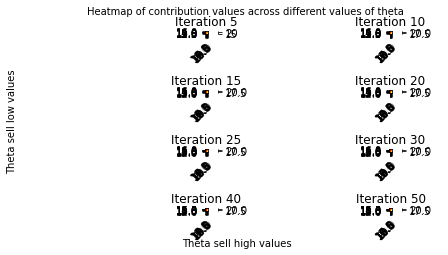

True

In [173]:
P.plot_heat_map_many(cum_avg_contrib, grid_search_theta_values_man[1], grid_search_theta_values_man[2], printIterations_man)

In [39]:
grid_search_theta_values = P.grid_search_theta_values(sheet2['low_min'], sheet2['low_max'], sheet2['high_min'], sheet2['high_max'], sheet2['increment_size'])
        # use those theta values to calculate corresponding contribution values

contribution_iterations = [P.vary_theta(param_list, policy_info, "high_low", t, grid_search_theta_values[0]) for ite in list(range(nIterations))]
        
contribution_iterations_arr = np.array(contribution_iterations)

cum_sum_contrib = contribution_iterations_arr.cumsum(axis=0)

nElem = np.arange(1,cum_sum_contrib.shape[0]+1).reshape((cum_sum_contrib.shape[0],1))

cum_avg_contrib=cum_sum_contrib/nElem

print("cum_avg_contrib")
print(cum_avg_contrib)
    
        # plot those contribution values on a heat map
P.plot_heat_map_many(cum_avg_contrib, grid_search_theta_values[1], grid_search_theta_values[2], printIterations)

TypeError: object of type <class 'pandas.core.series.Series'> cannot be safely interpreted as an integer.

In [ ]:
num_steps_low = int((low_max - low_min) / increment_size + 1)